# Eddies identification, tracking & EKE
## Josué Martínez Moreno
### 19 - October - 2017
### (Group Meeting)

* #### We know:
    * Oceanic eddies $\sim$ whirling bodies of water.
    * Transport of momentum, energy, thermodinamic properties and tracers (pollutants and biological) over long distances.
    * Studied through satellite data, numerical simulations and *in situ* measurements.
* #### Current questions:
    * Spatial descomposition of KE in adition to the current time average descomposition.
    * Seasonal variation of the energy.
    * Impacts of eddies in the climate change.
    * How eddies evolve on time?
    * Eddy genesis.
    * Do they preserve area and shape?
    * Transport of as function of depth.

In [1]:
# Loading packages:
import sys
from netCDF4 import Dataset
import os
import cmocean as cm
from trackeddy.tracking import *
from trackeddy.datastruct import *
from trackeddy.geometryfunc import *
from trackeddy.init import *
from trackeddy.physics import *
from trackeddy.plotfunc import *
from numpy import *
from pylab import *
import cmocean as cm
%matplotlib inline

from phd_functions import *

/home/156/jm5970/.local/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):


# Eddy identification algorithm
* ## SSHa Field

In [2]:
# Output data path
outputpath='/g/data/v45/akm157/model_output/mom/mom01v5_kds75/output306/'
# Import SSH values to python environment.
ncfile=Dataset(outputpath+'rregionsouthern_ocean_daily_eta_t.nc')
eta=ncfile.variables['eta_t'][:]*100
# Import geographic coordinates (Lon,Lat)
lon=ncfile.variables['xt_ocean_sub01'][:]
lat=ncfile.variables['yt_ocean_sub01'][:]

In [3]:
# Import SSH 10 yrs mean values to python environment.
ncfile=Dataset('/home/156/jm5970/notebooks/traceddy/data.input/meanssh_10yrs_AEXP.nc')
ssh_mean=squeeze(ncfile.variables['SSH_mean'][:])
# Import geographic coordinates (Lon,Lat)
lon=ncfile.variables['Longitude'][:]
lat=ncfile.variables['Latitude'][:]

In [4]:
#Area in indexes, probably in the future it will be added an option for lon - lat coords.
eta=eta[:,620:750,400:500]
ssh_mean=ssh_mean[620:750,400:500]
lon=lon[400:500]
lat=lat[620:750]
areamap=array([[0,len(lon)],[0,len(lat)]])
ssha=eta-ssh_mean

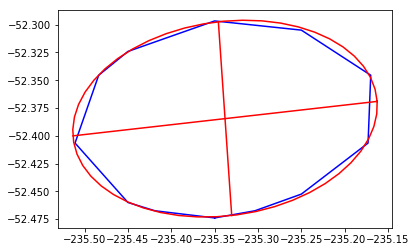

Ellipse parameters
Ellipse center =  [-235.33803003893703, -52.384613152002672]
angle of rotation =  -0.088136047694
axes (a,b) =  [0.17614456216231567, 0.087534161867054858]
Eccentricity =  0.867782030986
Area (cont,ellips) =  0.045309573994 0.0483065354638
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


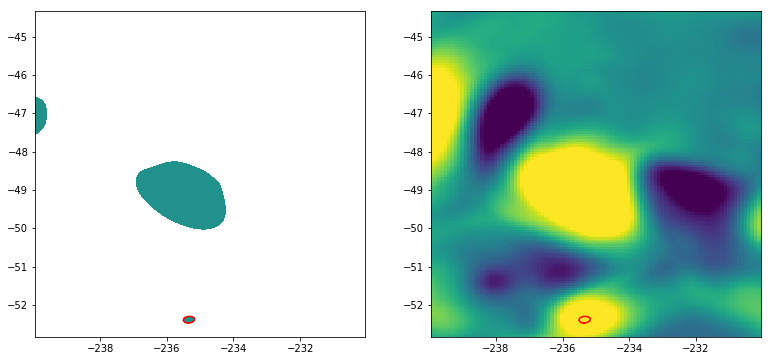

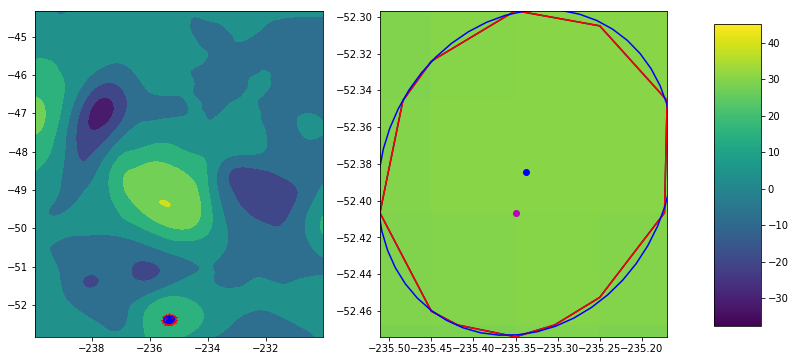

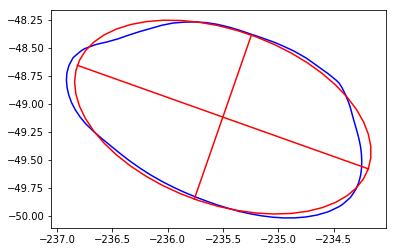

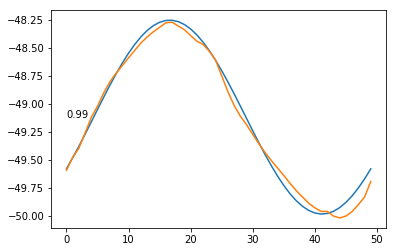

std   vs fit 0.959246791883


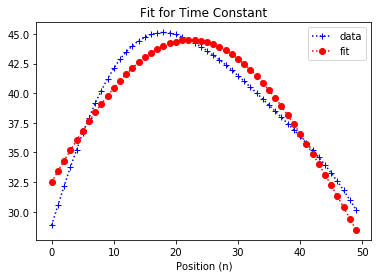

std   vs fit 0.977262679733


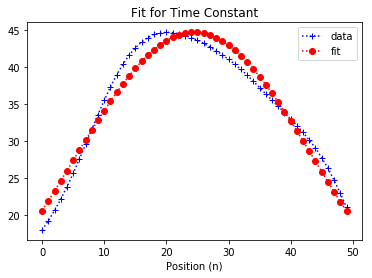

Ellipse parameters
Ellipse center =  [-235.50066924294143, -49.119406048758464]
angle of rotation =  0.338332547324
axes (a,b) =  [1.3941987028632927, 0.77718331001459717]
Eccentricity =  0.830216657707
Area (cont,ellips) =  3.37143895042 3.39474543155
Ellipse adjust =  0.99476540986
Mayor Gauss fit =  True
Minor Gauss fit =  True


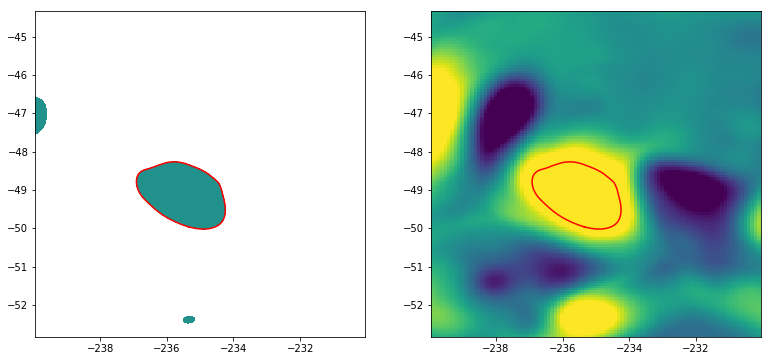

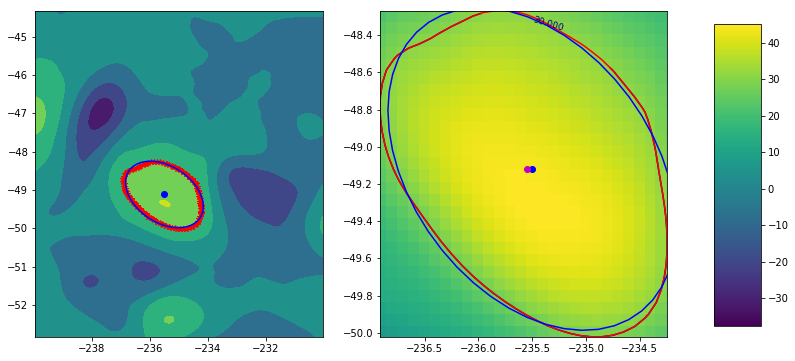

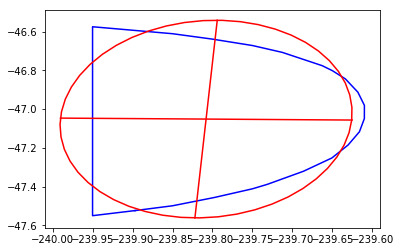

Ellipse parameters
Ellipse center =  [-239.80802017114007, -47.05124051632572]
angle of rotation =  0.0273667321681
axes (a,b) =  [0.18219823066169658, 0.51040149616758967]
Eccentricity =  0.934115692701
Area (cont,ellips) =  0.248023410677 0.291350096697
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


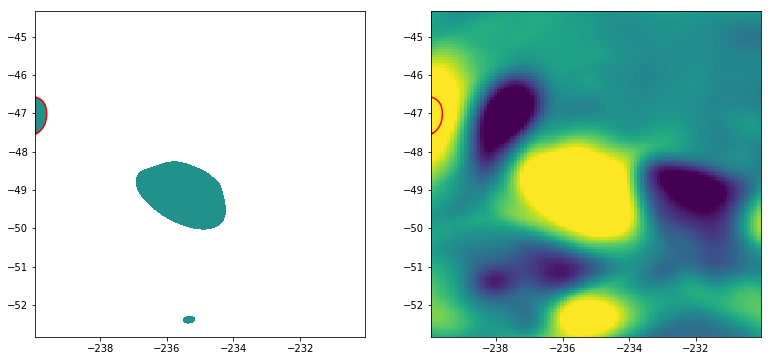

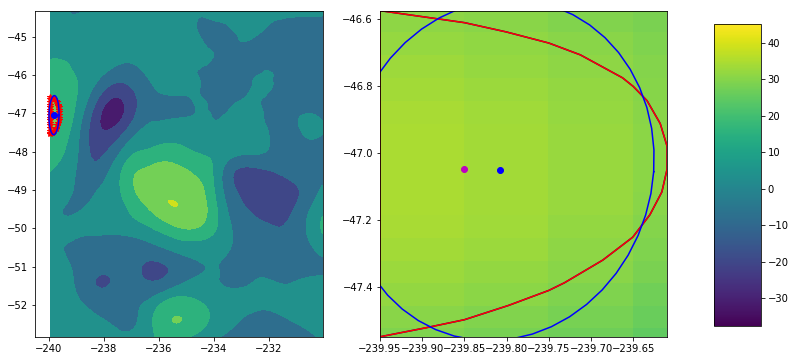

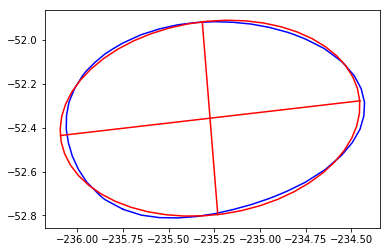

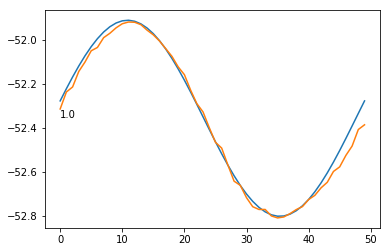

std   vs fit 0.998736773629


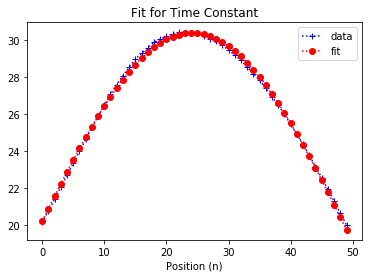

std   vs fit 0.990109714946


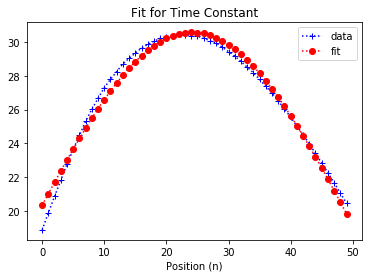

Ellipse parameters
Ellipse center =  [-235.27383229972222, -52.356601740074581]
angle of rotation =  -0.0961998752983
axes (a,b) =  [0.82335914775628927, 0.4417277489005999]
Eccentricity =  0.843903743434
Area (cont,ellips) =  1.13291045756 1.13947045692
Ellipse adjust =  0.995843803577
Mayor Gauss fit =  True
Minor Gauss fit =  True


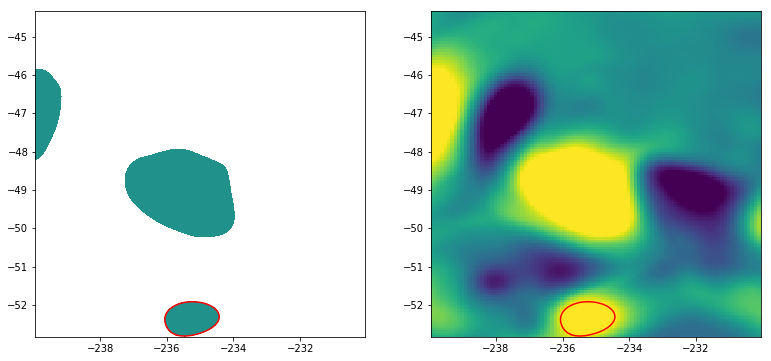

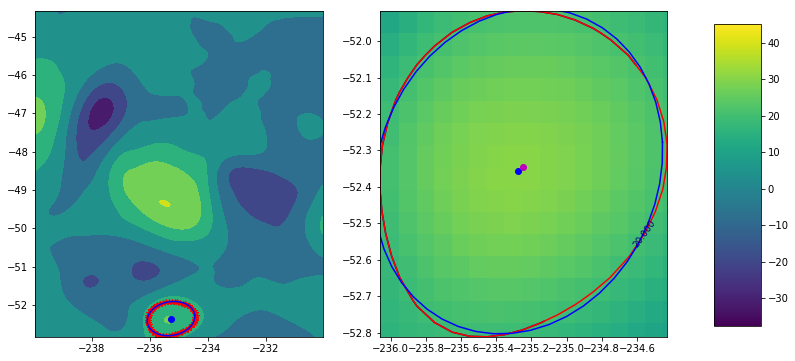

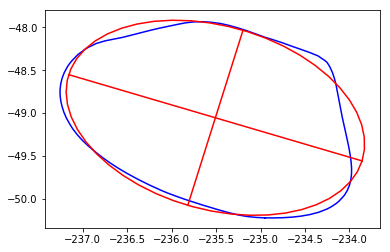

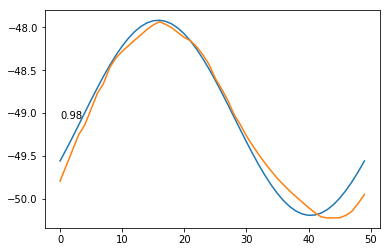

std   vs fit 0.966998138104


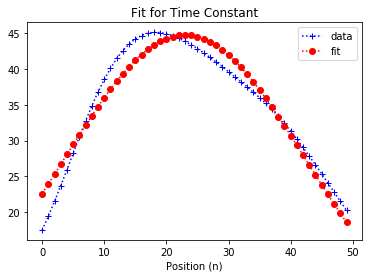

std   vs fit 0.984494807477


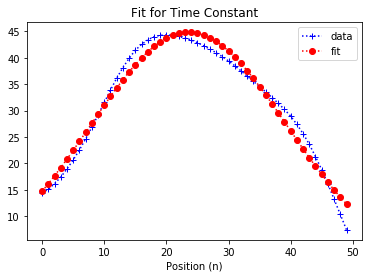

Ellipse parameters
Ellipse center =  [-235.50836643099541, -49.054412800560407]
angle of rotation =  0.295586591338
axes (a,b) =  [1.7250419279289761, 1.0660184425218919]
Eccentricity =  0.786204283652
Area (cont,ellips) =  5.65888281143 5.76133921253
Ellipse adjust =  0.98485784602
Mayor Gauss fit =  True
Minor Gauss fit =  True


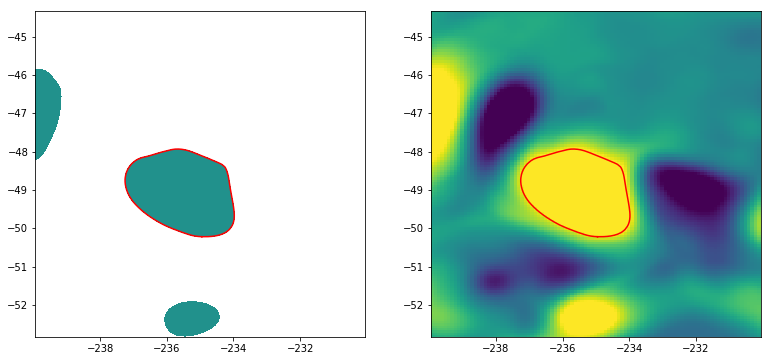

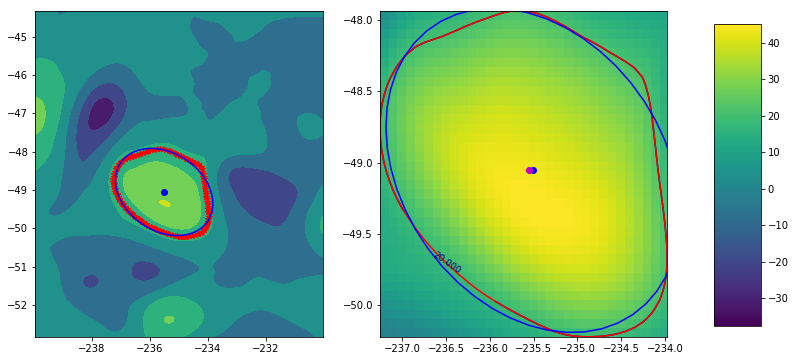

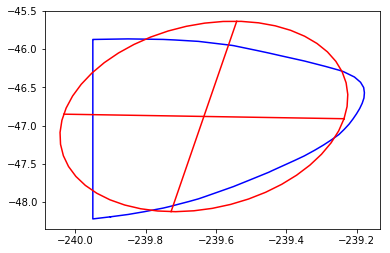

Ellipse parameters
Ellipse center =  [-239.63455250104778, -46.87969078065224]
angle of rotation =  0.0746357192894
axes (a,b) =  [0.39920109227065886, 1.2507469630856491]
Eccentricity =  0.94769742912
Area (cont,ellips) =  1.32296807604 1.56430073944
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


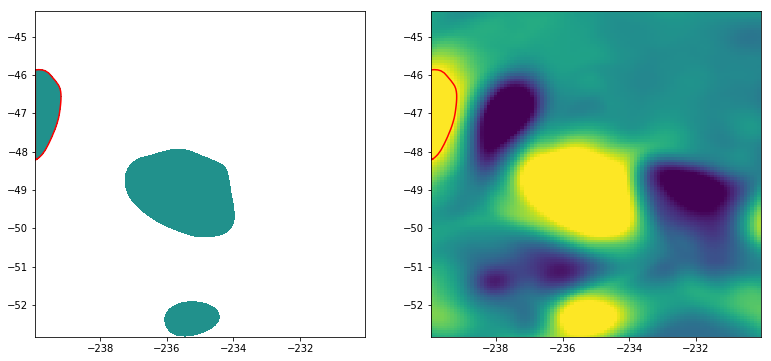

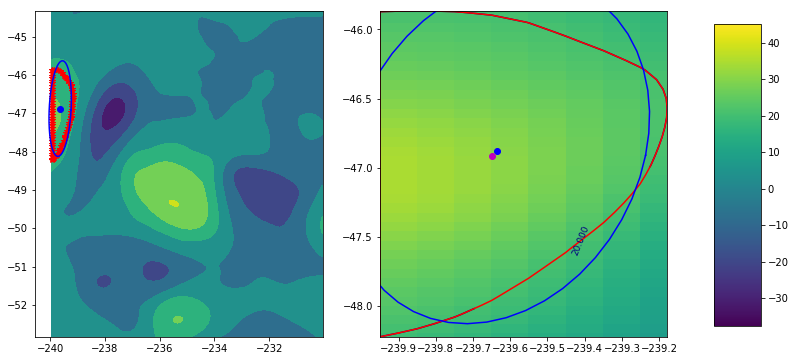

Contour is growing
eddyN 1
eddyt1pos -235.538589788 -49.0830293691
eddyt0pos -235.550905755 -49.1358108257
area [ 5.65888281] 3.37143895042
 0% [>]50% Time Elapsed: 22 s  

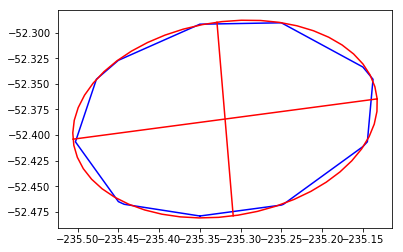

Ellipse parameters
Ellipse center =  [-235.31905517219499, -52.384364742704122]
angle of rotation =  -0.104988992377
axes (a,b) =  [0.1876489549698673, 0.095023399148776486]
Eccentricity =  0.862305053517
Area (cont,ellips) =  0.0522615069931 0.0558644830598
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


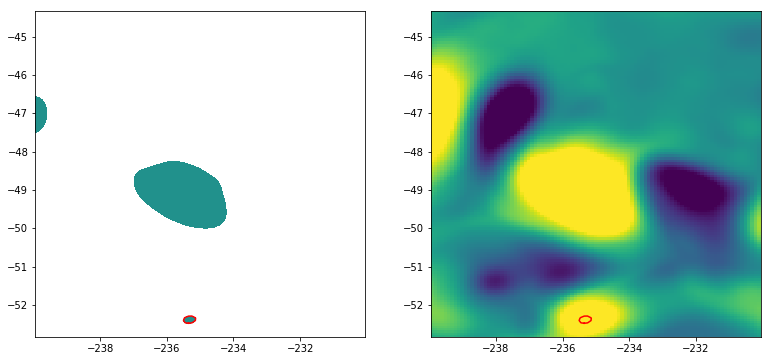

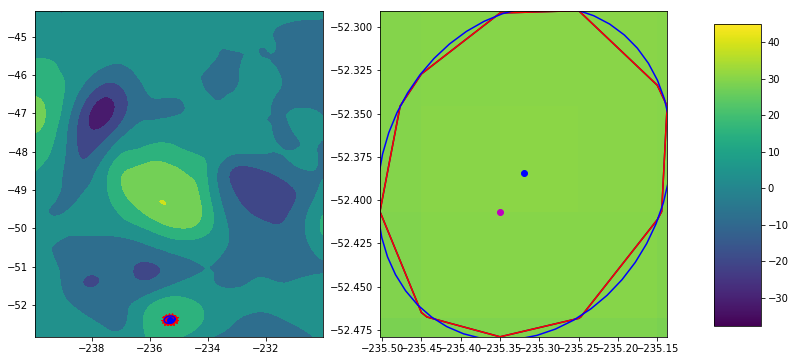

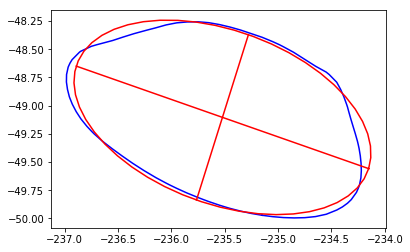

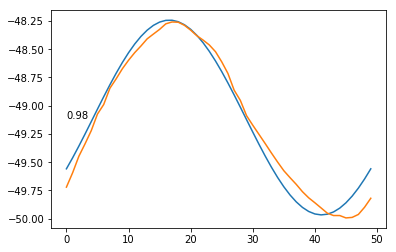

std   vs fit 0.957732823773


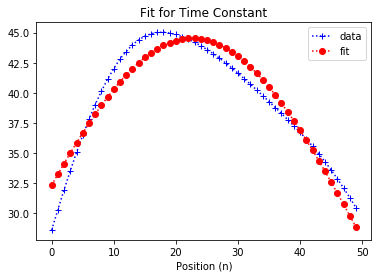

std   vs fit 0.980398096579


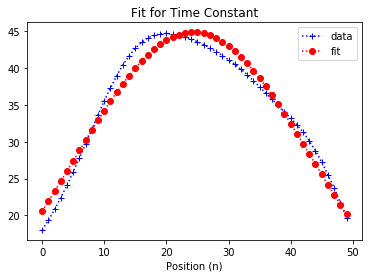

Ellipse parameters
Ellipse center =  [-235.52145265568799, -49.104411278404314]
angle of rotation =  0.320334932945
axes (a,b) =  [1.4431111691083152, 0.7721890366308517]
Eccentricity =  0.844797393597
Area (cont,ellips) =  3.45348260435 3.49126240565
Ellipse adjust =  0.984934556877
Mayor Gauss fit =  True
Minor Gauss fit =  True


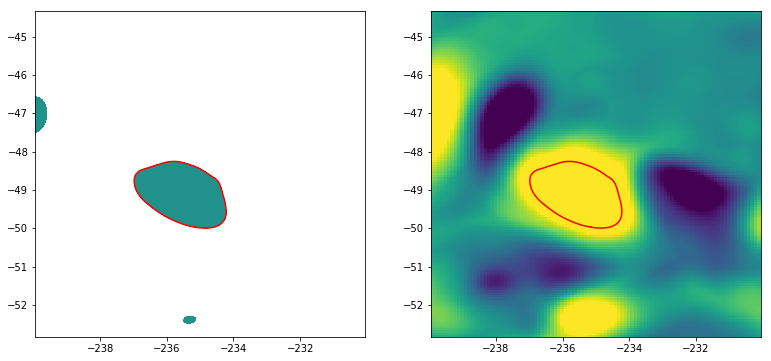

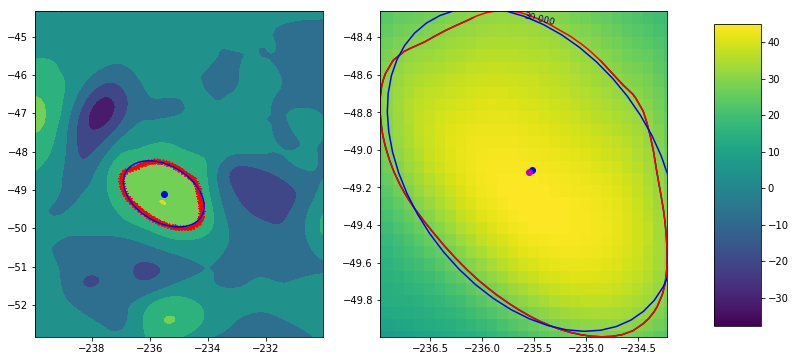

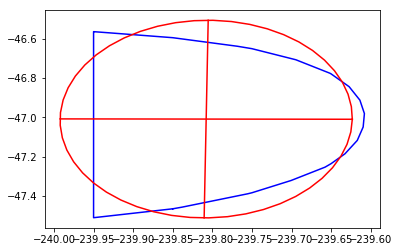

Ellipse parameters
Ellipse center =  [-239.80779113274392, -47.008481570849199]
angle of rotation =  0.00510033686897
axes (a,b) =  [0.18455606749241565, 0.50240412846083393]
Eccentricity =  0.930084422251
Area (cont,ellips) =  0.244851921918 0.290496296366
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


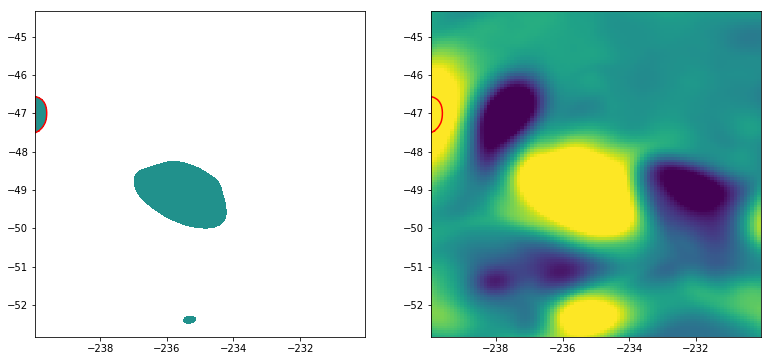

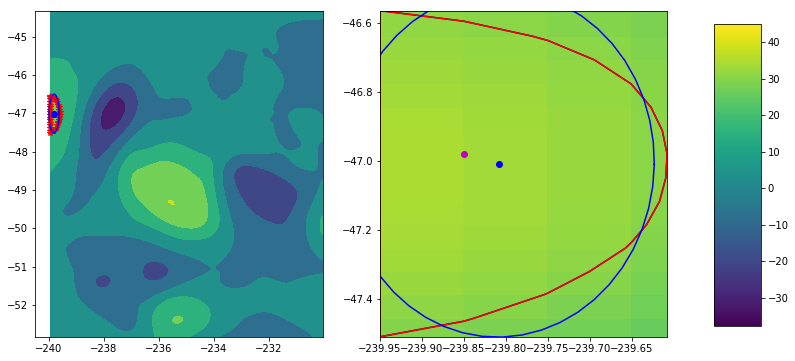

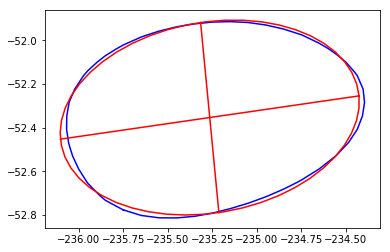

Ellipse parameters
Ellipse center =  [-235.26434704928116, -52.353356644472882]
angle of rotation =  -0.117523094181
axes (a,b) =  [0.8440855176279779, 0.43787031977885094]
Eccentricity =  0.854925295324
Area (cont,ellips) =  1.15326195513 1.15795326047
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


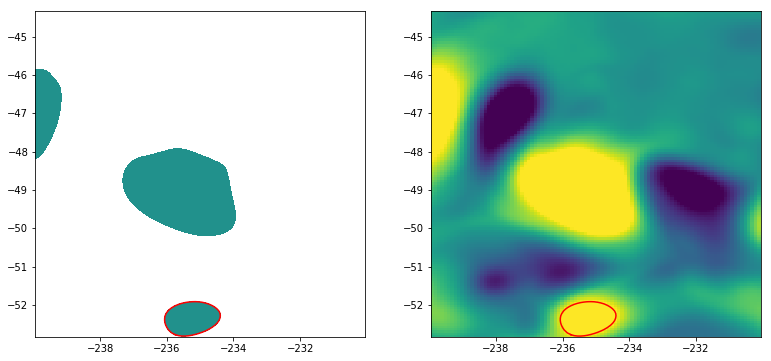

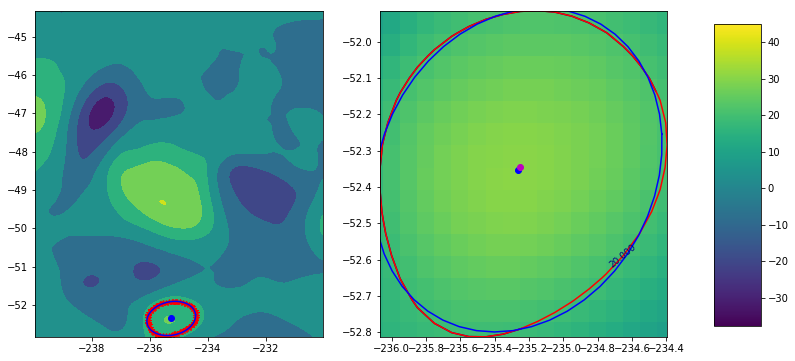

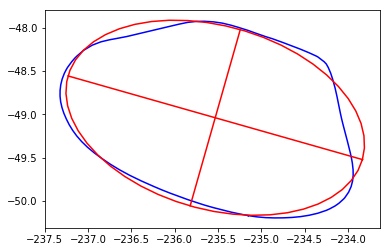

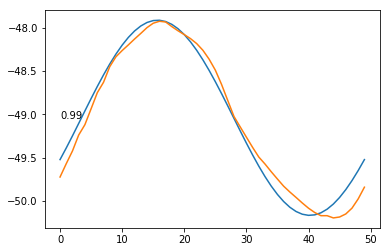

std   vs fit 0.96658888665


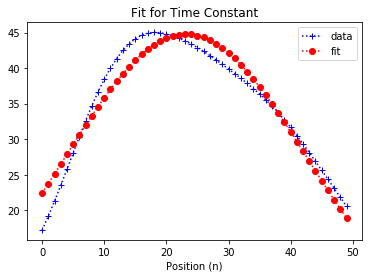

std   vs fit 0.983398019775


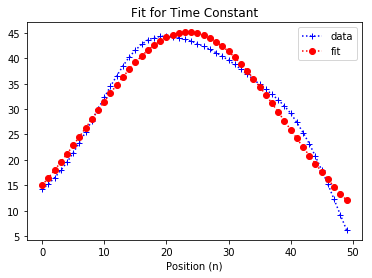

Ellipse parameters
Ellipse center =  [-235.53161319502681, -49.039971766625236]
angle of rotation =  0.276847606928
axes (a,b) =  [1.764832344971814, 1.057300092236841]
Eccentricity =  0.800678858766
Area (cont,ellips) =  5.74886651814 5.84602673887
Ellipse adjust =  0.985214091963
Mayor Gauss fit =  True
Minor Gauss fit =  True


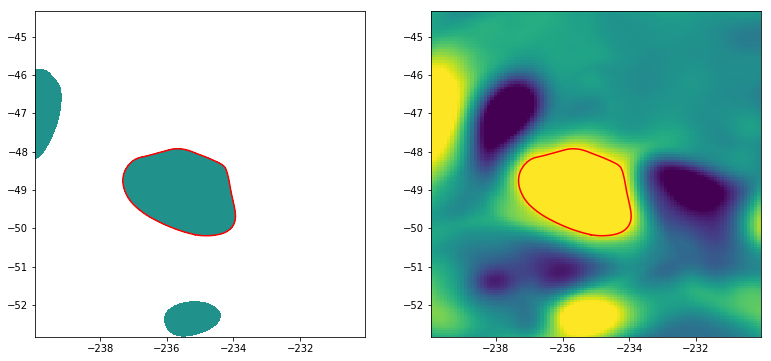

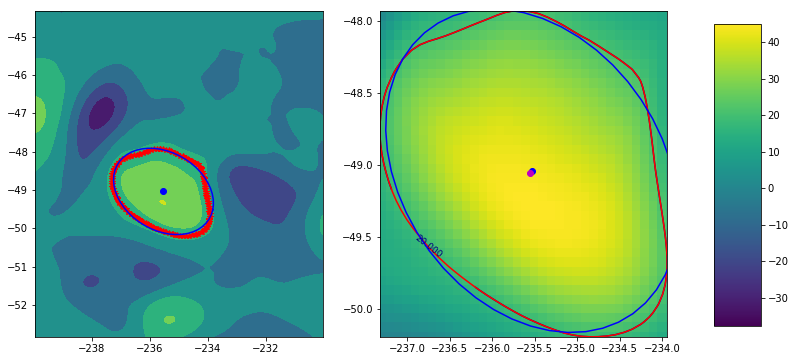

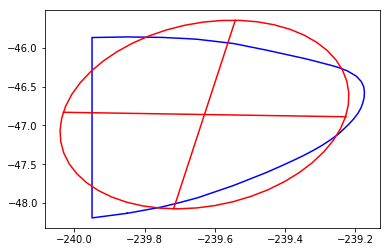

Ellipse parameters
Ellipse center =  [-239.62982450219047, -46.858326828166952]
angle of rotation =  0.072003640303
axes (a,b) =  [0.4029434324554525, 1.221407881179609]
Eccentricity =  0.944015606165
Area (cont,ellips) =  1.32602507947 1.54192720947
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


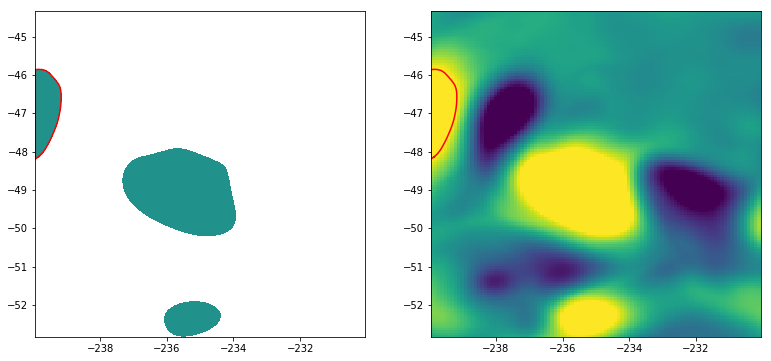

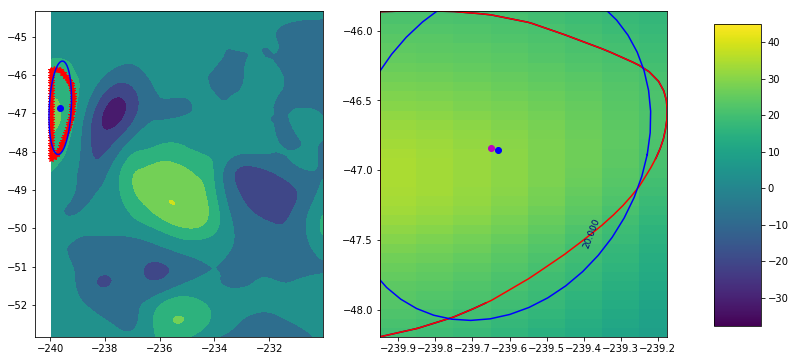

 0% [=>]100% Time Elapsed: 43 s  

In [5]:
eddytd=analyseddyzt(eta,lon,lat,0,2,1,30,20,10,data_meant=ssh_mean,areamap=areamap,mask=''\
                    ,destdir='',physics='',eccenfit=0.85,ellipsrsquarefit=0.90,gaussrsquarefit=0.90,\
                    diagnostics=True,pprint=False)

* ##  Relative Vorticity

### $\zeta_r=\frac{\partial v}{\partial x}-\frac{\partial u}{\partial y}$

In [2]:
# Output data path
outputpath='/g/data/v45/akm157/model_output/mom/mom01v5_kds75/output306/'
# Import SSH values to python environment.
ncfile=Dataset(outputpath+'rregionsouthern_ocean_daily_u.nc')
u=ncfile.variables['u'][0:2,0,:,:]
ncfile=Dataset(outputpath+'rregionsouthern_ocean_daily_v.nc')
v=ncfile.variables['v'][0:2,0,:,:]
# Import geographic coordinates (Lon,Lat)
lon=ncfile.variables['xu_ocean_sub01'][:]
lat=ncfile.variables['yu_ocean_sub01'][:]

In [12]:
vorticity=zeros(shape(u))
for ii in range(shape(u)[0]):
    vorticity[ii,:,:]=vorticity2D(u[ii,:,:],v[ii,:,:],lon,lat) 

In [13]:
vorticity=vorticity[:,620:750,400:500]
lon=lon[400:500]
lat=lat[620:750]
areamap=array([[0,len(lon)],[0,len(lat)]])

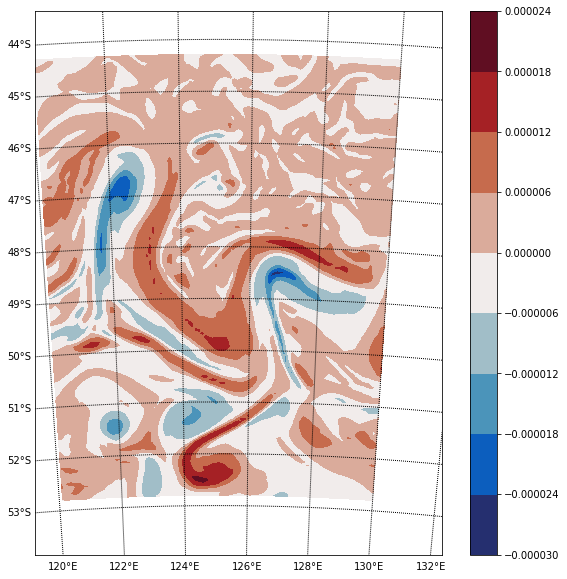

In [18]:
fig = plt.figure(figsize=(10, 10),facecolor='white')
gs = gridspec.GridSpec(1, 1)
ax1 = plt.subplot(gs[0,0])
lonmm,latmm=np.meshgrid(lon,lat)
map = Basemap(projection='stere',lat_0=mean(lat),lon_0=mean(lon),llcrnrlat=latmm.min()-1,urcrnrlat=latmm.max()+1,\
            llcrnrlon=lonmm.min()-1,urcrnrlon=lonmm.max()+1,rsphere=6371200.0,resolution='c',ax=ax1)
lonm,latm=map(lonmm,latmm)
map.drawmeridians(np.arange(0,360,2),labels=[0,0,0,1],fontsize=10)
map.drawparallels(np.arange(0,-360,-1),labels=[1,0,0,0],fontsize=10)
map.fillcontinents(color='black',lake_color='black')
map.drawcoastlines()
map.drawcoastlines()
im=ax1.contourf(lonm,latm,vorticity[0,:,:],shading='gouraud',cmap=cm.cm.balance,alpha=1)
fig.colorbar(im, orientation='vertical')

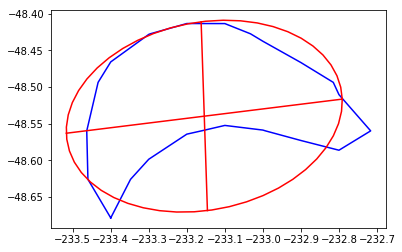

Ellipse parameters
Ellipse center =  [-233.15409671258899, -48.539728925310889]
angle of rotation =  -0.0641207712777
axes (a,b) =  [0.36350666101209456, 0.12917464217169128]
Eccentricity =  0.934730651864
Area (cont,ellips) =  0.0958310601127 0.147112207836
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


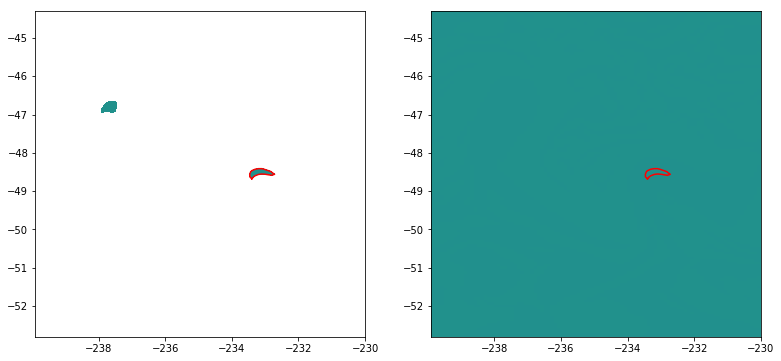

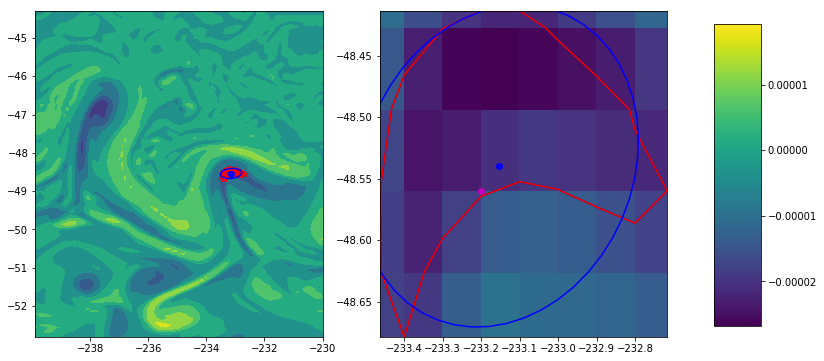

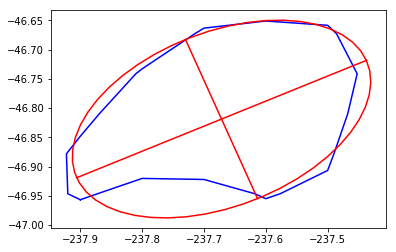

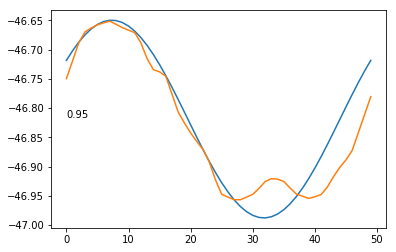

std   vs fit 0.993204770373


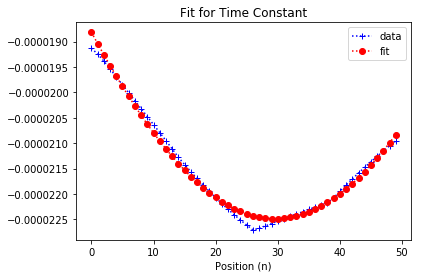

std   vs fit 0.949251229157


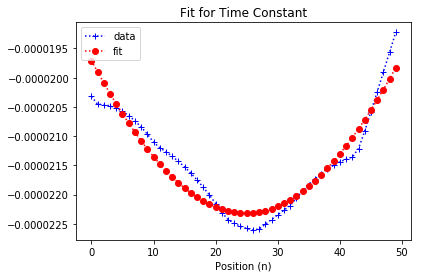

Ellipse parameters
Ellipse center =  [-237.67159088695129, -46.81866212083434]
angle of rotation =  -0.404774779142
axes (a,b) =  [0.25489350987527354, 0.14807157797416826]
Eccentricity =  0.813963905852
Area (cont,ellips) =  0.101636591426 0.118246843049
Ellipse adjust =  0.945925833733
Mayor Gauss fit =  True
Minor Gauss fit =  True


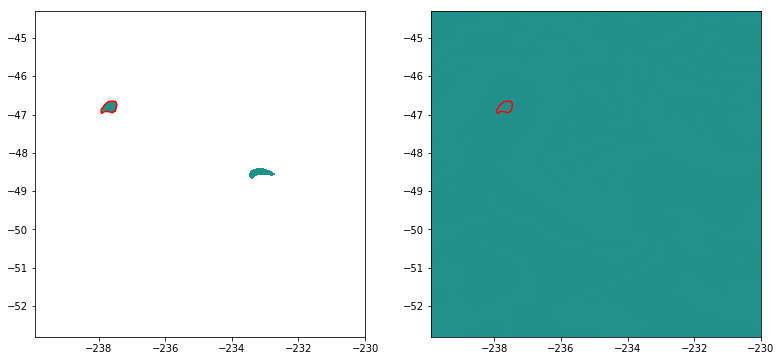

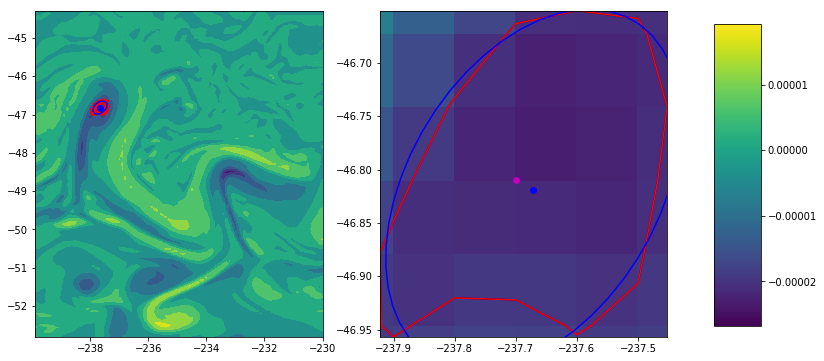

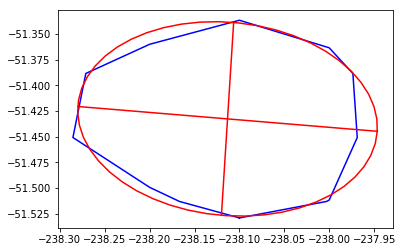

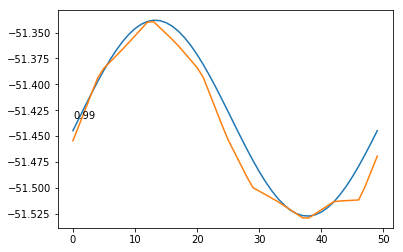

std   vs fit 0.993755332709


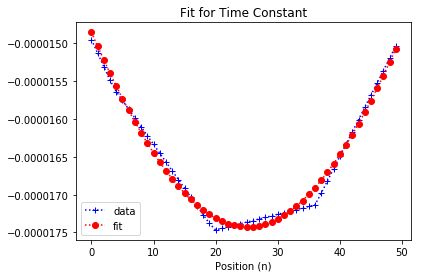

std   vs fit 0.9833732534


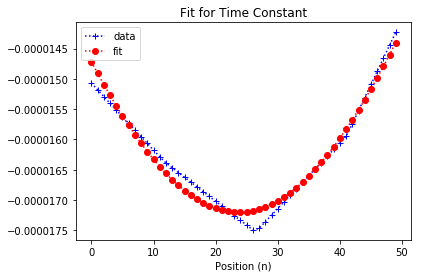

Ellipse parameters
Ellipse center =  [-238.11323054758915, -51.432711314083988]
angle of rotation =  0.0723531073741
axes (a,b) =  [0.16722610900470114, 0.094182789241392173]
Eccentricity =  0.826316357951
Area (cont,ellips) =  0.0449176645634 0.0493440401624
Ellipse adjust =  0.987915842775
Mayor Gauss fit =  True
Minor Gauss fit =  True


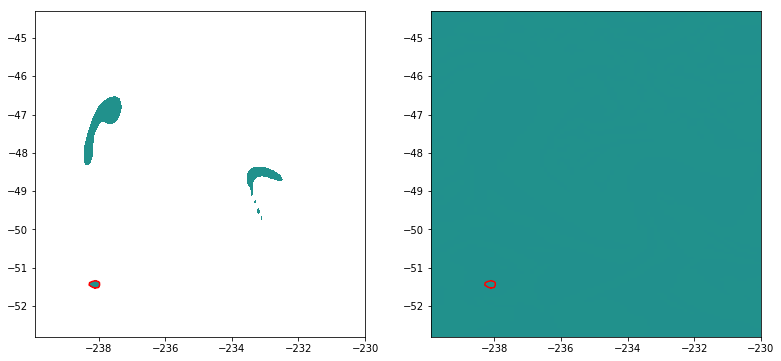

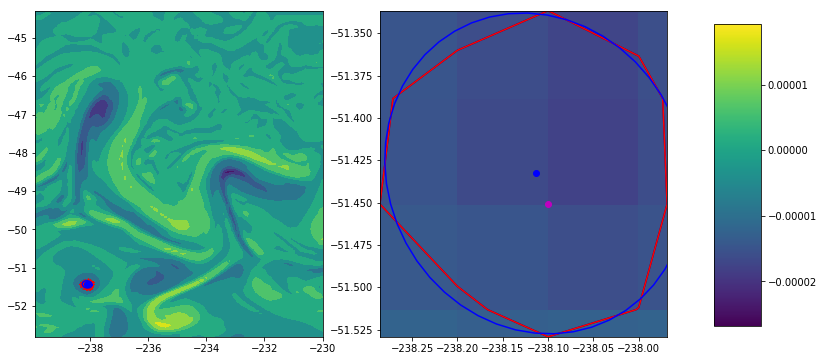

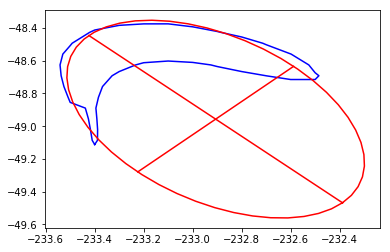

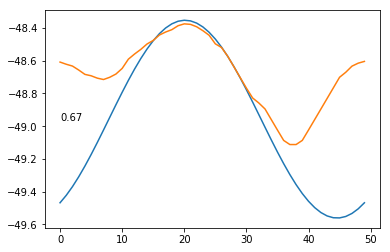

Ellipse parameters
Ellipse center =  [-232.90608278305152, -48.957090391206165]
angle of rotation =  0.778735238716
axes (a,b) =  [0.72734115064005334, 0.45299630695672199]
Eccentricity =  0.782372067112
Area (cont,ellips) =  0.255086240009 1.03226664232
Ellipse adjust =  0.673970883487
Mayor Gauss fit =  False
Minor Gauss fit =  False


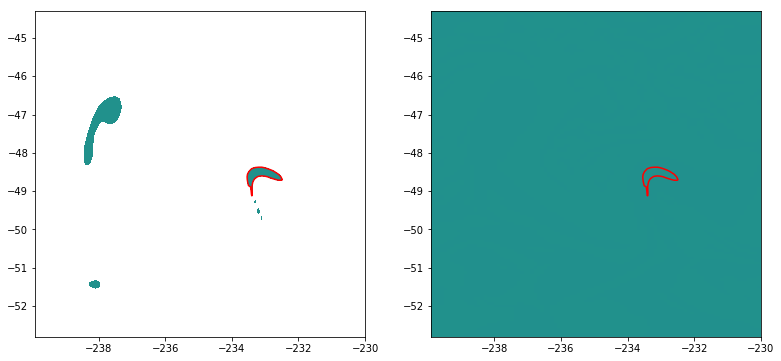

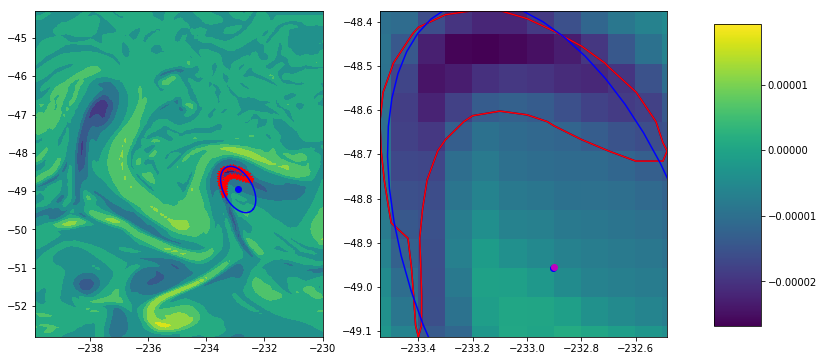

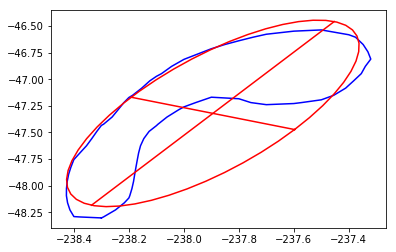

Ellipse parameters
Ellipse center =  [-237.89446692425673, -47.320268970341786]
angle of rotation =  0.472548134623
axes (a,b) =  [0.33373794966399722, 0.97001611526724818]
Eccentricity =  0.938949853426
Area (cont,ellips) =  0.645916175621 1.01424672856
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


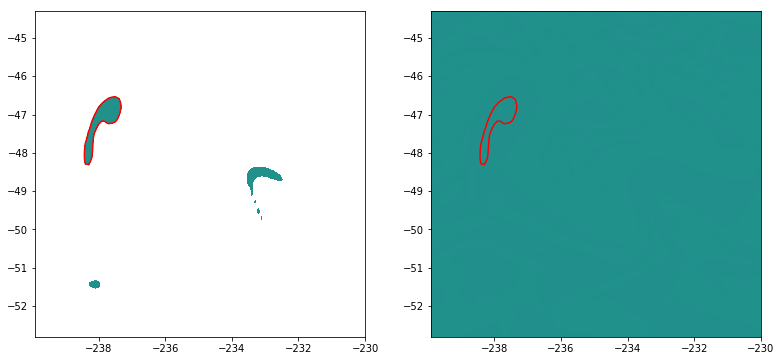

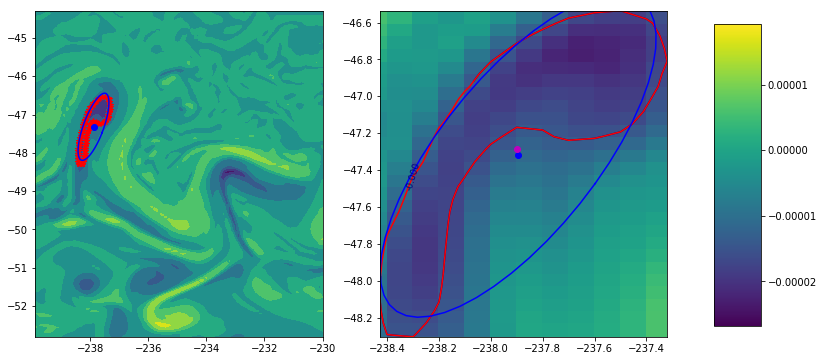

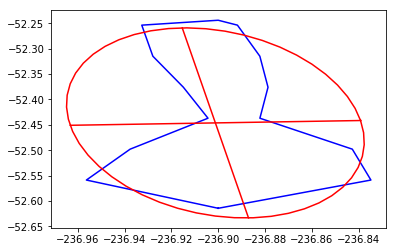

Ellipse parameters
Ellipse center =  [-236.90120776611727, -52.446318590974883]
angle of rotation =  -0.0755280393173
axes (a,b) =  [0.062213461675592802, 0.18762627750733743]
Eccentricity =  0.943426467631
Area (cont,ellips) =  0.0206594089104 0.0365710224141
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


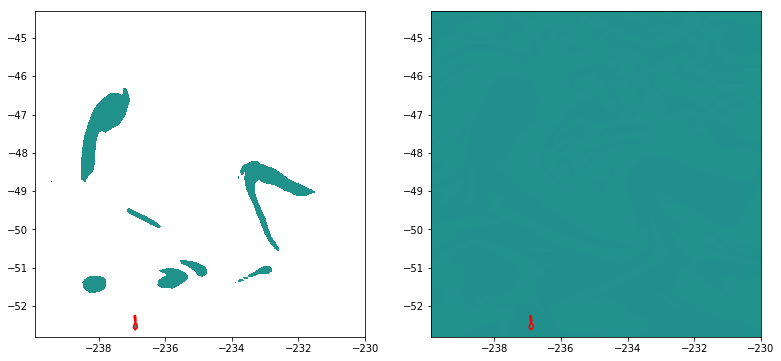

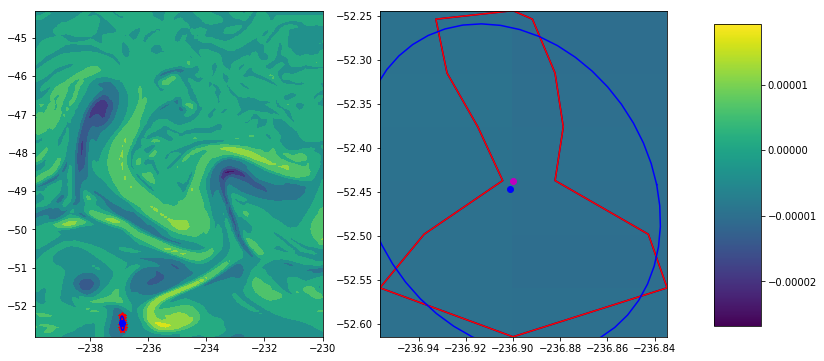

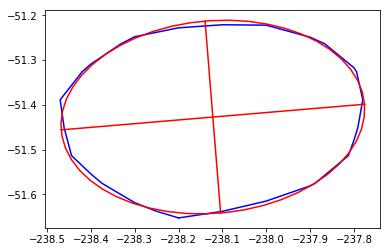

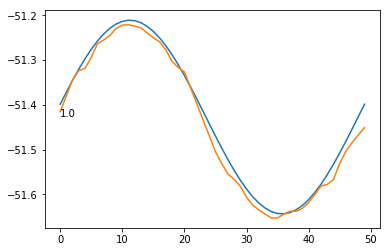

std   vs fit 0.993268493537


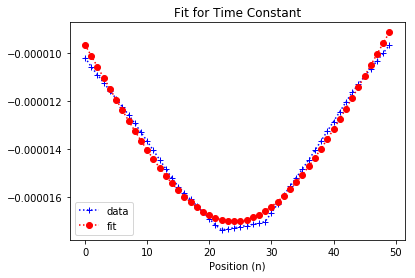

std   vs fit 0.99521704447


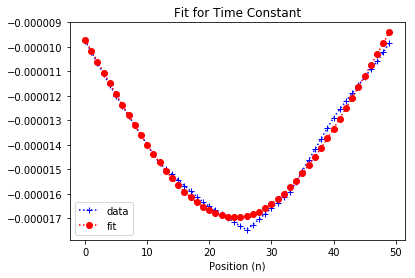

Ellipse parameters
Ellipse center =  [-238.12171197400644, -51.42708676425454]
angle of rotation =  -0.0825000123003
axes (a,b) =  [0.34718153442863897, 0.21513970517472272]
Eccentricity =  0.784858546381
Area (cont,ellips) =  0.229338706587 0.234010993328
Ellipse adjust =  0.997107776746
Mayor Gauss fit =  True
Minor Gauss fit =  True


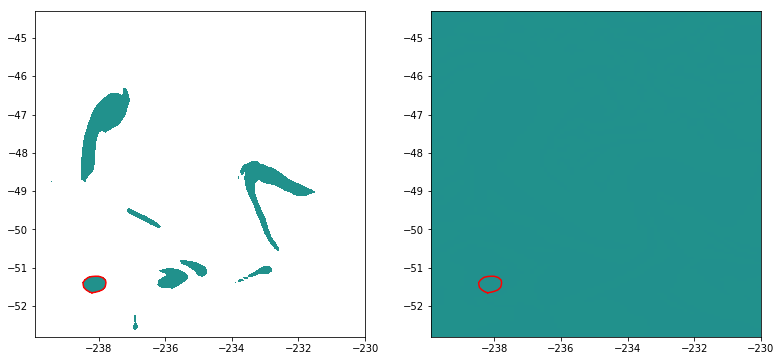

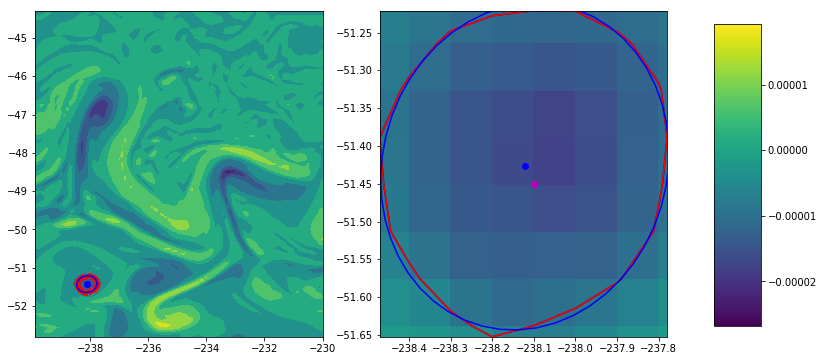

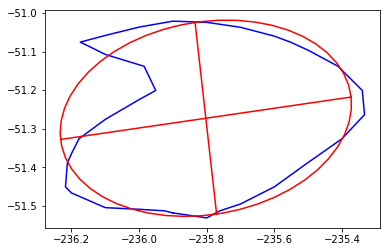

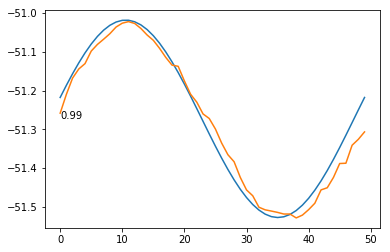

std   vs fit 0.808971916238


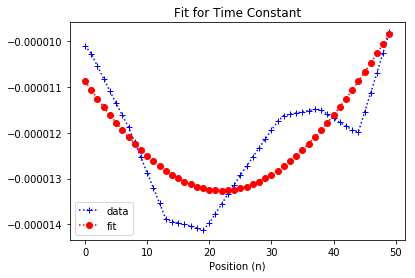

Ellipse parameters
Ellipse center =  [-235.80277875151864, -51.272893169500648]
angle of rotation =  -0.127453088497
axes (a,b) =  [0.43293172392634532, 0.25071380356541562]
Eccentricity =  0.815251526342
Area (cont,ellips) =  0.305453309615 0.340060922783
Ellipse adjust =  0.98557070024
Mayor Gauss fit =  False
Minor Gauss fit =  False


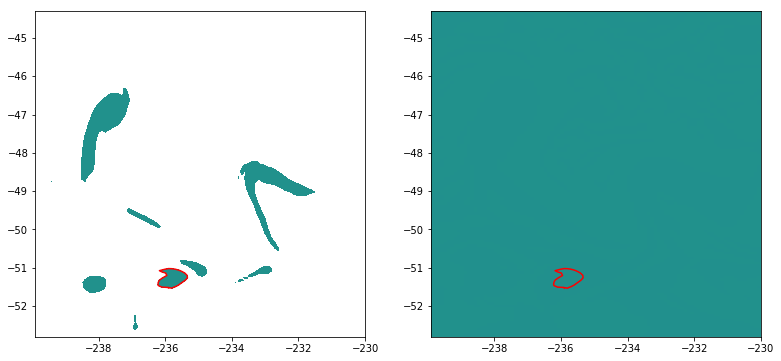

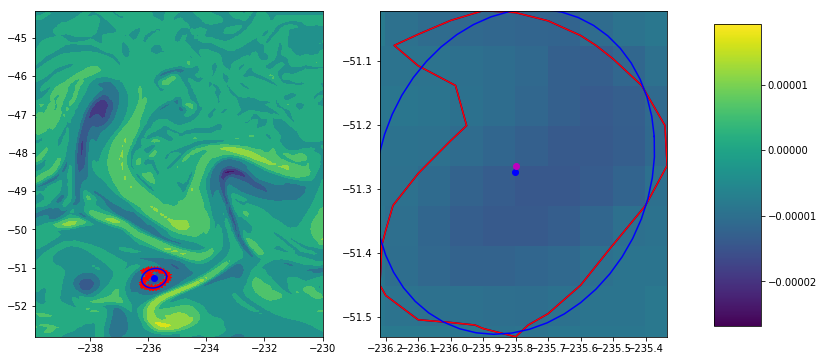

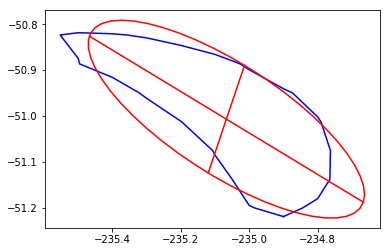

Ellipse parameters
Ellipse center =  [-235.06685253296843, -51.006987841844676]
angle of rotation =  0.424349314349
axes (a,b) =  [0.4396322692364823, 0.12881106707891385]
Eccentricity =  0.956113269053
Area (cont,ellips) =  0.13738913351 0.177419688785
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


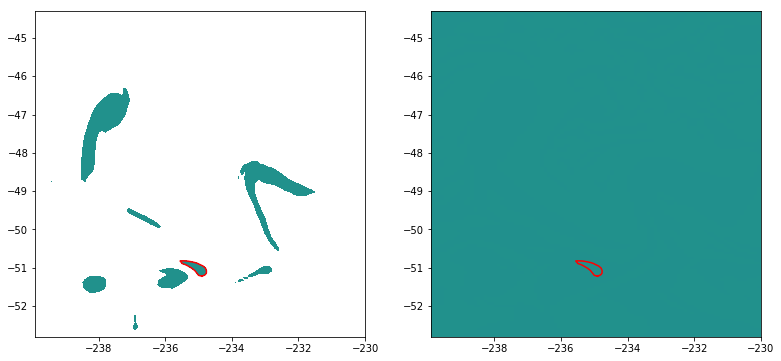

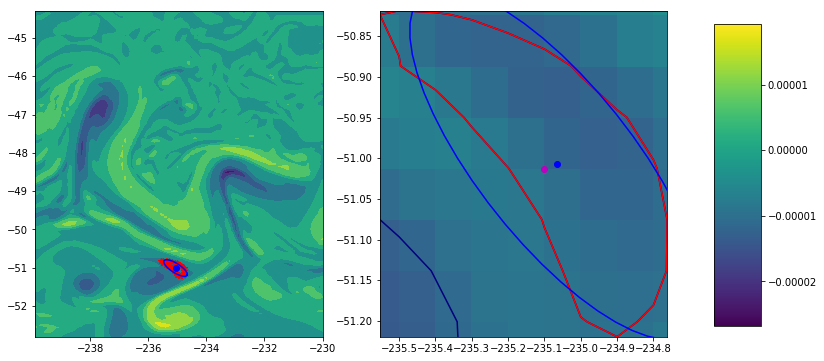

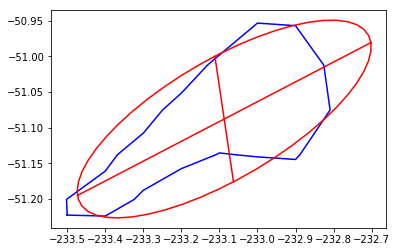

Ellipse parameters
Ellipse center =  [-233.08746410374914, -51.088098478557392]
angle of rotation =  -0.271053301378
axes (a,b) =  [0.40024317580112323, 0.091398473007382311]
Eccentricity =  0.973577381819
Area (cont,ellips) =  0.079332394962 0.114609851153
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


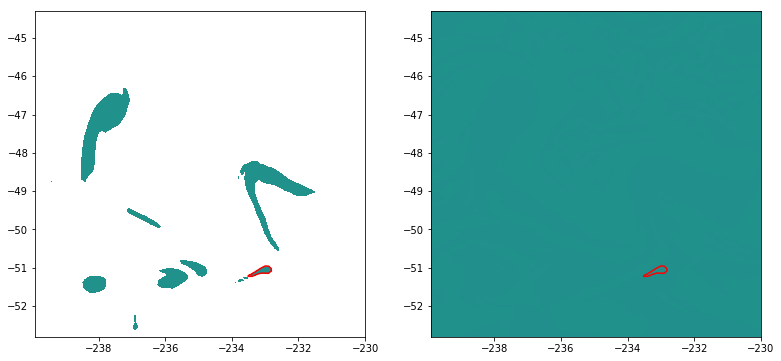

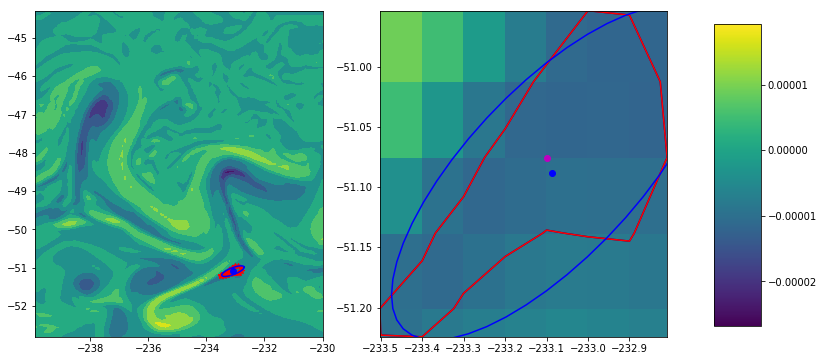

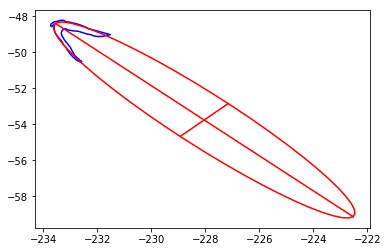

Ellipse parameters
Ellipse center =  [-228.04363033974013, -53.756999190699872]
angle of rotation =  0.771942574534
axes (a,b) =  [7.6952790168785494, 1.2745211479121736]
Eccentricity =  0.986189011141
Area (cont,ellips) =  1.03306607262 30.7277308318
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


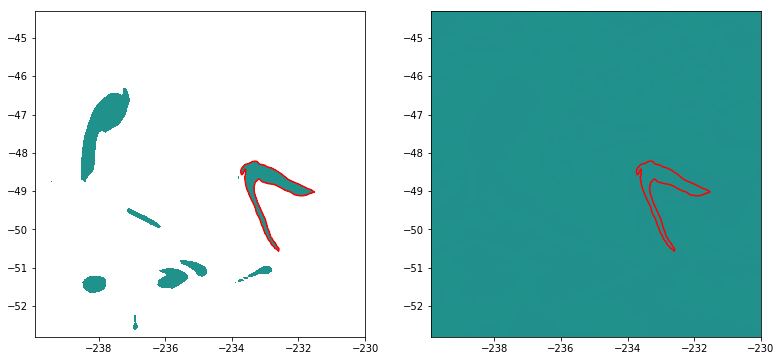

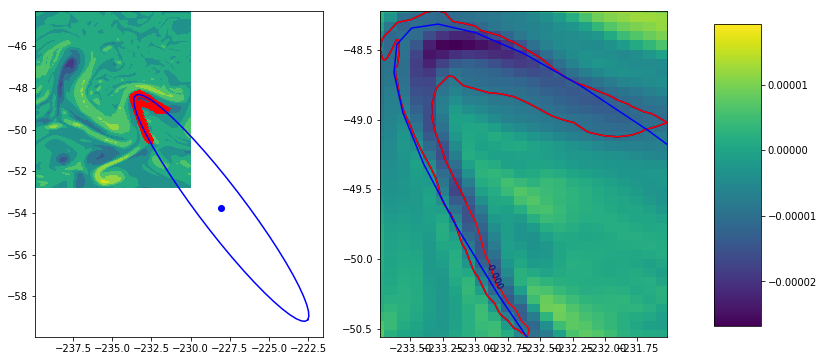

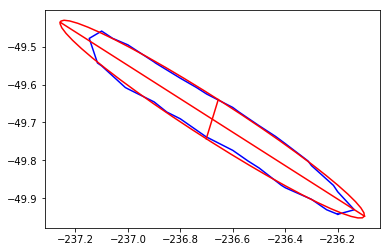

Ellipse parameters
Ellipse center =  [-236.6783350977048, -49.691250798156148]
angle of rotation =  0.415909771082
axes (a,b) =  [0.63397851865497423, 0.05657684232099254]
Eccentricity =  0.996010067056
Area (cont,ellips) =  0.100448274839 0.112375676748
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


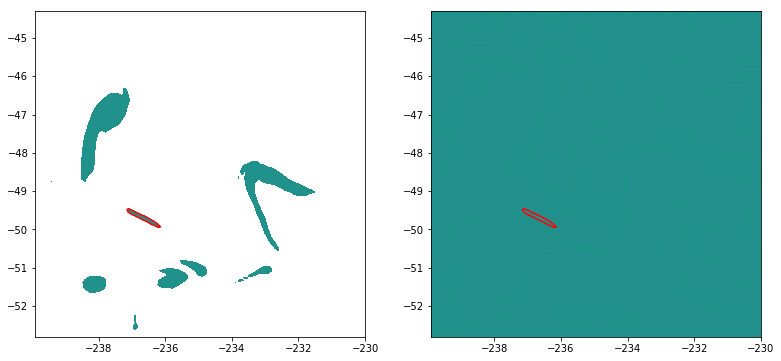

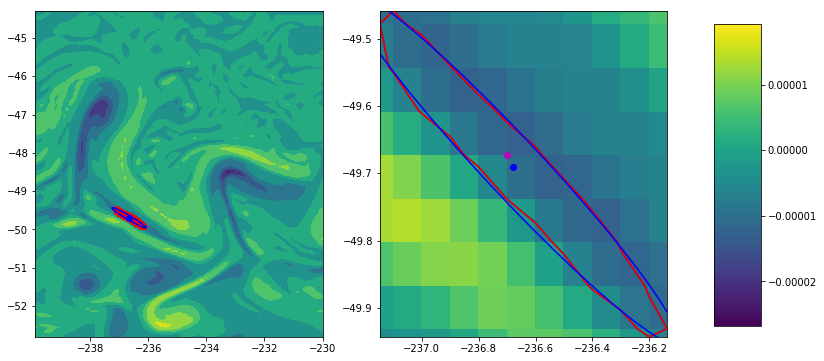

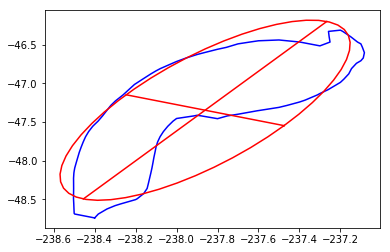

Ellipse parameters
Ellipse center =  [-237.86080057661934, -47.348257065897783]
angle of rotation =  0.477633860967
axes (a,b) =  [0.4342189812114215, 1.2933070263240523]
Eccentricity =  0.94195357315
Area (cont,ellips) =  1.2803393869 1.75941995642
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


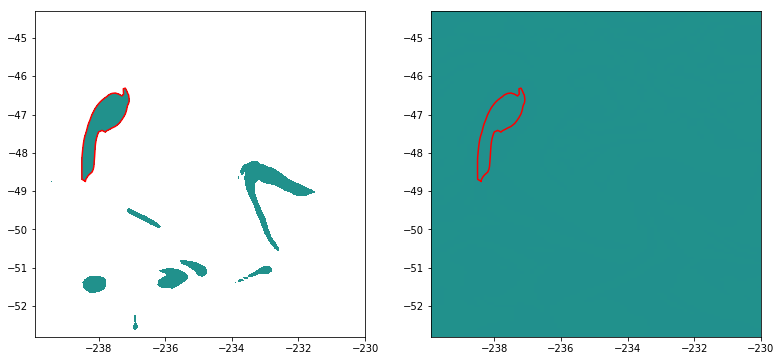

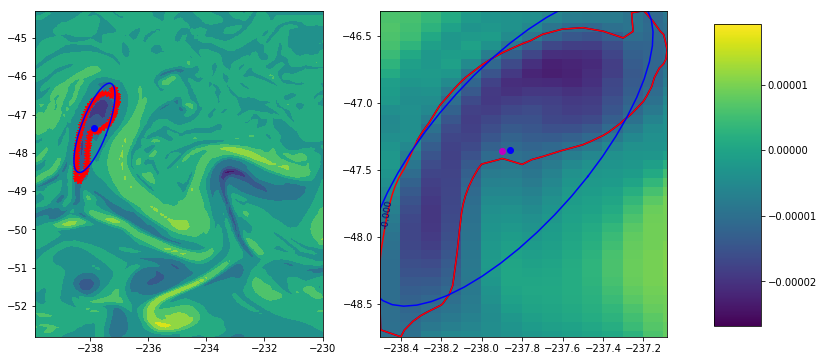

 0% [>]50% Time Elapsed: 44 s  

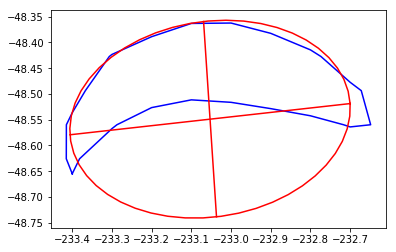

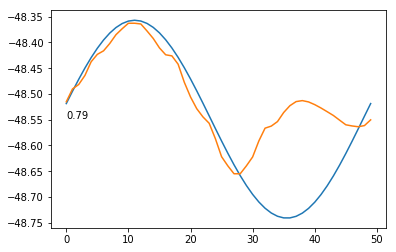

Ellipse parameters
Ellipse center =  [-233.05290279098577, -48.548989643139286]
angle of rotation =  -0.0856733656892
axes (a,b) =  [0.35413302632416715, 0.19048339299060429]
Eccentricity =  0.843017233289
Area (cont,ellips) =  0.10024327453 0.211340447073
Ellipse adjust =  0.787167165708
Mayor Gauss fit =  False
Minor Gauss fit =  False


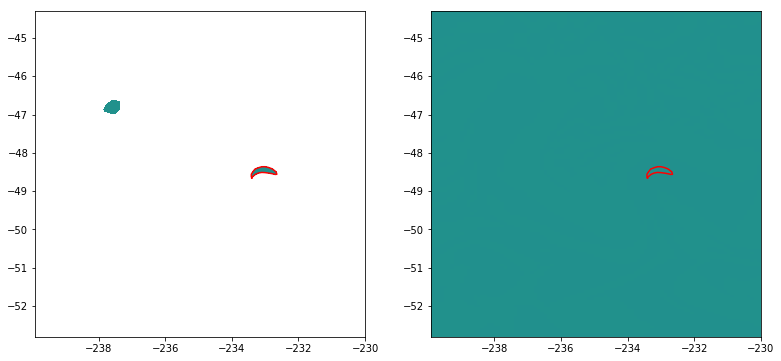

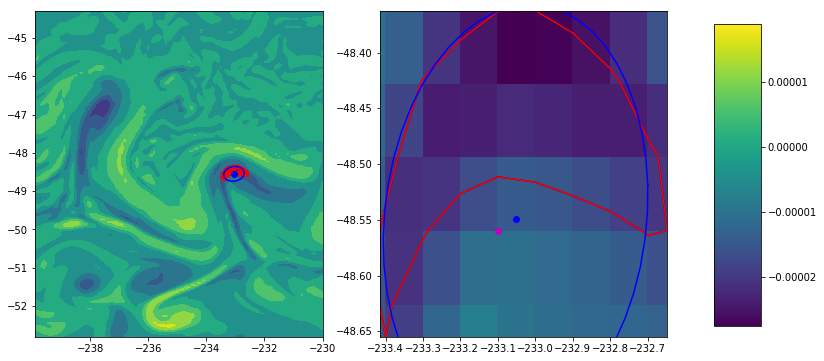

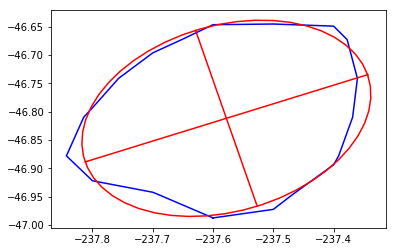

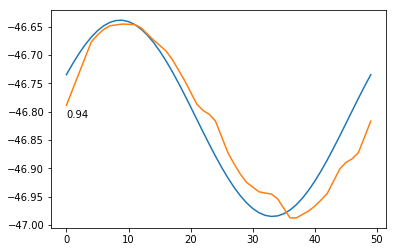

std   vs fit 0.975032662891


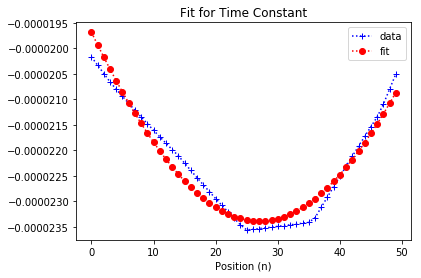

std   vs fit 0.971463264064


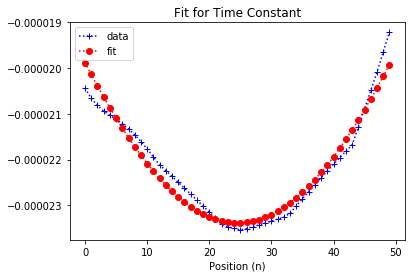

Ellipse parameters
Ellipse center =  [-237.57785742266887, -46.811700637962019]
angle of rotation =  -0.317836317557
axes (a,b) =  [0.24657160311519161, 0.16354990764229305]
Eccentricity =  0.748357326174
Area (cont,ellips) =  0.119914709765 0.126343363605
Ellipse adjust =  0.940317882406
Mayor Gauss fit =  True
Minor Gauss fit =  True


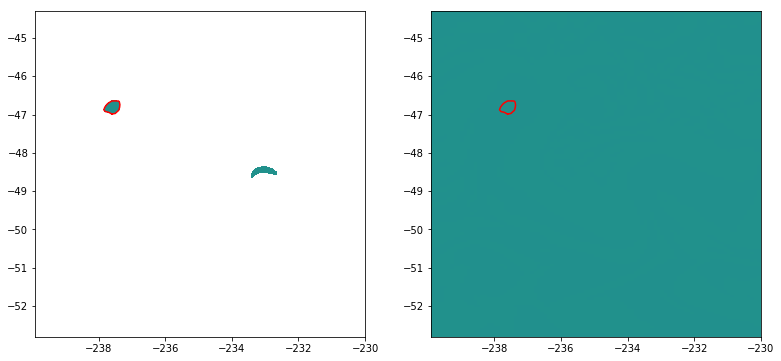

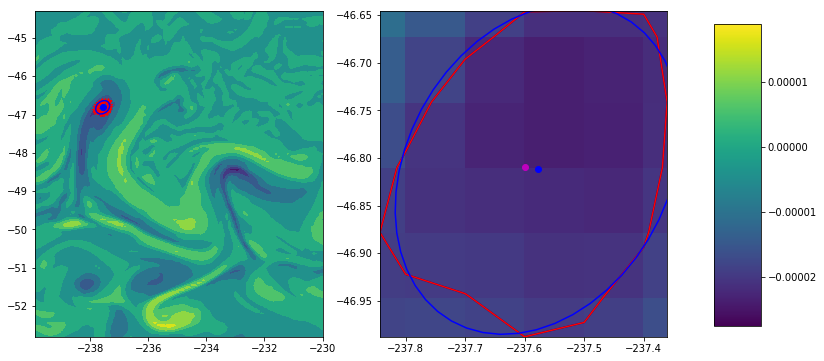

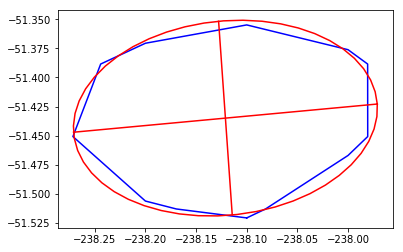

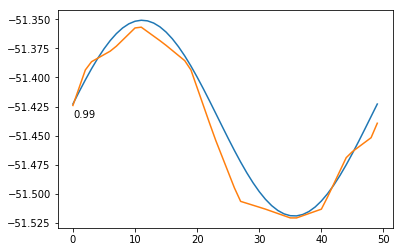

std   vs fit 0.989739550248


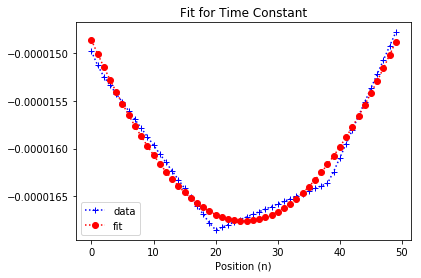

std   vs fit 0.989163860621


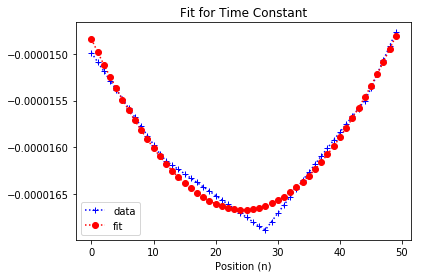

Ellipse parameters
Ellipse center =  [-238.12103585500807, -51.434994826280921]
angle of rotation =  -0.0806927758762
axes (a,b) =  [0.15038512852502572, 0.083578296401183944]
Eccentricity =  0.83134163863
Area (cont,ellips) =  0.0356361303566 0.0393783467589
Ellipse adjust =  0.986517968507
Mayor Gauss fit =  True
Minor Gauss fit =  True


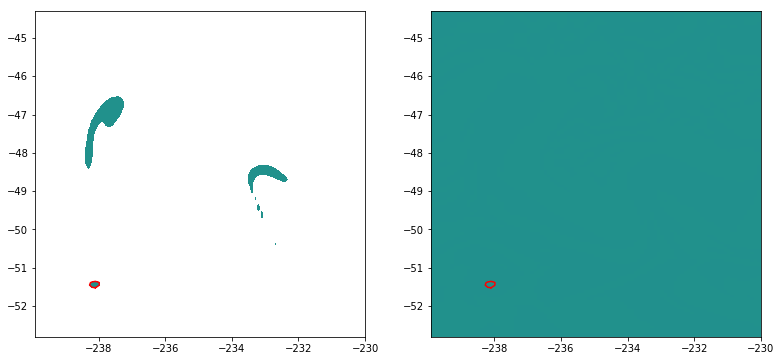

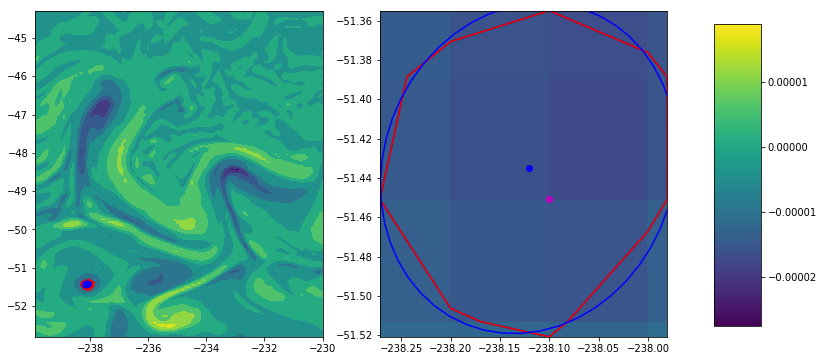

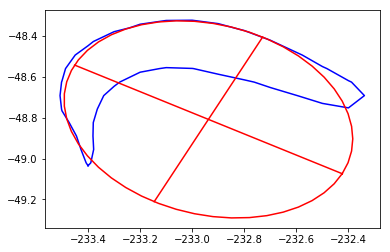

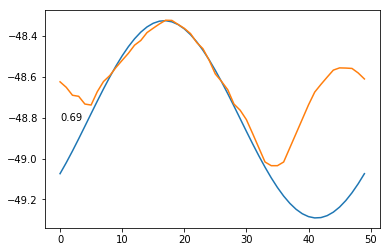

Ellipse parameters
Ellipse center =  [-232.93779090640129, -48.80834791271306]
angle of rotation =  0.477299667894
axes (a,b) =  [0.57842709904306933, 0.45323656970507498]
Eccentricity =  0.621306897385
Area (cont,ellips) =  0.279811288114 0.821358295681
Ellipse adjust =  0.691763533549
Mayor Gauss fit =  False
Minor Gauss fit =  False


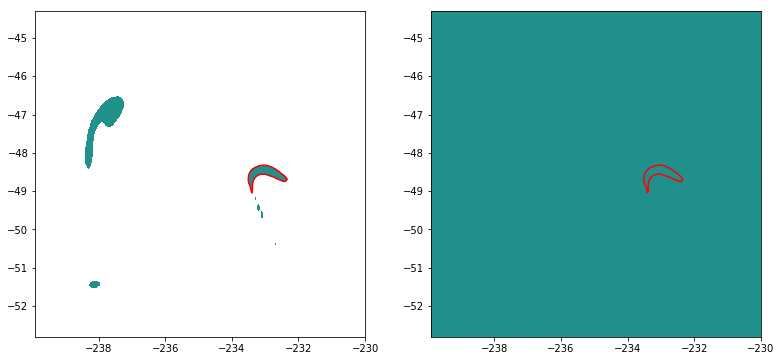

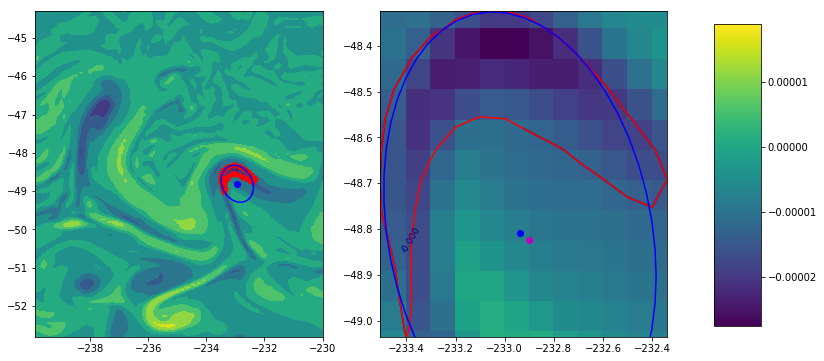

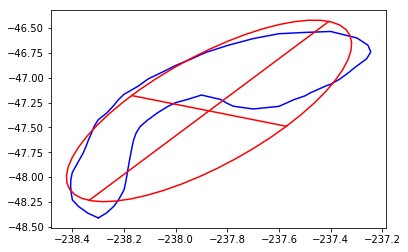

Ellipse parameters
Ellipse center =  [-237.87111831779401, -47.333868030701396]
angle of rotation =  0.476369941853
axes (a,b) =  [0.33702159376267488, 1.0122792160486662]
Eccentricity =  0.942950332579
Area (cont,ellips) =  0.660430604592 1.06885088392
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


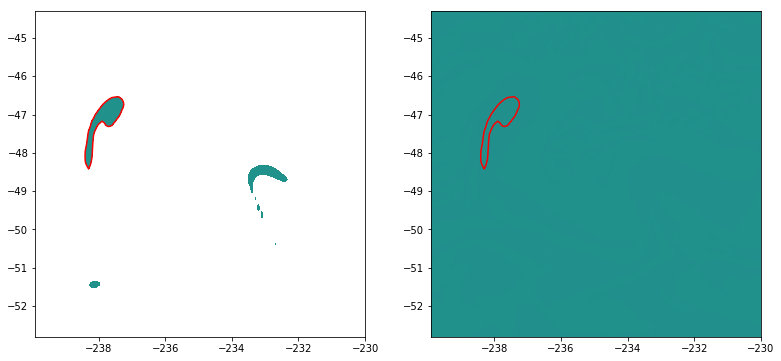

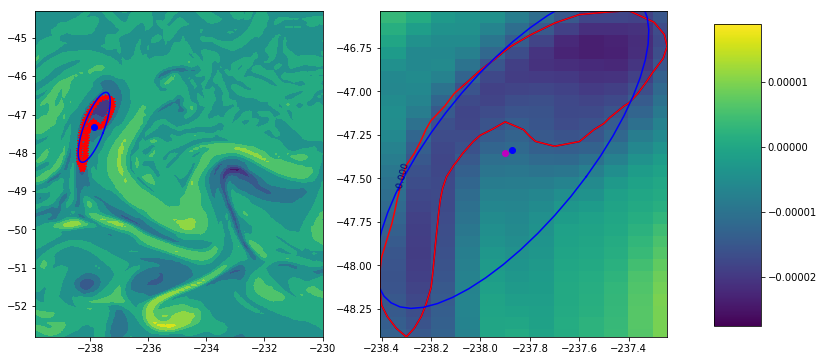

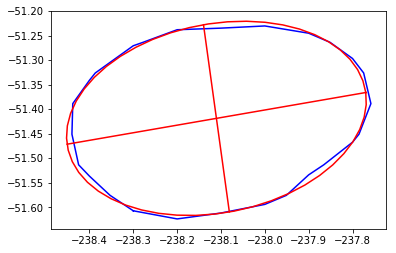

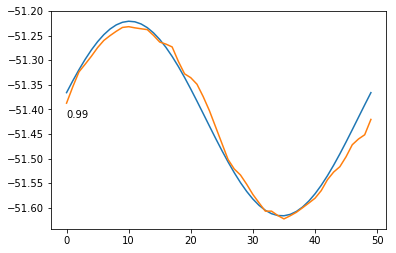

std   vs fit 0.994236667998


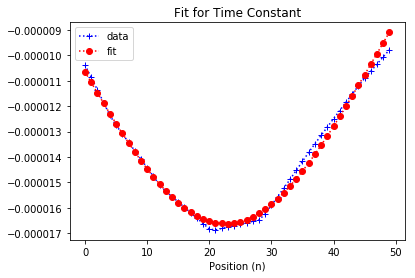

std   vs fit 0.995149940026


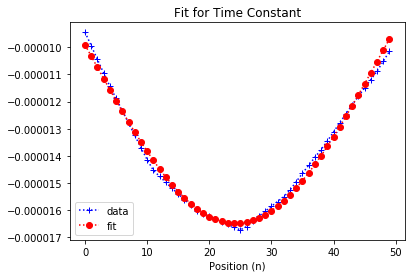

Ellipse parameters
Ellipse center =  [-238.11035792547992, -51.418495908954029]
angle of rotation =  -0.153362271932
axes (a,b) =  [0.34466561564278347, 0.19301199176707481]
Eccentricity =  0.828494083784
Area (cont,ellips) =  0.204859761841 0.208420927753
Ellipse adjust =  0.990215064978
Mayor Gauss fit =  True
Minor Gauss fit =  True


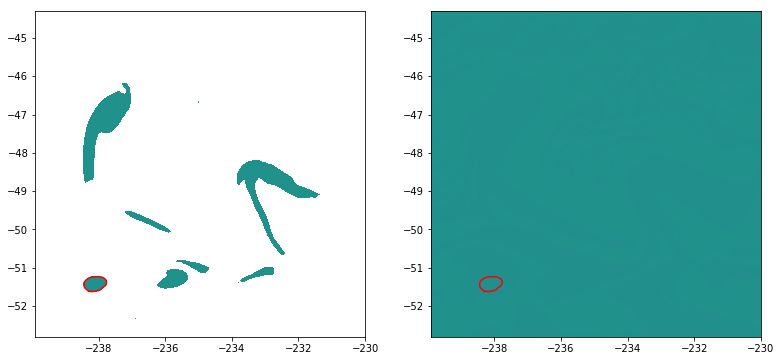

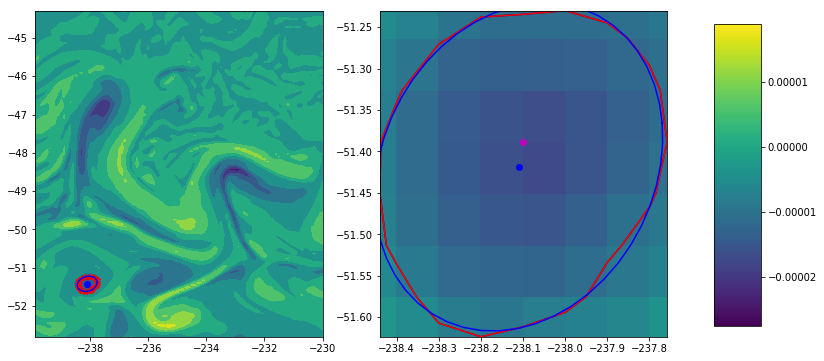

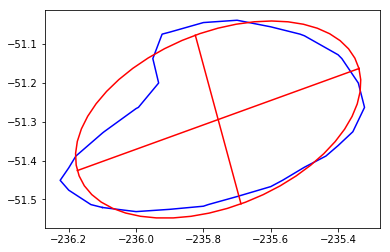

Ellipse parameters
Ellipse center =  [-235.75624669581879, -51.294742104658646]
angle of rotation =  -0.303541032914
axes (a,b) =  [0.43824770147169295, 0.22696455525207909]
Eccentricity =  0.855446595019
Area (cont,ellips) =  0.285580065334 0.311628205585
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


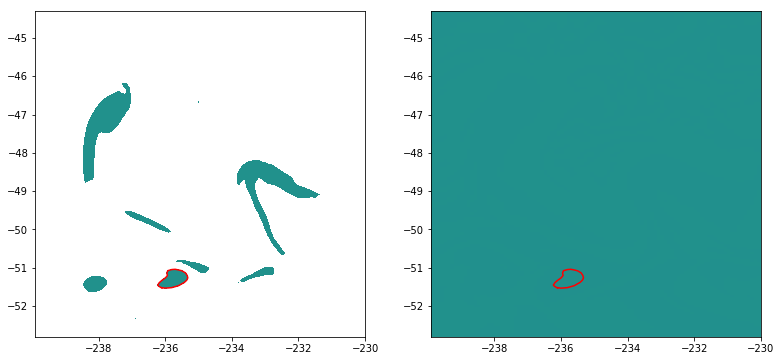

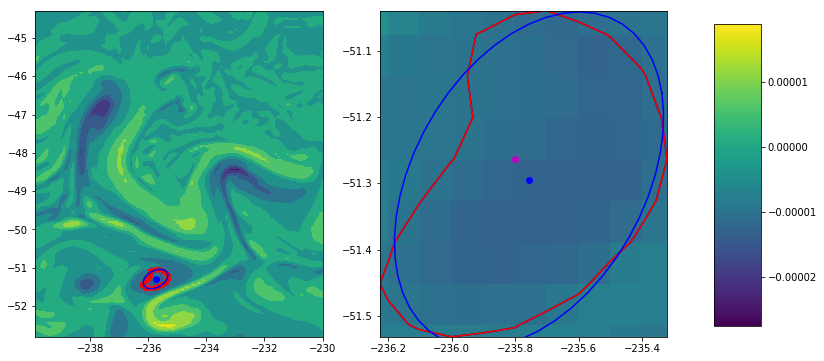

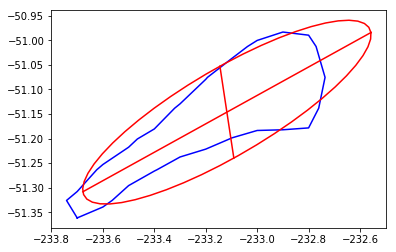

Ellipse parameters
Ellipse center =  [-233.11783858279117, -51.146248810699056]
angle of rotation =  -0.281702236506
axes (a,b) =  [0.58312226128550737, 0.097383792048554074]
Eccentricity =  0.985956205909
Area (cont,ellips) =  0.125677162607 0.177912054874
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


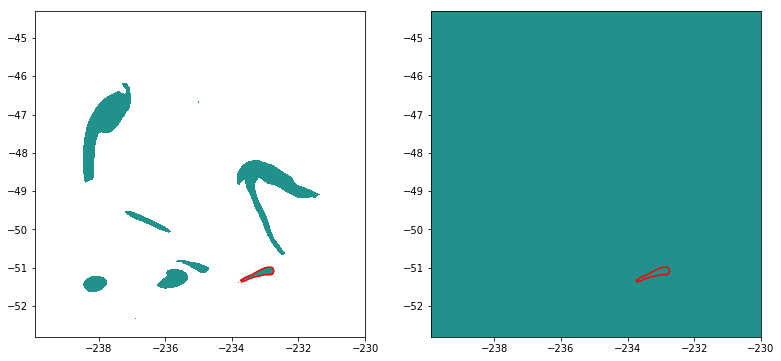

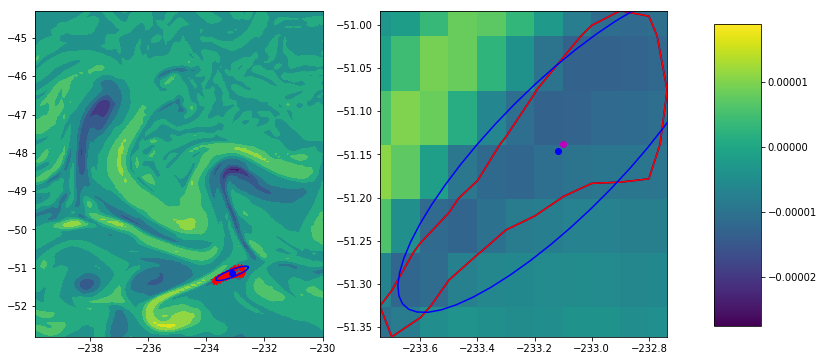

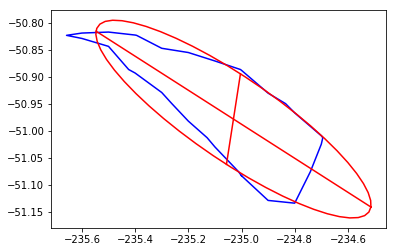

Ellipse parameters
Ellipse center =  [-235.03025917571904, -50.97814363317098]
angle of rotation =  0.30455811536
axes (a,b) =  [0.54174648217069965, 0.087690399504170069]
Eccentricity =  0.986812728001
Area (cont,ellips) =  0.104655513947 0.14883573656
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


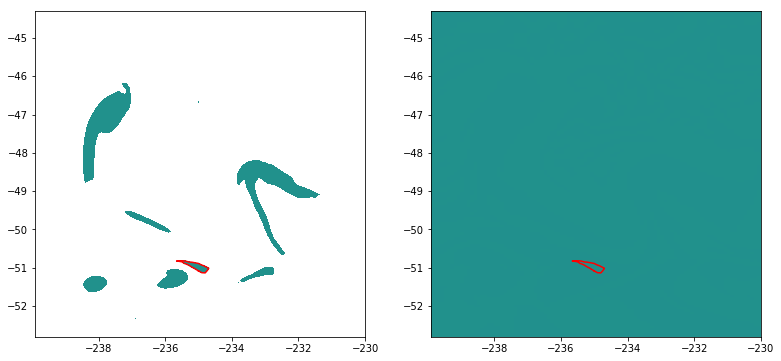

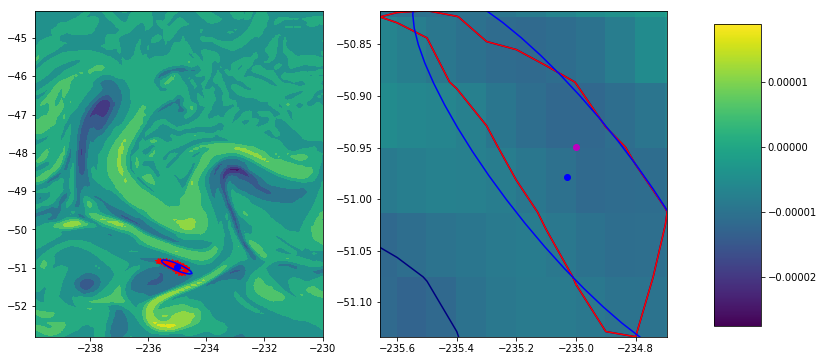

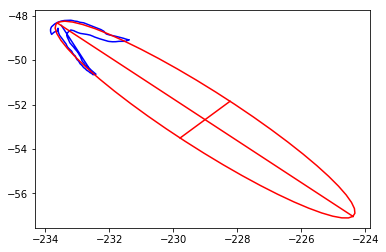

Ellipse parameters
Ellipse center =  [-229.00622463600078, -52.680317749893433]
angle of rotation =  0.756153177033
axes (a,b) =  [6.3499171189441332, 1.1375643800138806]
Eccentricity =  0.983822438564
Area (cont,ellips) =  1.22378075006 22.6309671468
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


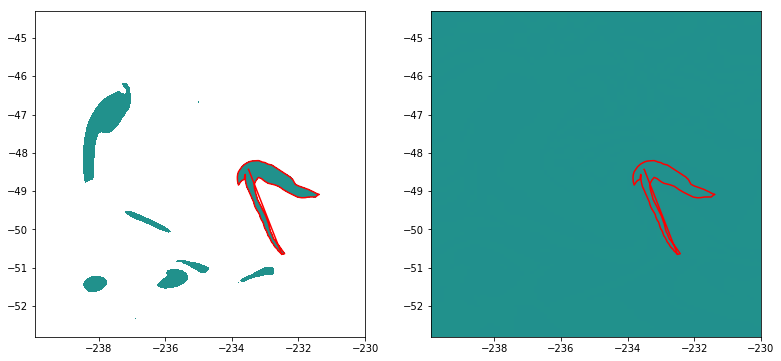

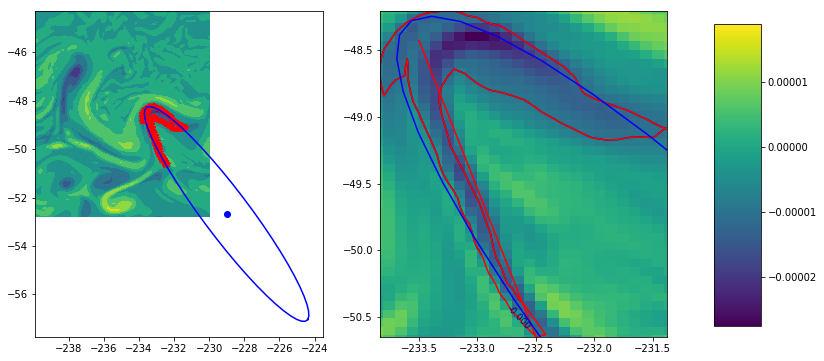

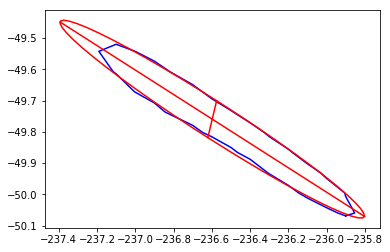

Ellipse parameters
Ellipse center =  [-236.59767698285404, -49.759542318081301]
angle of rotation =  0.372015677077
axes (a,b) =  [0.85399581416114634, 0.063245311553642145]
Eccentricity =  0.997253928097
Area (cont,ellips) =  0.14747511124 0.169216672482
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


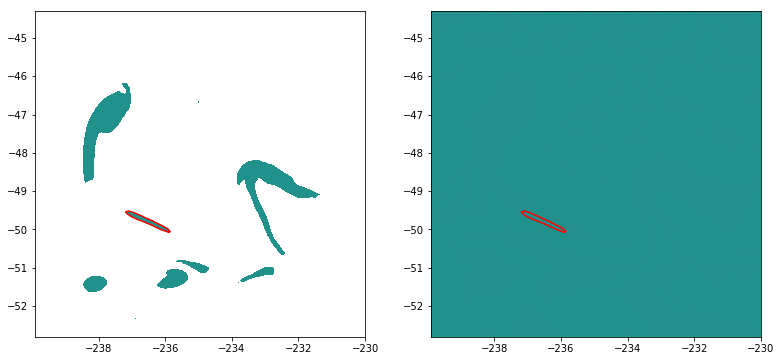

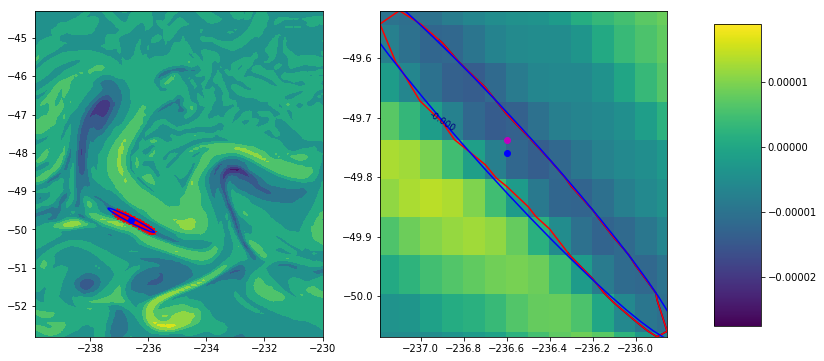

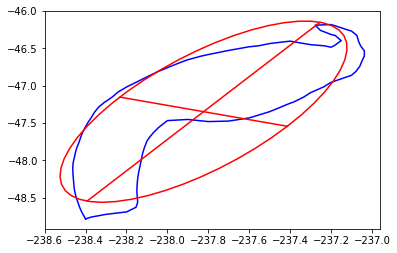

Ellipse parameters
Ellipse center =  [-237.8230579253256, -47.347167501954402]
angle of rotation =  0.444703889639
axes (a,b) =  [0.45375128798436382, 1.325096513258486]
Eccentricity =  0.939543759527
Area (cont,ellips) =  1.31599905482 1.88375515869
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


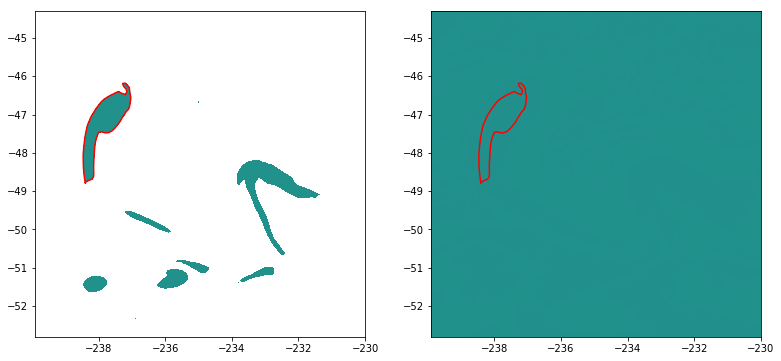

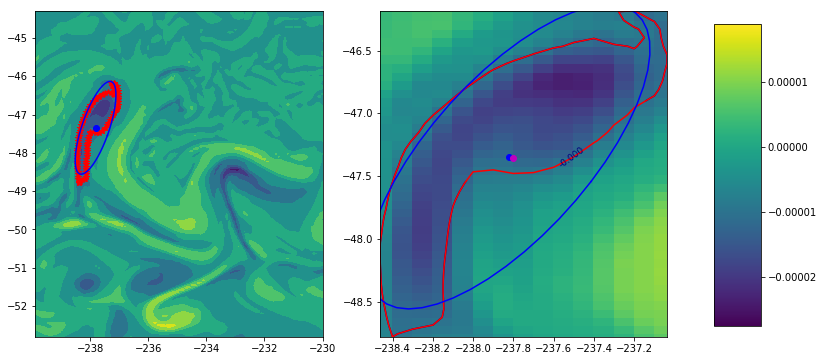

 0% [=>]100% Time Elapsed: 85 s  

In [20]:
eddytd=analyseddyzt(vorticity,lon,lat,0,2,1,-0.00002,-0.00001,-0.000005,data_meant='',areamap=areamap,mask=''\
                    ,destdir='',physics='',eccenfit=0.85,ellipsrsquarefit=0.90,gaussrsquarefit=0.90,\
                    diagnostics=True,pprint=False)

* ## Okubo-Weiss Parameter

### $W = s_n^2+s_s^2-\zeta_r^2$
#### $s_n=\frac{\partial u}{\partial x}-\frac{\partial u}{\partial x}$

#### $s_s=\frac{\partial v}{\partial x}+\frac{\partial u}{\partial y}$

In [11]:
okuboweiss=zeros(shape(u))
for ii in range(shape(u)[0]):
    okuboweiss[ii,:,:]=okuboweissparm(u[ii,:,:],v[ii,:,:],lat,lon,0) 

In [12]:
okuboweiss=okuboweiss[:,620:750,400:500]
lon=lon[400:500]
lat=lat[620:750]
areamap=array([[0,len(lon)],[0,len(lat)]])

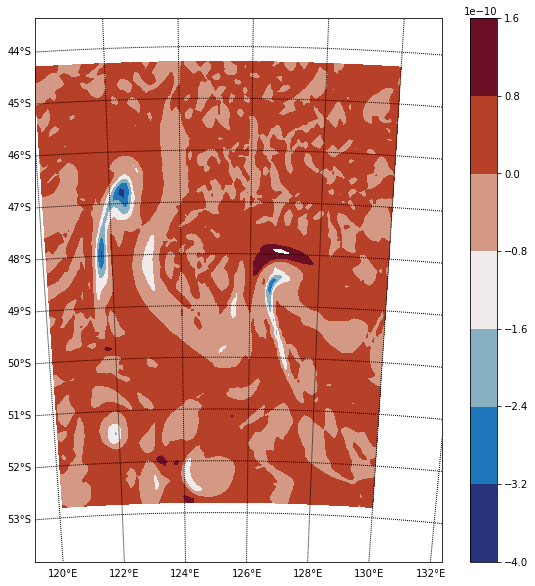

In [13]:
fig = plt.figure(figsize=(10, 10),facecolor='white')
gs = gridspec.GridSpec(1, 1)
ax1 = plt.subplot(gs[0,0])
lonmm,latmm=np.meshgrid(lon,lat)
map = Basemap(projection='stere',lat_0=mean(lat),lon_0=mean(lon),llcrnrlat=latmm.min()-1,urcrnrlat=latmm.max()+1,\
            llcrnrlon=lonmm.min()-1,urcrnrlon=lonmm.max()+1,rsphere=6371200.0,resolution='c',ax=ax1)
lonm,latm=map(lonmm,latmm)
map.drawmeridians(np.arange(0,360,2),labels=[0,0,0,1],fontsize=10)
map.drawparallels(np.arange(0,-360,-1),labels=[1,0,0,0],fontsize=10)
map.fillcontinents(color='black',lake_color='black')
map.drawcoastlines()
map.drawcoastlines()
im=ax1.contourf(lonm,latm,okuboweiss[0,:,:],shading='gouraud',cmap=cm.cm.balance,alpha=1)
fig.colorbar(im, orientation='vertical')

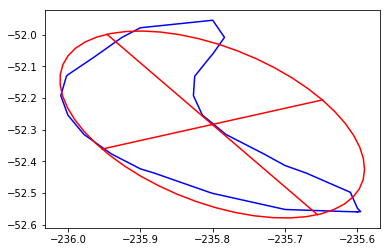

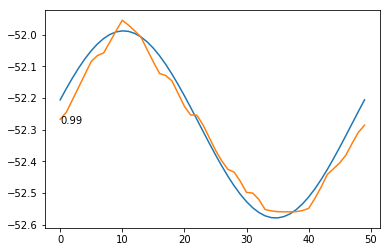

std   vs fit 0.917149658449


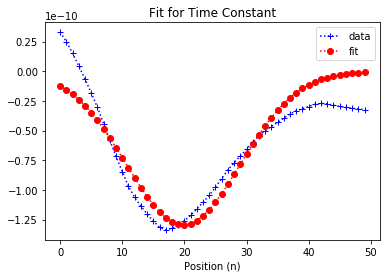

std   vs fit 0.997143355611


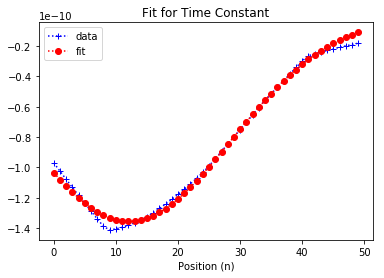

Ellipse parameters
Ellipse center =  [-235.80069502898255, -52.283622032470348]
angle of rotation =  -0.471698917578
axes (a,b) =  [0.17081943380013417, 0.32010737572340803]
Eccentricity =  0.845716997422
Area (cont,ellips) =  0.104870080482 0.171313675004
Ellipse adjust =  0.986587316083
Mayor Gauss fit =  True
Minor Gauss fit =  True


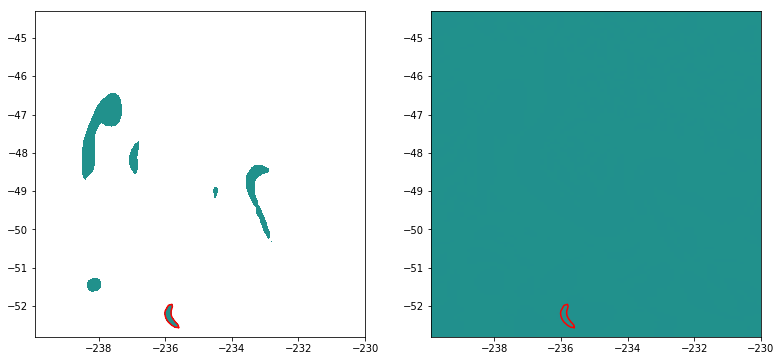

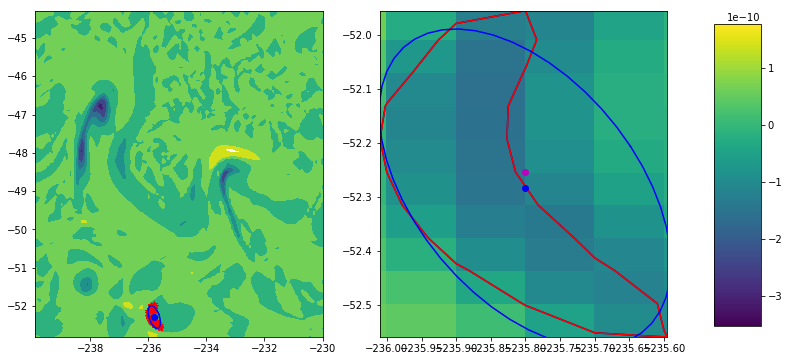

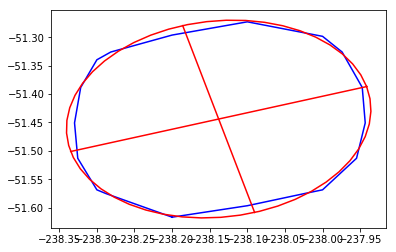

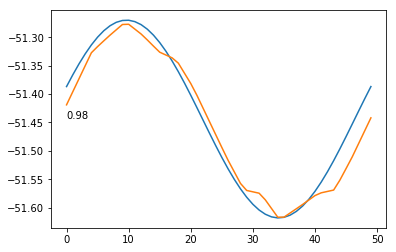

std   vs fit 0.981213940007


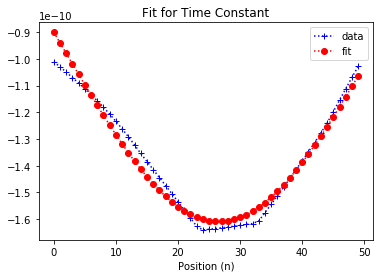

std   vs fit 0.963939817433


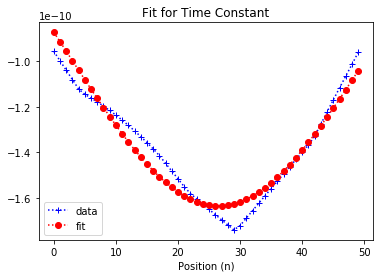

Ellipse parameters
Ellipse center =  [-238.13812215566355, -51.444033131143499]
angle of rotation =  -0.282830362852
axes (a,b) =  [0.20483482503500516, 0.17130990265769427]
Eccentricity =  0.548223420092
Area (cont,ellips) =  0.104934724281 0.10993736831
Ellipse adjust =  0.979045984891
Mayor Gauss fit =  True
Minor Gauss fit =  True


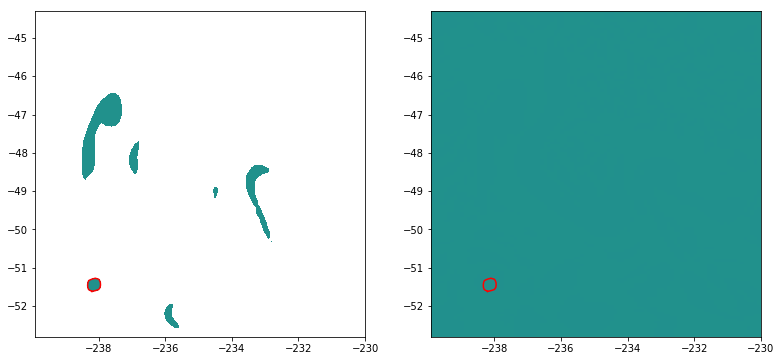

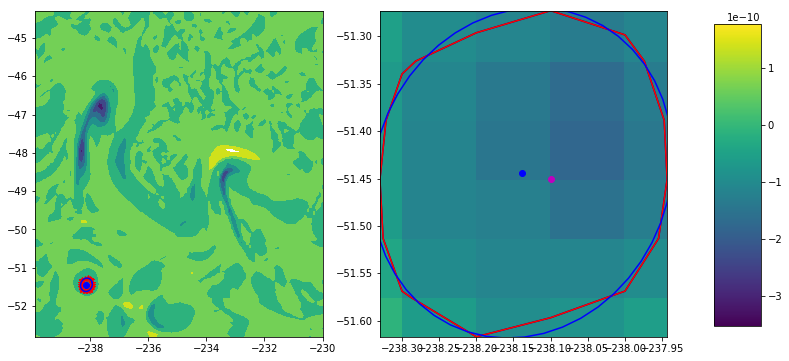

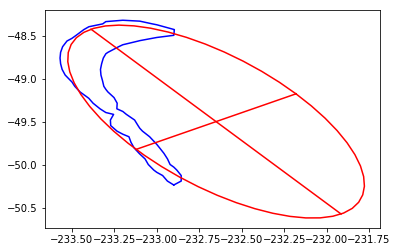

Ellipse parameters
Ellipse center =  [-232.65077201313676, -49.496571700001354]
angle of rotation =  -0.601043196478
axes (a,b) =  [0.5707695958176815, 1.3020909918136108]
Eccentricity =  0.898805105497
Area (cont,ellips) =  0.389140672109 2.32841955347
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


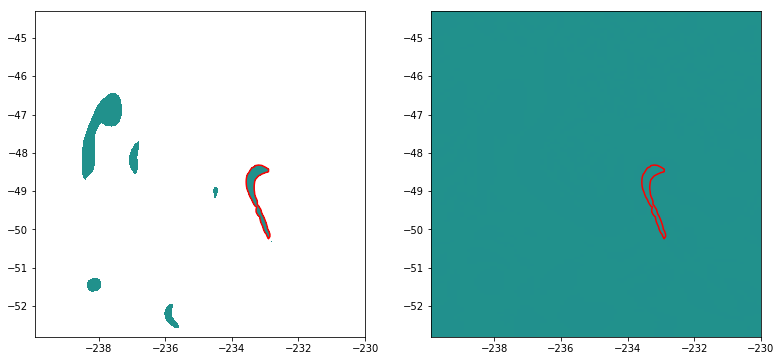

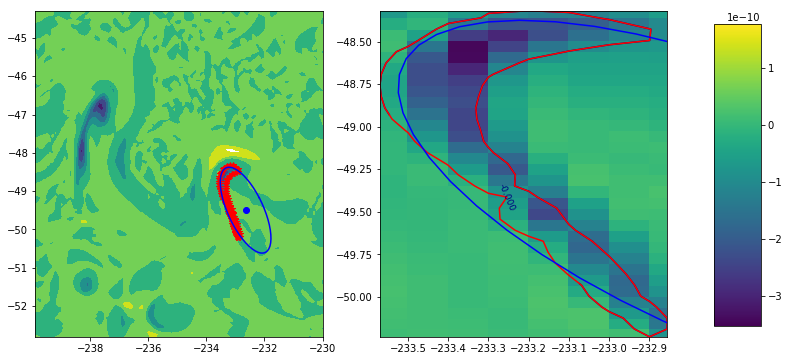

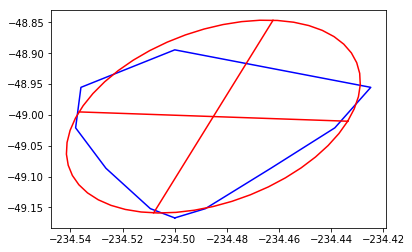

Ellipse parameters
Ellipse center =  [-234.48520380938695, -49.002687275595989]
angle of rotation =  0.145537109944
axes (a,b) =  [0.052051476210256215, 0.15779677054887778]
Eccentricity =  0.94402845928
Area (cont,ellips) =  0.0185309848821 0.0257329888991
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


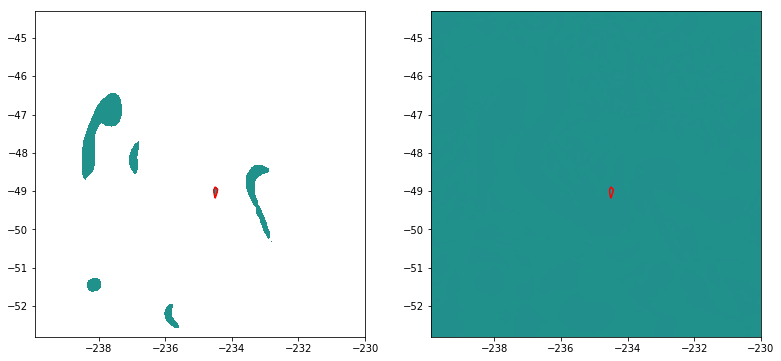

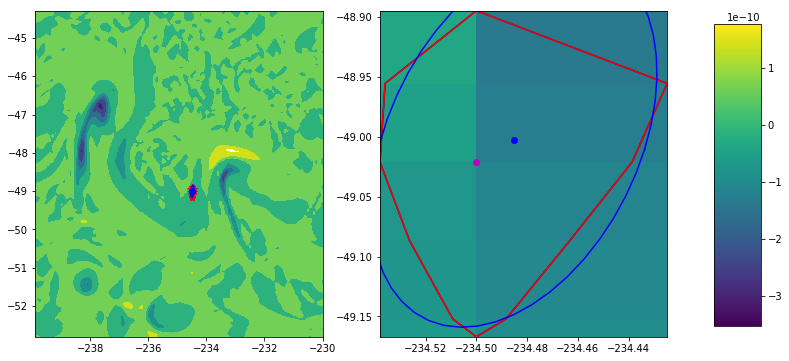

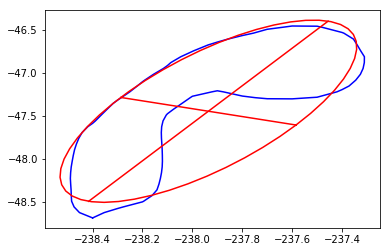

Ellipse parameters
Ellipse center =  [-237.93582192070232, -47.444775559566963]
angle of rotation =  0.428990588213
axes (a,b) =  [0.3862899351527887, 1.1542682026937872]
Eccentricity =  0.942338162467
Area (cont,ellips) =  0.978524178965 1.39694464556
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


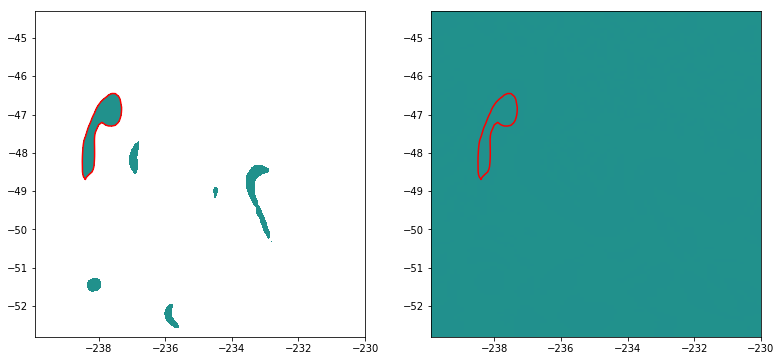

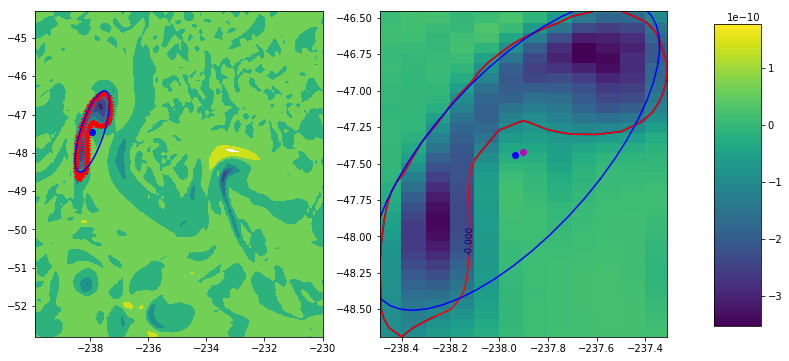

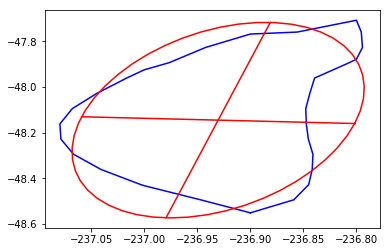

Ellipse parameters
Ellipse center =  [-236.93040765044631, -48.144836147200806]
angle of rotation =  0.114402242098
axes (a,b) =  [0.12961681513382847, 0.43056490035804273]
Eccentricity =  0.953611837765
Area (cont,ellips) =  0.141544011451 0.174847344926
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


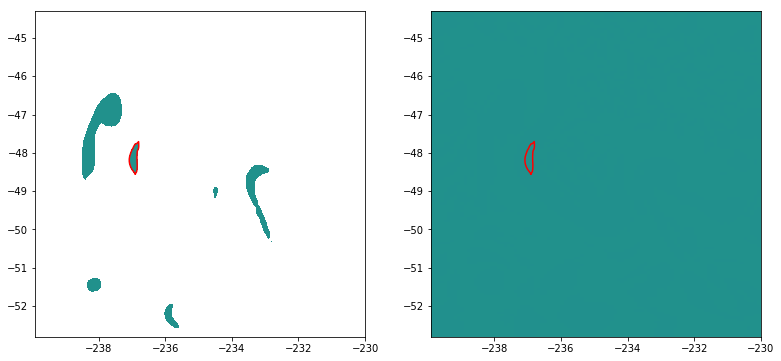

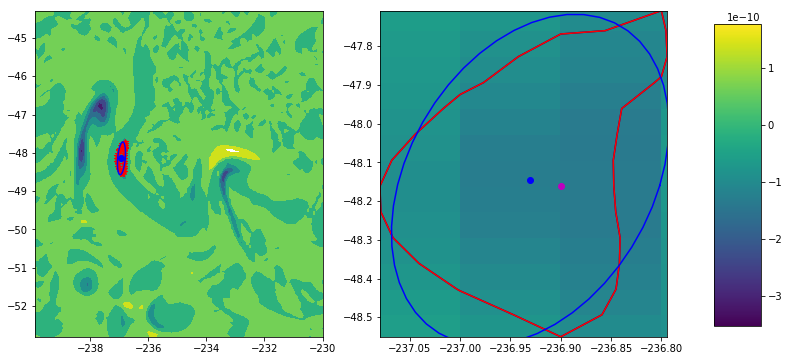

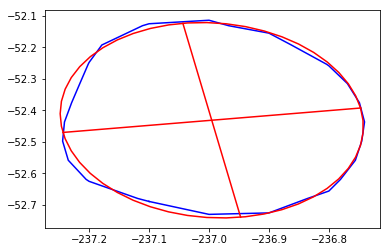

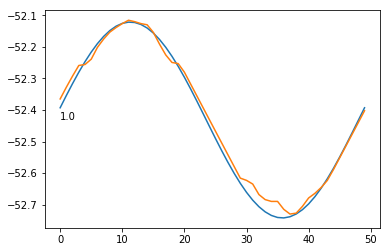

std   vs fit 0.909963947569


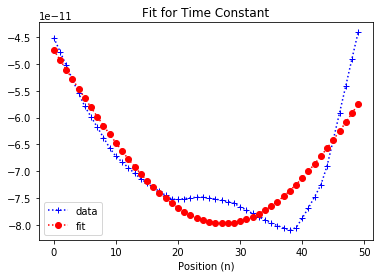

std   vs fit 0.869615043071


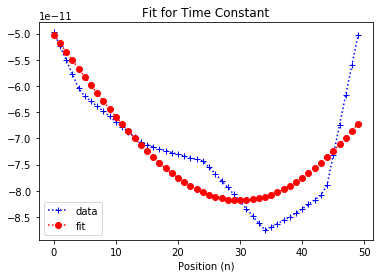

Ellipse parameters
Ellipse center =  [-236.99539688504413, -52.431625926947063]
angle of rotation =  -0.155086309148
axes (a,b) =  [0.25123139124923355, 0.31183210975521369]
Eccentricity =  0.592375027453
Area (cont,ellips) =  0.241364182613 0.245444784989
Ellipse adjust =  0.997392392307
Mayor Gauss fit =  True
Minor Gauss fit =  False


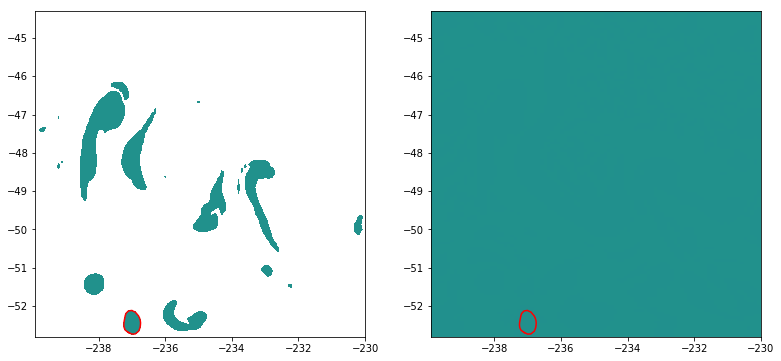

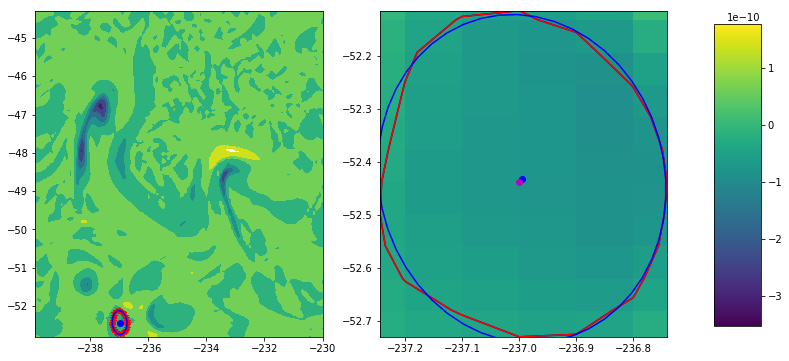

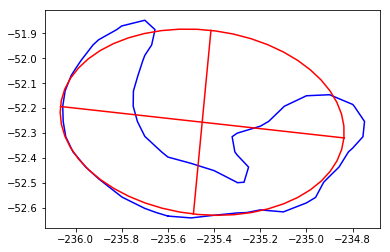

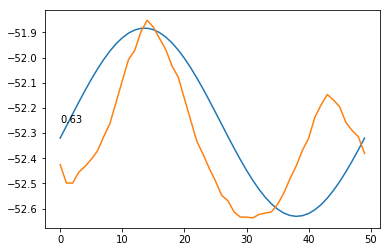

Ellipse parameters
Ellipse center =  [-235.45157664889533, -52.25676715458296]
angle of rotation =  0.102533045163
axes (a,b) =  [0.61700325425567681, 0.37072663388296367]
Eccentricity =  0.799361515424
Area (cont,ellips) =  0.451488672988 0.716638795566
Ellipse adjust =  0.626594742894
Mayor Gauss fit =  False
Minor Gauss fit =  False


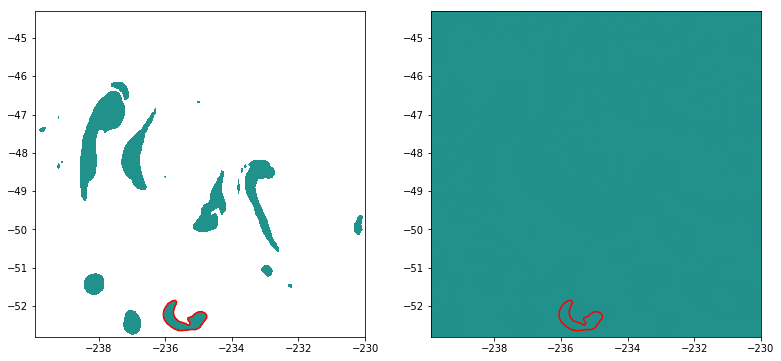

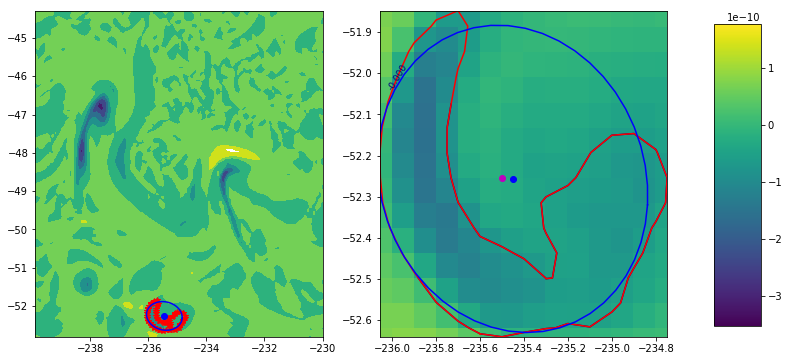

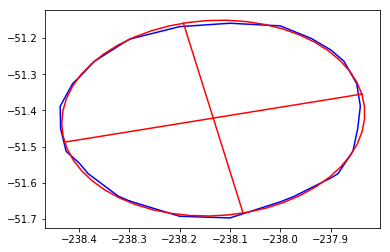

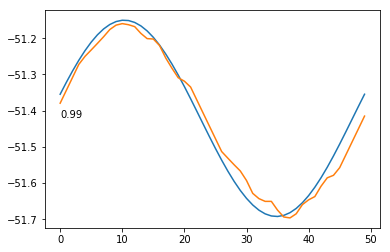

std   vs fit 0.992116472243


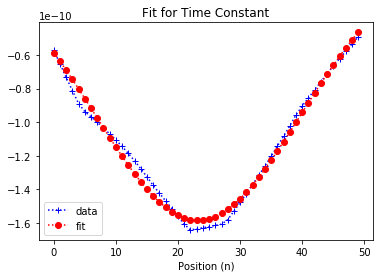

std   vs fit 0.990009384788


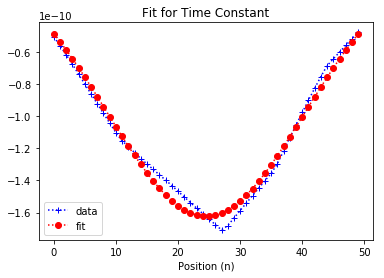

Ellipse parameters
Ellipse center =  [-238.1332332336022, -51.421353095081628]
angle of rotation =  -0.221673045745
axes (a,b) =  [0.30255105423027451, 0.26941166915801545]
Eccentricity =  0.455048214741
Area (cont,ellips) =  0.252387795917 0.255372510408
Ellipse adjust =  0.987091351843
Mayor Gauss fit =  True
Minor Gauss fit =  True


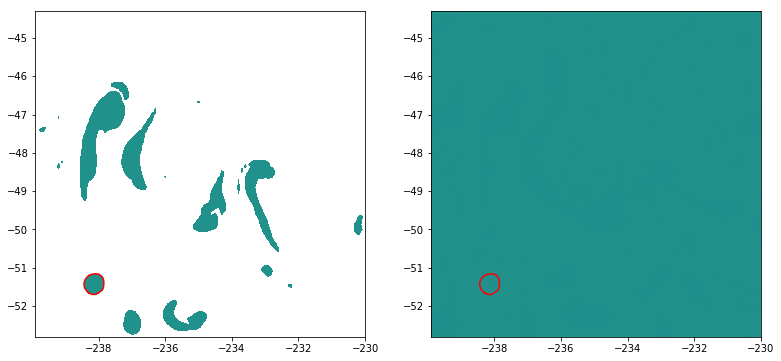

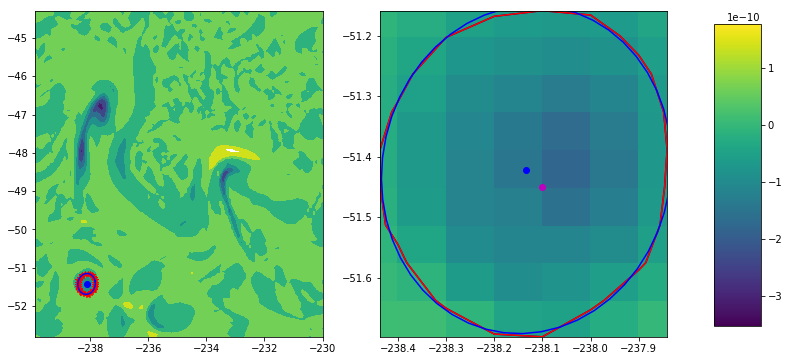

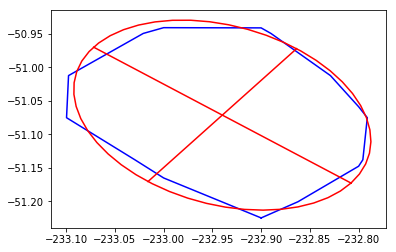

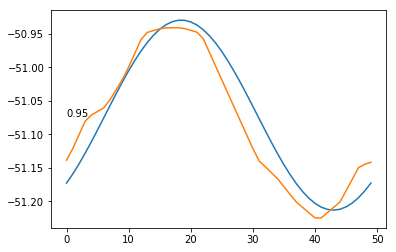

std   vs fit 0.953796607281


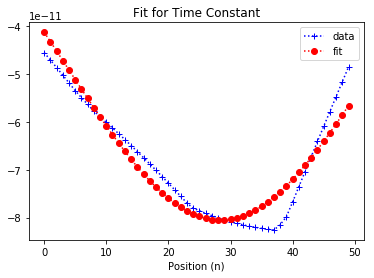

std   vs fit 0.961472365613


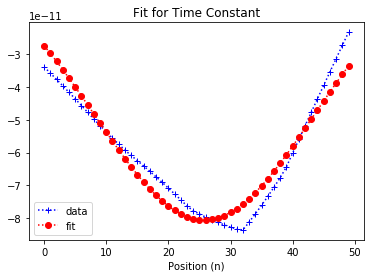

Ellipse parameters
Ellipse center =  [-232.93983245645506, -51.071513177544617]
angle of rotation =  0.655192180369
axes (a,b) =  [0.16651464892707776, 0.12508014933682624]
Eccentricity =  0.660113309403
Area (cont,ellips) =  0.0599574656953 0.0652529140352
Ellipse adjust =  0.949238428285
Mayor Gauss fit =  True
Minor Gauss fit =  True


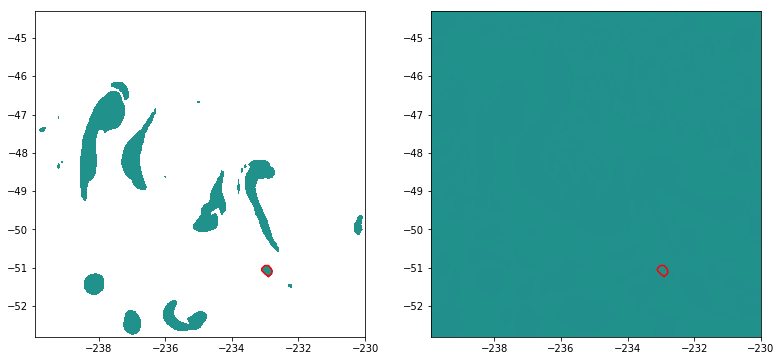

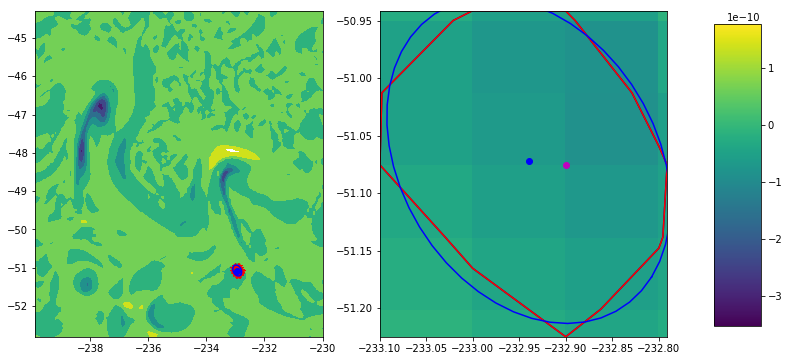

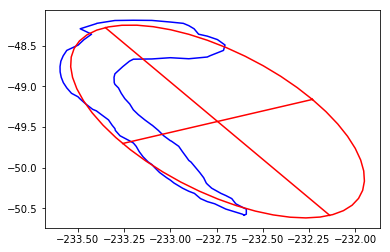

Ellipse parameters
Ellipse center =  [-232.74461377416091, -49.432288194598804]
angle of rotation =  -0.484940264211
axes (a,b) =  [0.58007841430538587, 1.3028019884153752]
Eccentricity =  0.895404072599
Area (cont,ellips) =  0.743203992839 2.36768645851
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


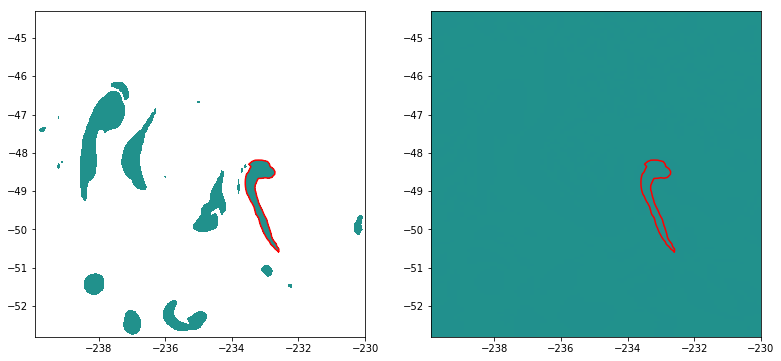

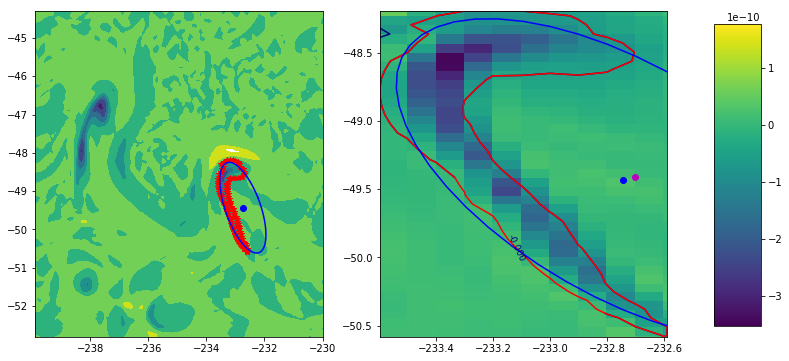

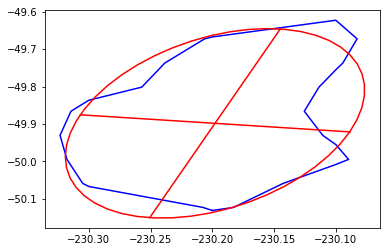

Ellipse parameters
Ellipse center =  [-230.19782626919704, -49.898509726108784]
angle of rotation =  0.206491261358
axes (a,b) =  [0.11143920075796016, 0.25779481484512368]
Eccentricity =  0.901740066702
Area (cont,ellips) =  0.0783051926992 0.0900059539708
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


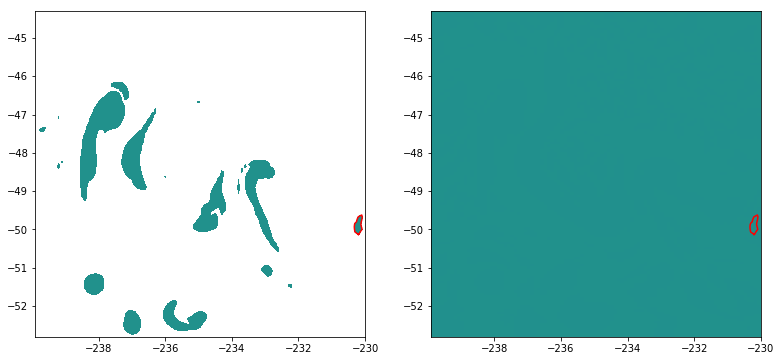

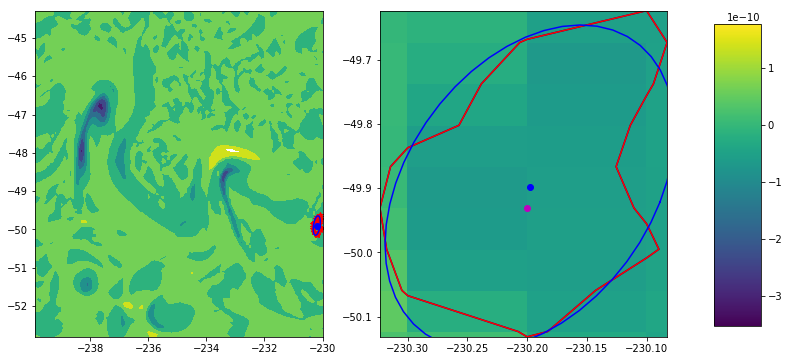

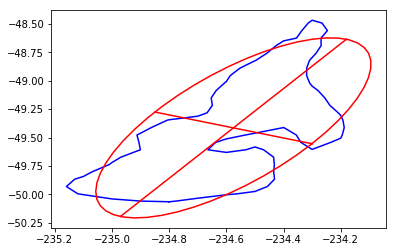

Ellipse parameters
Ellipse center =  [-234.57539839250117, -49.415178481241185]
angle of rotation =  0.469441713562
axes (a,b) =  [0.308029640869528, 0.87382286477414628]
Eccentricity =  0.935808760889
Area (cont,ellips) =  0.614289331599 0.843286186806
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


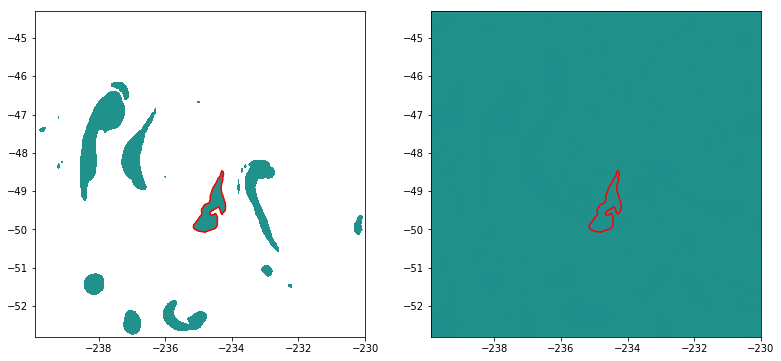

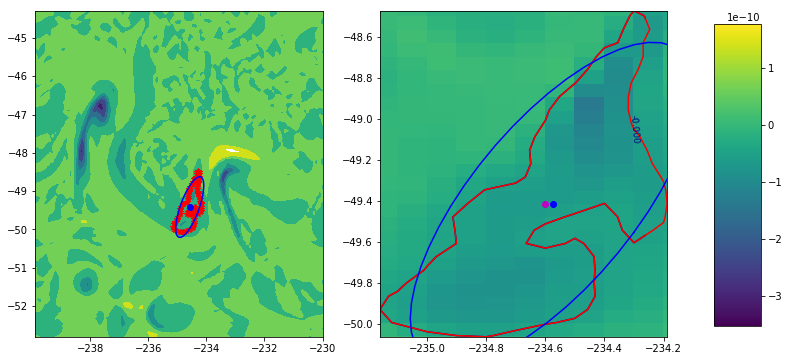

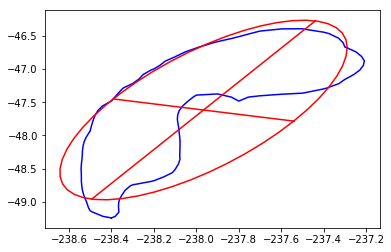

Ellipse parameters
Ellipse center =  [-237.96625979924329, -47.616488281569815]
angle of rotation =  0.374153923588
axes (a,b) =  [0.45657691404288941, 1.4412782220706712]
Eccentricity =  0.948497002496
Area (cont,ellips) =  1.43081182591 2.06167804194
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


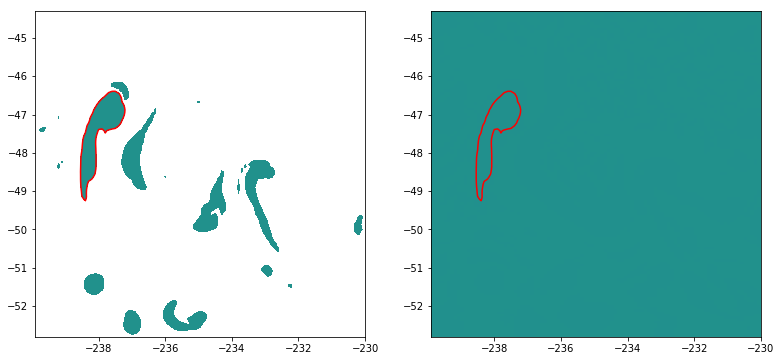

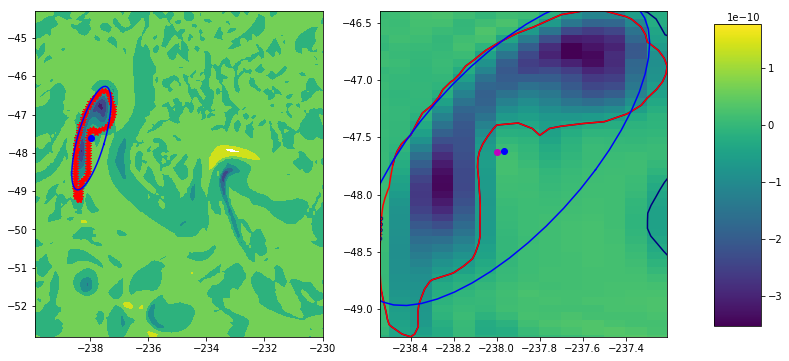

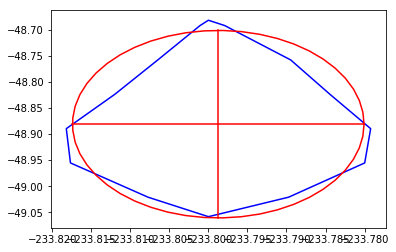

Ellipse parameters
Ellipse center =  [-233.79873761172925, -48.881048698517539]
angle of rotation =  0
axes (a,b) =  [0.018673944000085957, 0.17968587428486332]
Eccentricity =  0.994585084761
Area (cont,ellips) =  0.00902289089572 0.0105125738773
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


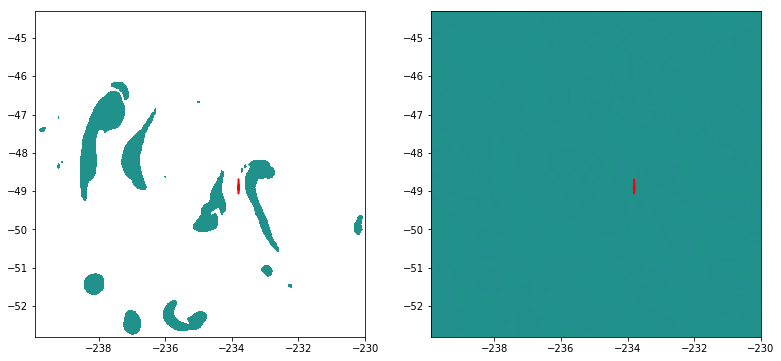

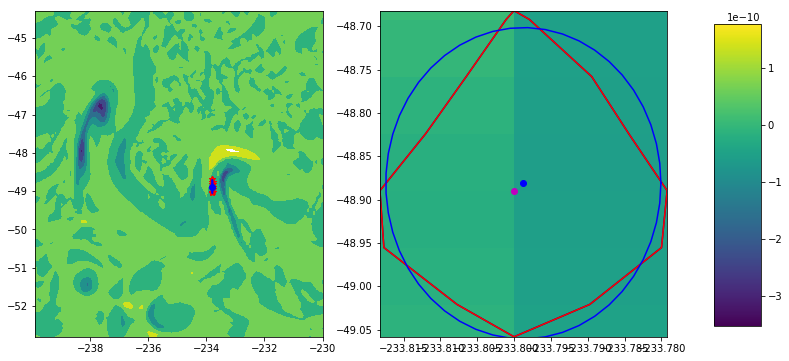

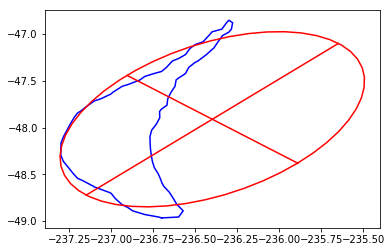

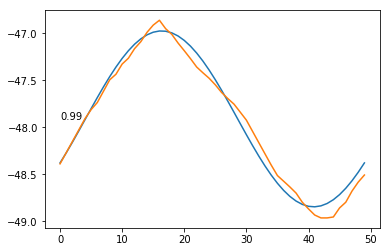

std   vs fit 0.987940990192


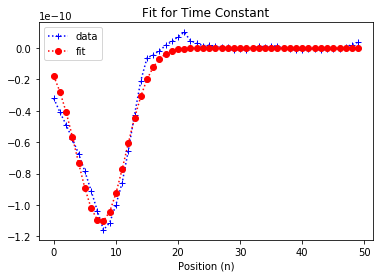

std   vs fit 0.997446678599


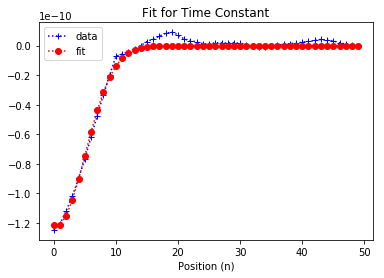

Ellipse parameters
Ellipse center =  [-236.39870695543141, -47.910240780476286]
angle of rotation =  0.74640148267
axes (a,b) =  [0.69112252475231339, 1.1047605544668802]
Eccentricity =  0.780155366645
Area (cont,ellips) =  0.714948590437 2.39211624011
Ellipse adjust =  0.990062218117
Mayor Gauss fit =  True
Minor Gauss fit =  True


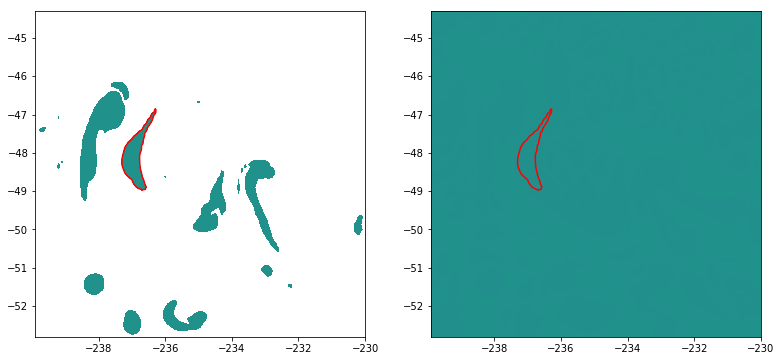

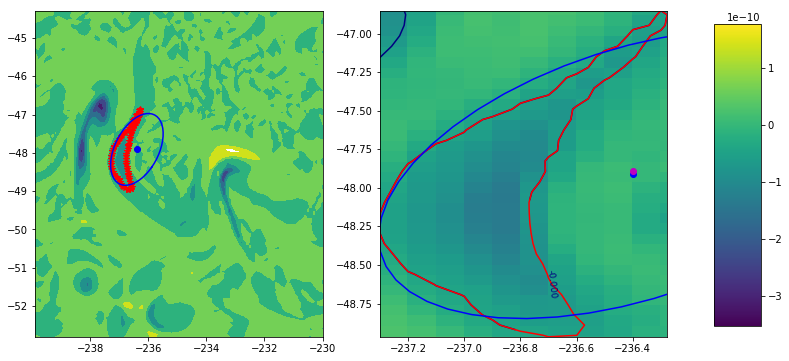

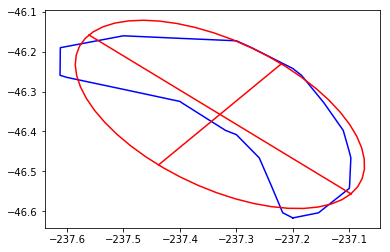

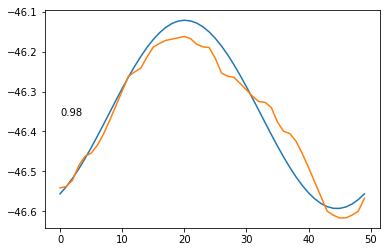

std   vs fit 0.315158363908


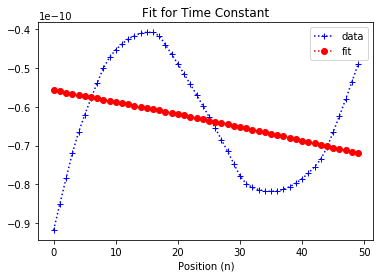

Ellipse parameters
Ellipse center =  [-237.32913070977423, -46.357350119251237]
angle of rotation =  0.709287755998
axes (a,b) =  [0.30566918344275112, 0.1669518868249327]
Eccentricity =  0.8376646554
Area (cont,ellips) =  0.102848776791 0.159882916196
Ellipse adjust =  0.97599584013
Mayor Gauss fit =  False
Minor Gauss fit =  False


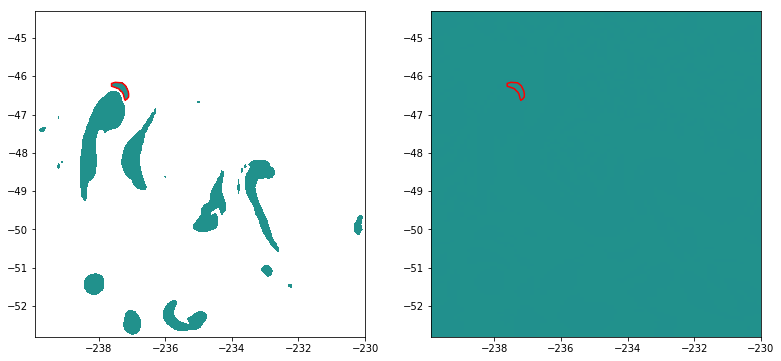

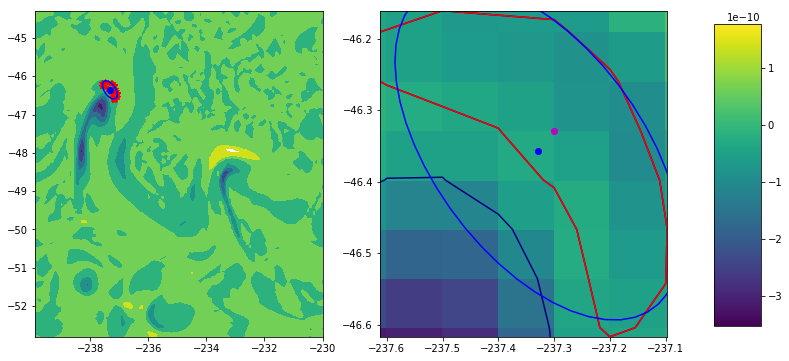

Contour is growing
eddyN 0 1
eddyt1pos -238.124410348 -51.4183573094
eddyt0pos -238.116005054 -51.4444373891
area [ 0.2523878] [ 0.2523878]
 0% [>]50% Time Elapsed: 60 s  

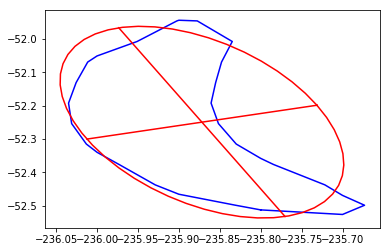

Ellipse parameters
Ellipse center =  [-235.87183535814776, -52.249505446725436]
angle of rotation =  -0.345610985597
axes (a,b) =  [0.14937707557020125, 0.29993595965693554]
Eccentricity =  0.867159858454
Area (cont,ellips) =  0.0935646075523 0.140369115165
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


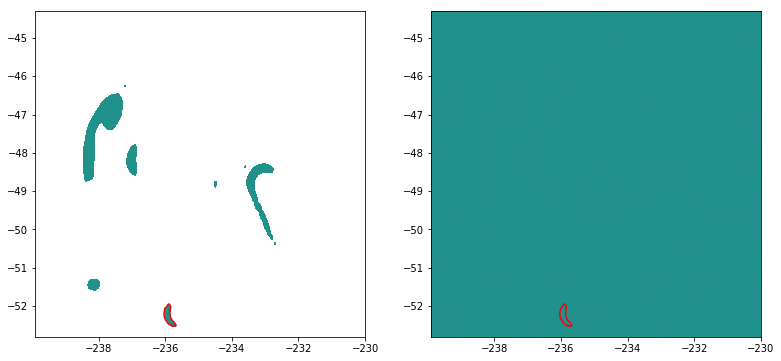

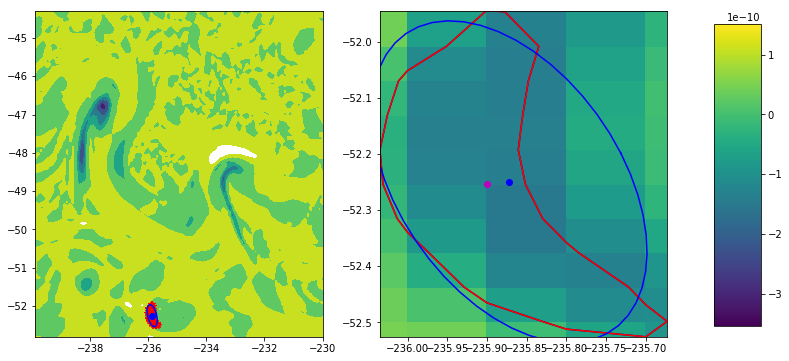

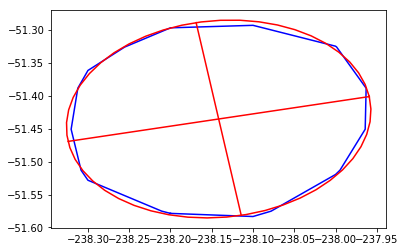

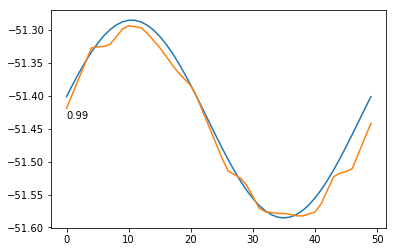

std   vs fit 0.997727354476


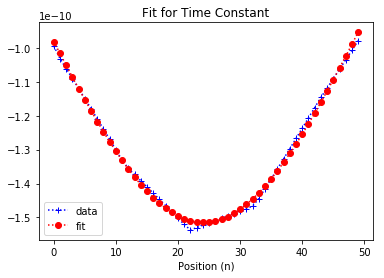

std   vs fit 0.992875962867


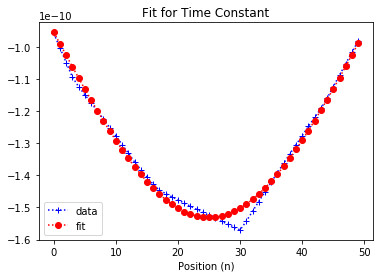

Ellipse parameters
Ellipse center =  [-238.14161964884309, -51.435262061565602]
angle of rotation =  -0.184539274519
axes (a,b) =  [0.1856164247493691, 0.1489228633941572]
Eccentricity =  0.596900707231
Area (cont,ellips) =  0.0829761596397 0.0866037811502
Ellipse adjust =  0.991559501336
Mayor Gauss fit =  True
Minor Gauss fit =  True


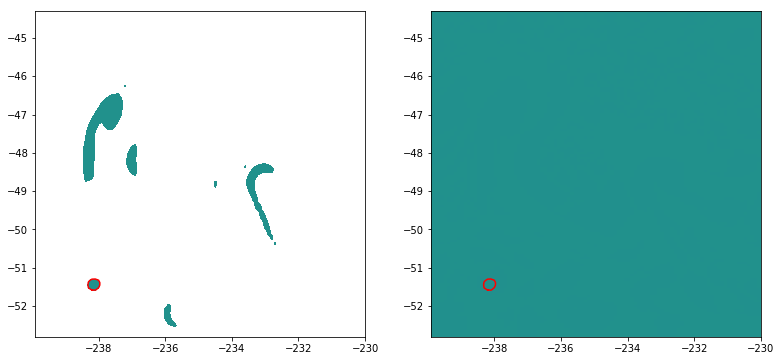

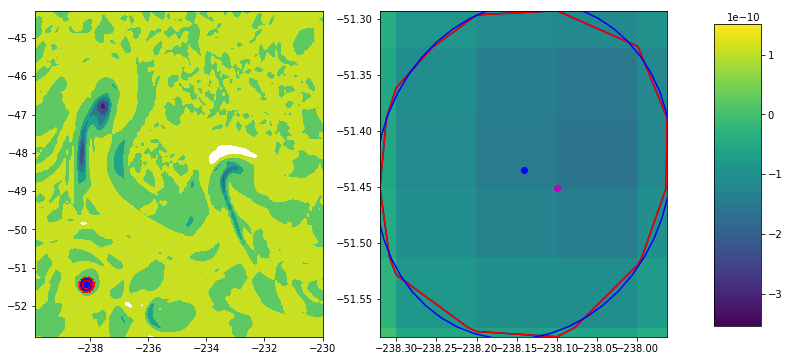

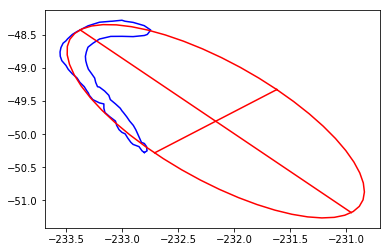

Ellipse parameters
Ellipse center =  [-232.16342630463683, -49.804015758241491]
angle of rotation =  -0.719802247241
axes (a,b) =  [0.72492707325683658, 1.8346917364121462]
Eccentricity =  0.918628653467
Area (cont,ellips) =  0.40975457849 4.16693280125
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


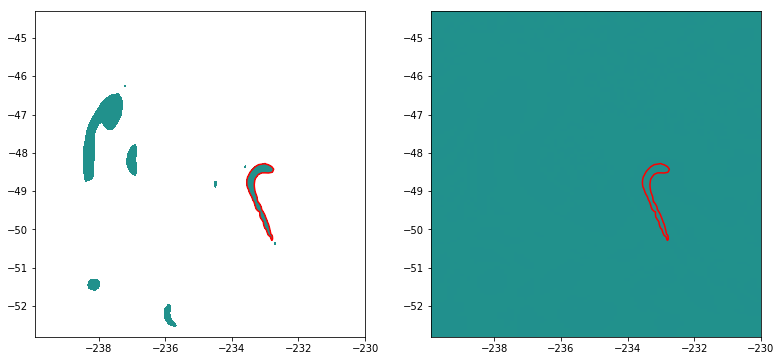

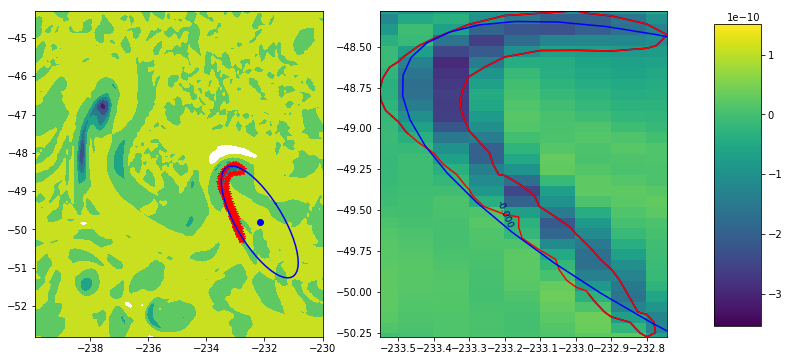

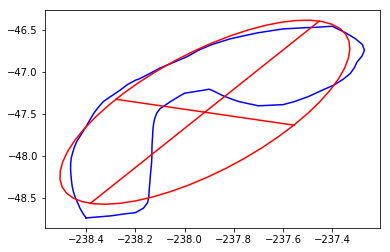

Ellipse parameters
Ellipse center =  [-237.91750130663996, -47.480100429858936]
angle of rotation =  0.404032419674
axes (a,b) =  [0.39324694562244605, 1.1836513873584233]
Eccentricity =  0.94319767517
Area (cont,ellips) =  0.994076467701 1.45830458833
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


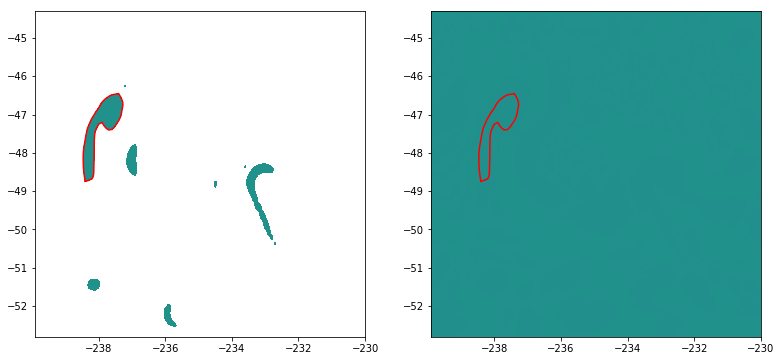

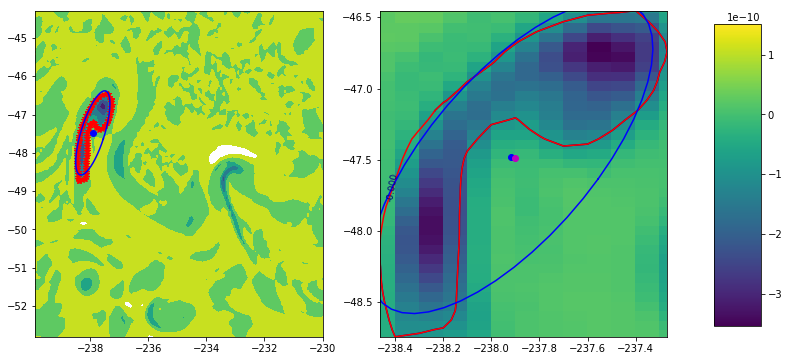

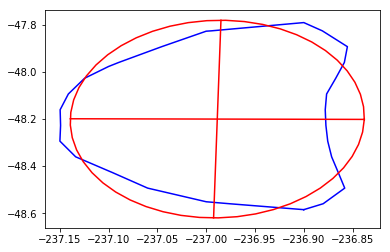

Ellipse parameters
Ellipse center =  [-236.98864499062884, -48.200770463591724]
angle of rotation =  0.00900608315225
axes (a,b) =  [0.15064536647791335, 0.41922110673788177]
Eccentricity =  0.933204456402
Area (cont,ellips) =  0.174615270458 0.197859993728
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


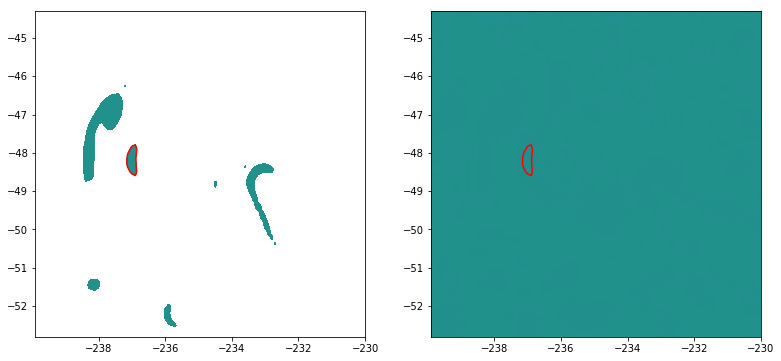

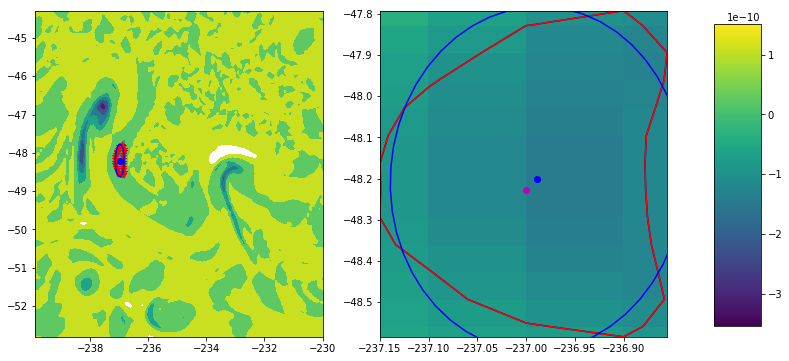

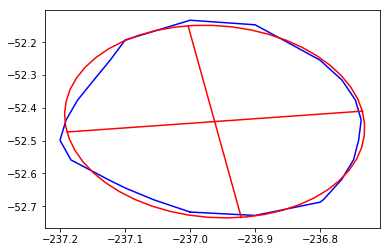

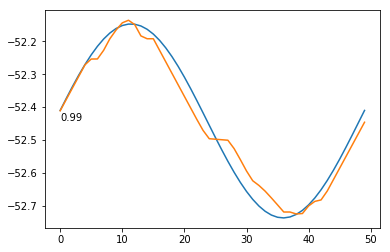

std   vs fit 0.915763559791


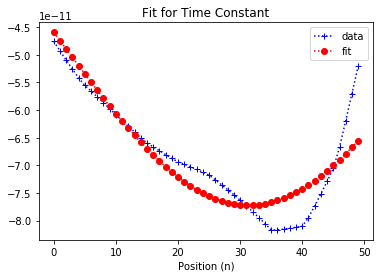

std   vs fit 0.803692451718


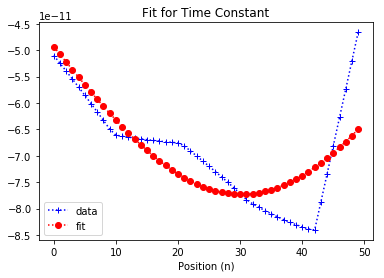

Ellipse parameters
Ellipse center =  [-236.96222047146497, -52.441792030257844]
angle of rotation =  -0.139075645826
axes (a,b) =  [0.22977470886992035, 0.29523051986954246]
Eccentricity =  0.627906049394
Area (cont,ellips) =  0.20619774732 0.212531128607
Ellipse adjust =  0.985875361709
Mayor Gauss fit =  True
Minor Gauss fit =  False


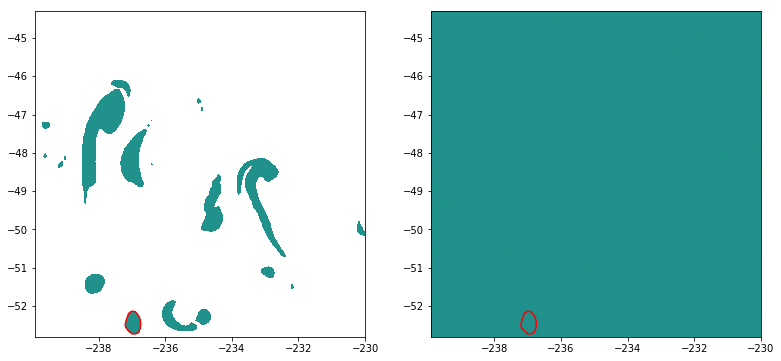

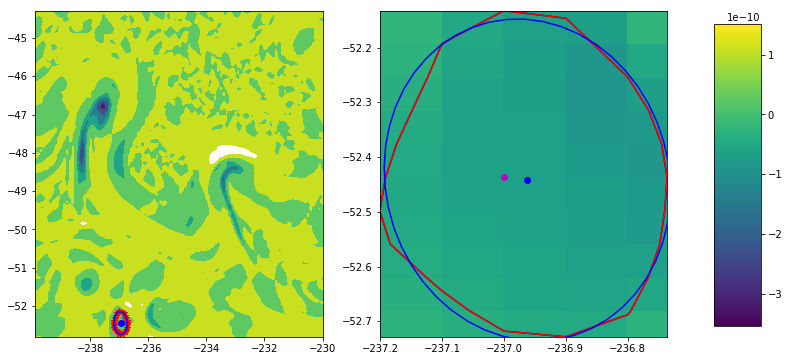

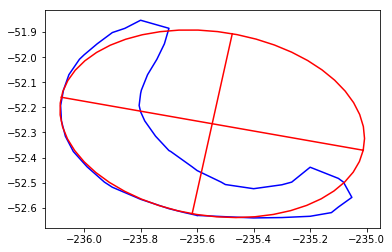

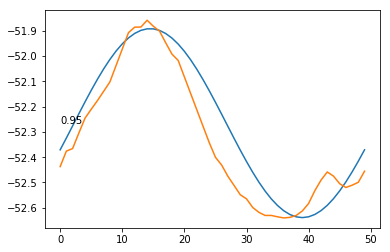

std   vs fit 0.926513567382


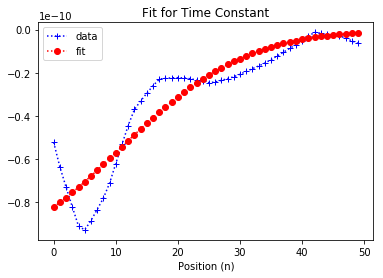

std   vs fit 0.956260060529


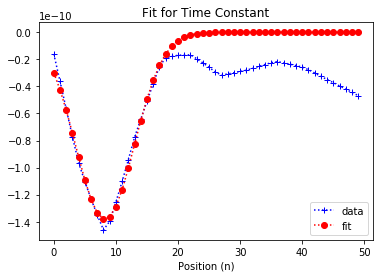

Ellipse parameters
Ellipse center =  [-235.5465809404578, -52.265246560087583]
angle of rotation =  0.195232904319
axes (a,b) =  [0.54474681886388454, 0.36579350962702978]
Eccentricity =  0.741011174158
Area (cont,ellips) =  0.282273212739 0.624294876587
Ellipse adjust =  0.946374907032
Mayor Gauss fit =  True
Minor Gauss fit =  True


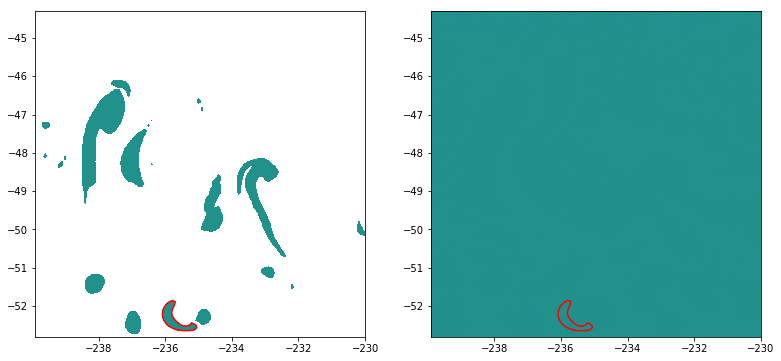

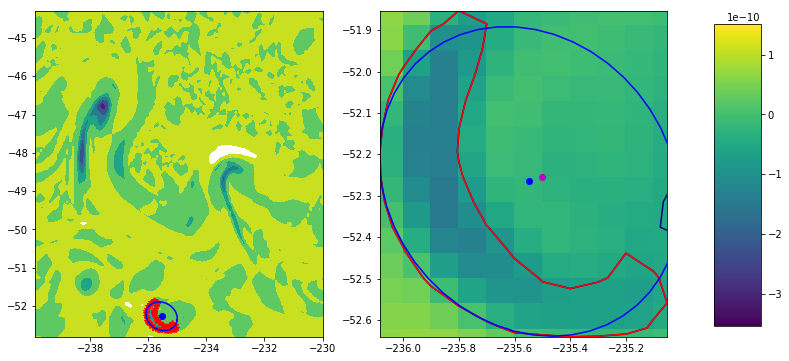

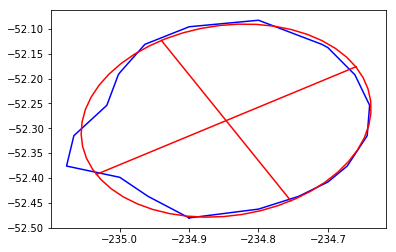

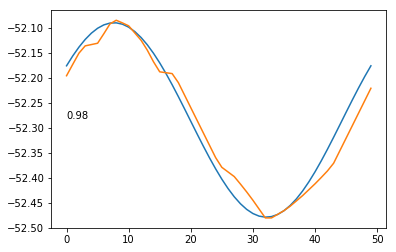

std   vs fit 0.968740999467


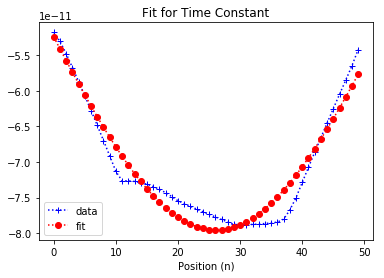

std   vs fit 0.961184183551


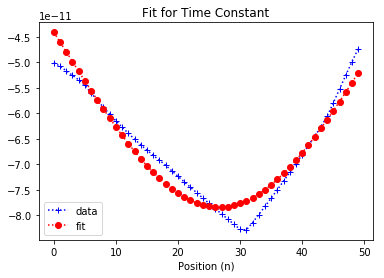

Ellipse parameters
Ellipse center =  [-234.84669400139933, -52.284657394854236]
angle of rotation =  -0.524482946439
axes (a,b) =  [0.21608887379386429, 0.18641437797770921]
Eccentricity =  0.505759402024
Area (cont,ellips) =  0.121525506867 0.126203350432
Ellipse adjust =  0.980992333336
Mayor Gauss fit =  True
Minor Gauss fit =  True


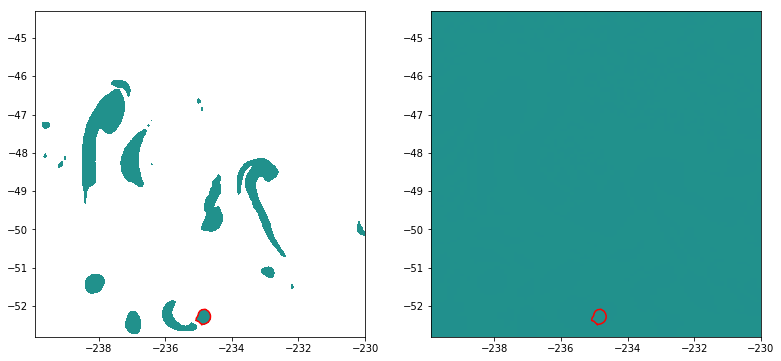

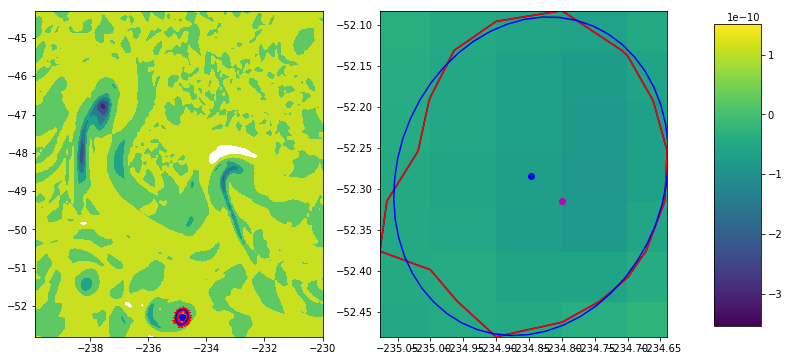

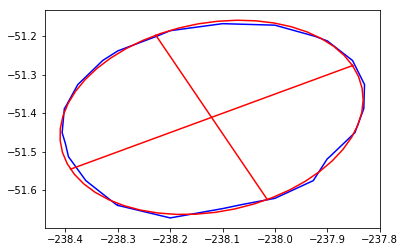

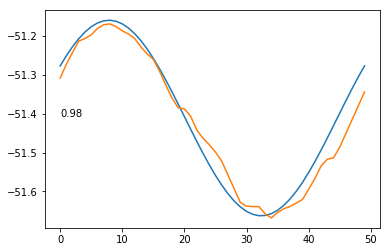

std   vs fit 0.992309910776


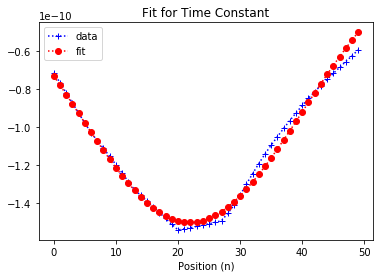

std   vs fit 0.99039671191


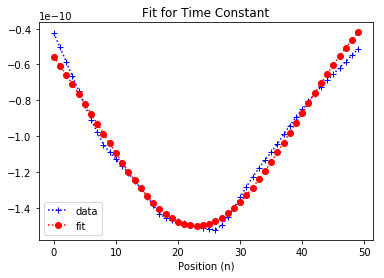

Ellipse parameters
Ellipse center =  [-238.12103205828745, -51.411079724643422]
angle of rotation =  -0.463043564856
axes (a,b) =  [0.30094759704827678, 0.23837545106671629]
Eccentricity =  0.610413507217
Area (cont,ellips) =  0.222112478892 0.224756096315
Ellipse adjust =  0.979157006052
Mayor Gauss fit =  True
Minor Gauss fit =  True


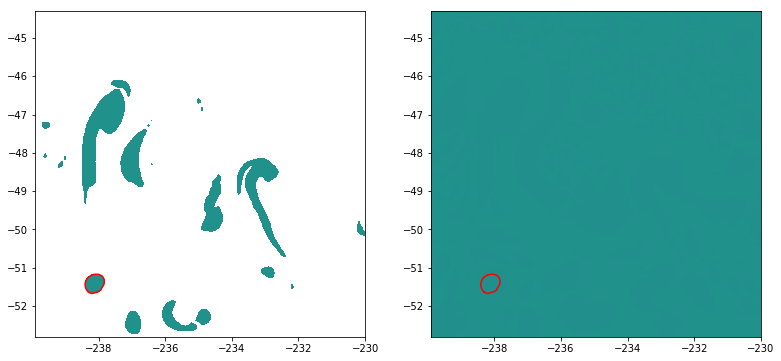

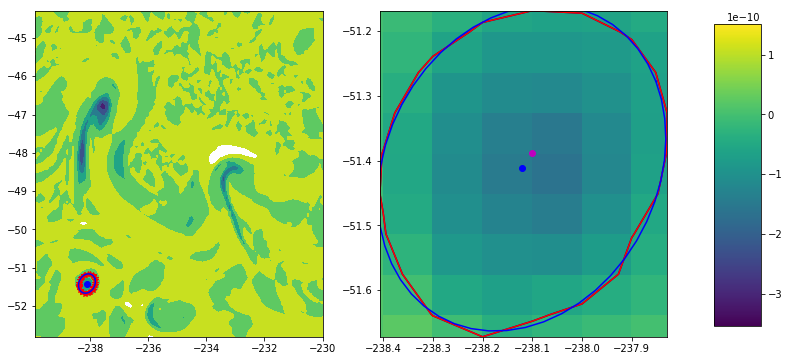

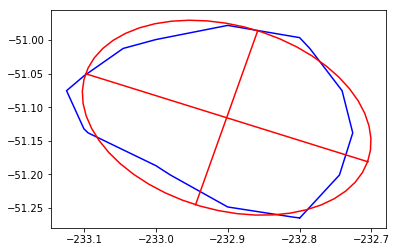

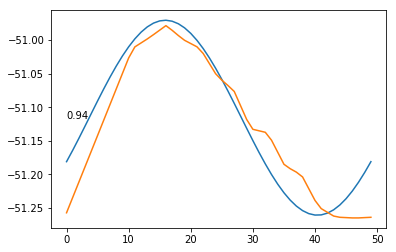

std   vs fit 0.98551011272


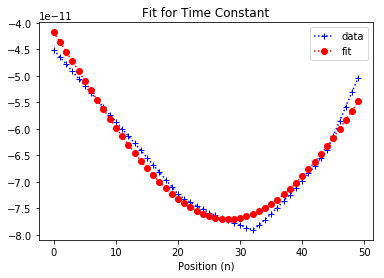

std   vs fit 0.892485323352


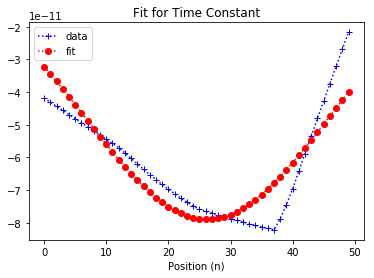

Ellipse parameters
Ellipse center =  [-232.90145215669784, -51.115613477378076]
angle of rotation =  0.322093708788
axes (a,b) =  [0.2067137768425017, 0.13651030966118988]
Eccentricity =  0.750928759708
Area (cont,ellips) =  0.0773125955602 0.0884084846475
Ellipse adjust =  0.936367525158
Mayor Gauss fit =  True
Minor Gauss fit =  False


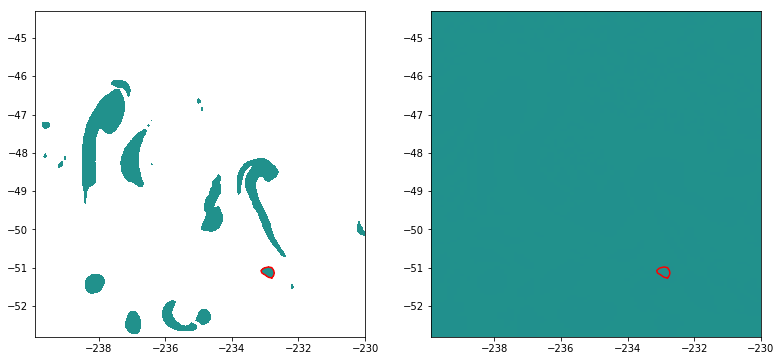

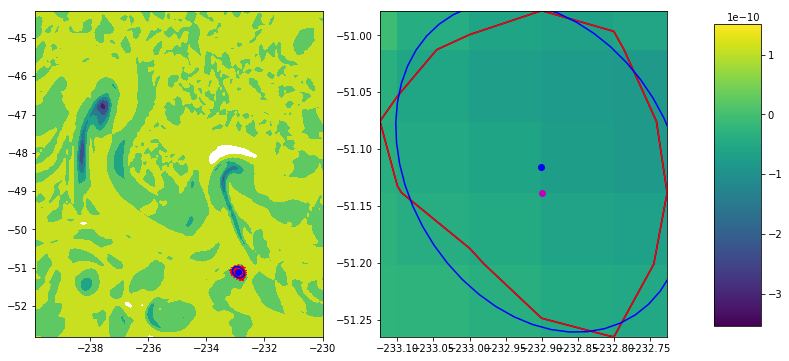

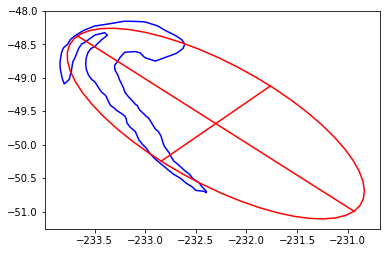

Ellipse parameters
Ellipse center =  [-232.30255919587364, -49.683158575805223]
angle of rotation =  0.764759223041
axes (a,b) =  [1.8937986823677888, 0.77925249394712048]
Eccentricity =  0.911420645939
Area (cont,ellips) =  0.926414906047 4.62350235909
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


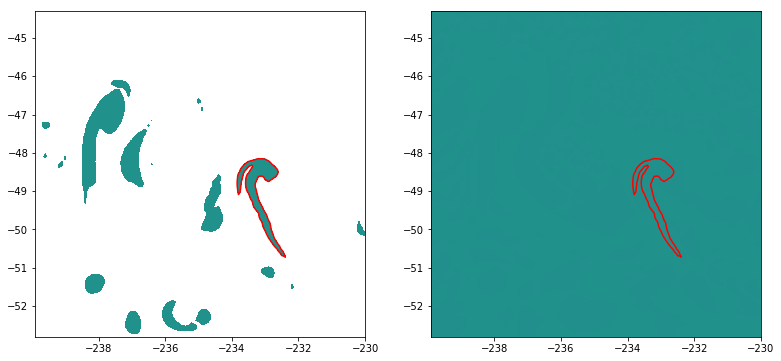

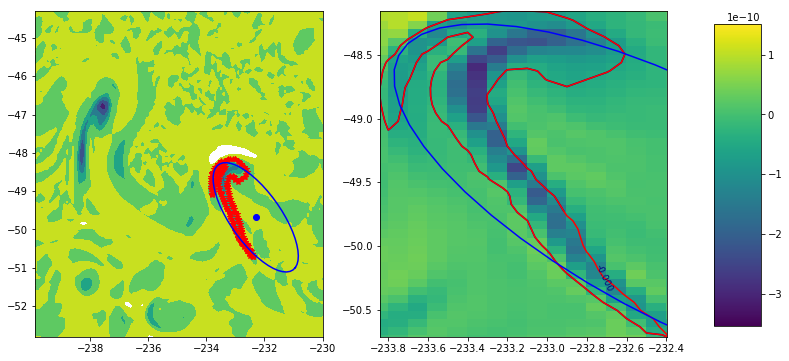

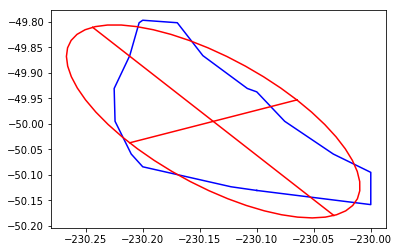

Ellipse parameters
Ellipse center =  [-230.13817398937798, -49.99509643432517]
angle of rotation =  -0.52062621101
axes (a,b) =  [0.084555722773530753, 0.21274145430504063]
Eccentricity =  0.917620510034
Area (cont,ellips) =  0.0412653773237 0.0563578222645
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


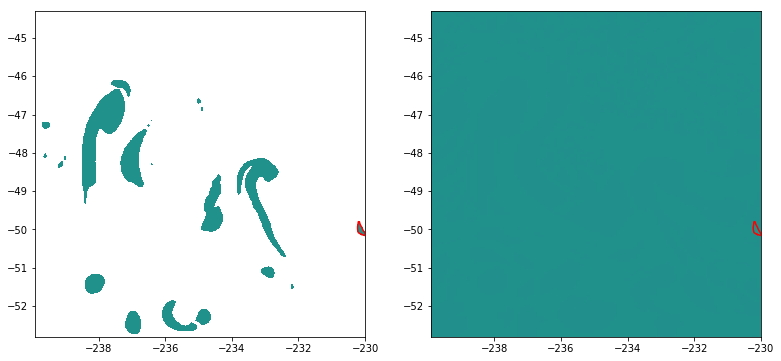

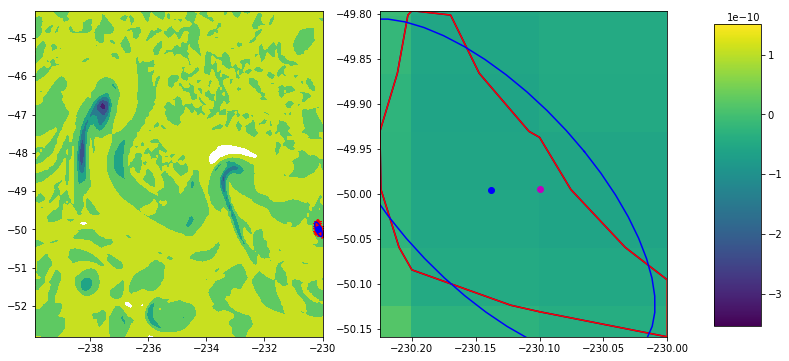

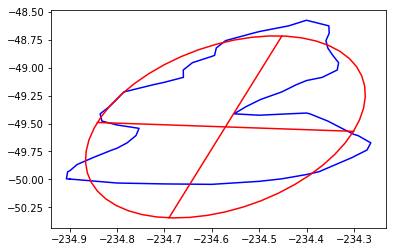

Ellipse parameters
Ellipse center =  [-234.57121451519686, -49.52985875564886]
angle of rotation =  0.145471240562
axes (a,b) =  [0.27313820389050791, 0.8223322177556277]
Eccentricity =  0.943226339181
Area (cont,ellips) =  0.516653611325 0.703702068247
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


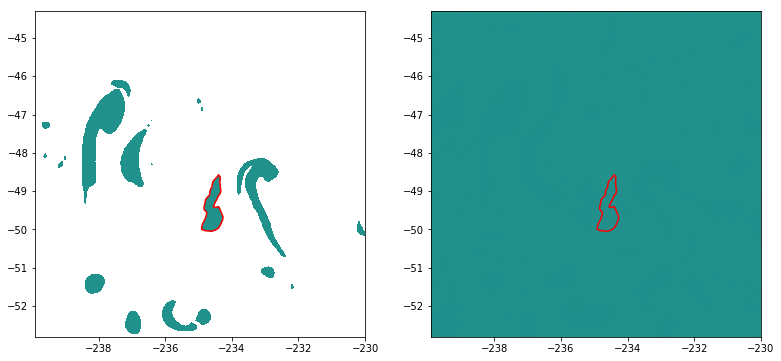

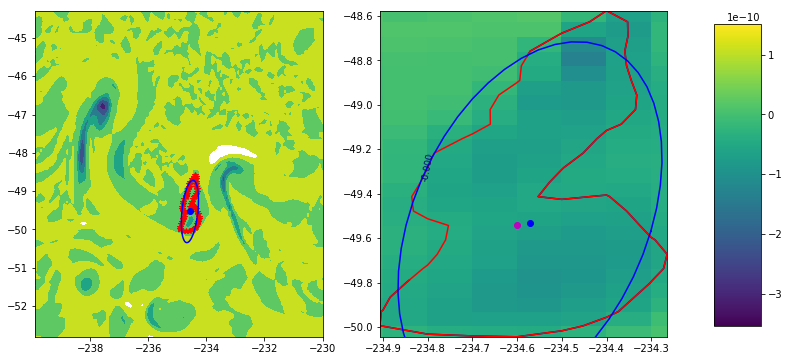

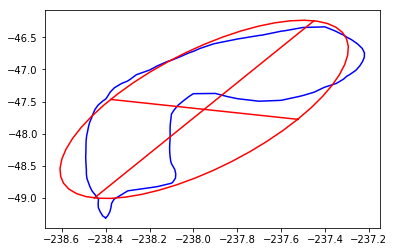

Ellipse parameters
Ellipse center =  [-237.95069155791131, -47.622288958988904]
angle of rotation =  0.348305126084
axes (a,b) =  [0.45374013826674353, 1.4671948353120385]
Eccentricity =  0.950978530161
Area (cont,ellips) =  1.41619565175 2.08571066207
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


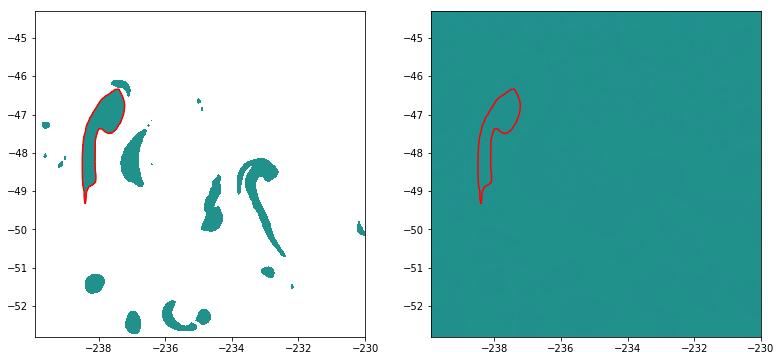

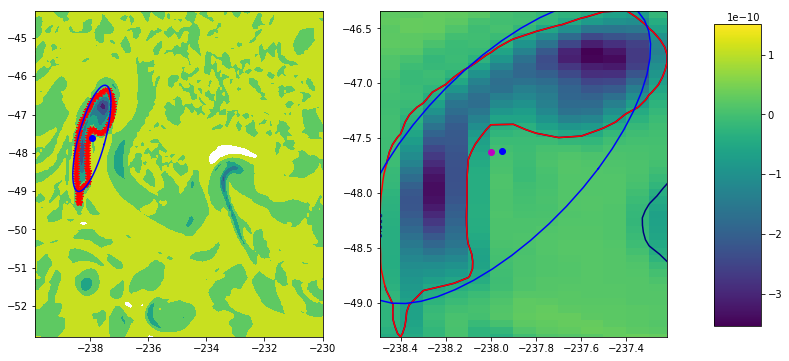

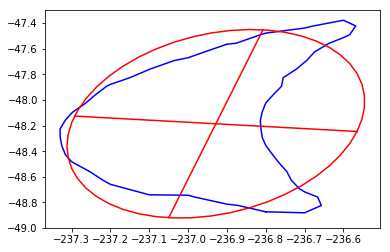

Ellipse parameters
Ellipse center =  [-236.92858570939833, -48.186049697390146]
angle of rotation =  0.164062239304
axes (a,b) =  [0.36845314221178738, 0.74339330114616131]
Eccentricity =  0.868529835656
Area (cont,ellips) =  0.597863637144 0.858143624908
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


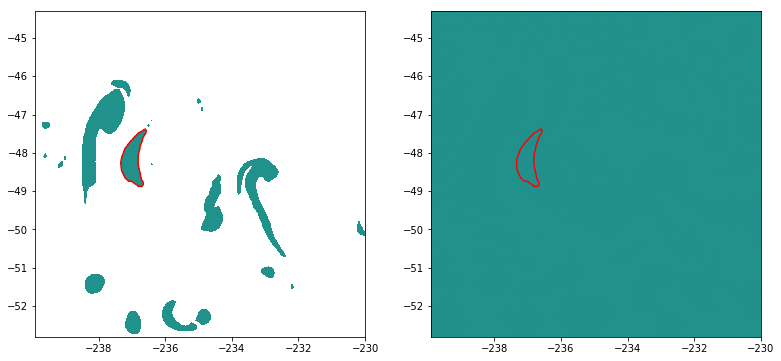

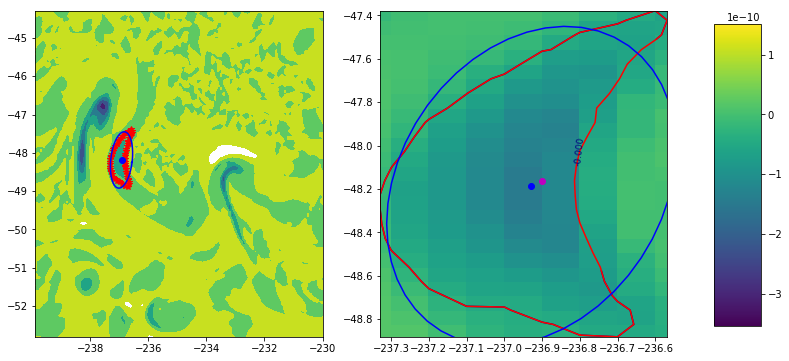

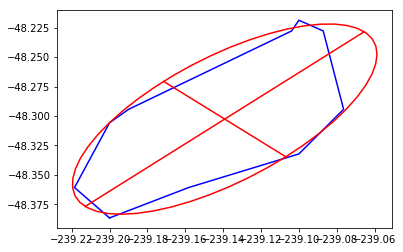

Ellipse parameters
Ellipse center =  [-239.1391701589578, -48.302682786383045]
angle of rotation =  0.781706656435
axes (a,b) =  [0.045467957922262291, 0.10461623401577368]
Eccentricity =  0.900615545746
Area (cont,ellips) =  0.0119061617152 0.0149026535801
Ellipse adjust =  nan
Mayor Gauss fit =  False
Minor Gauss fit =  False


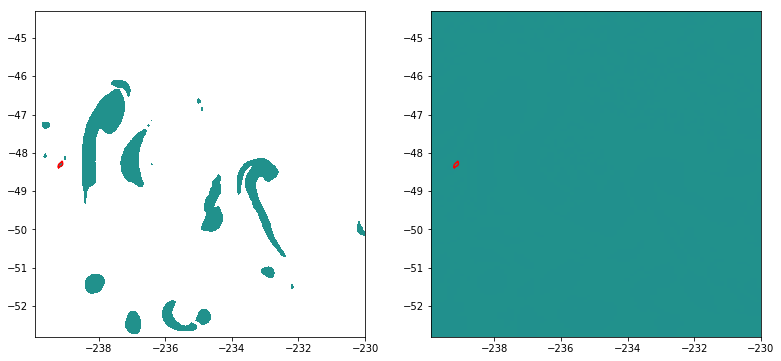

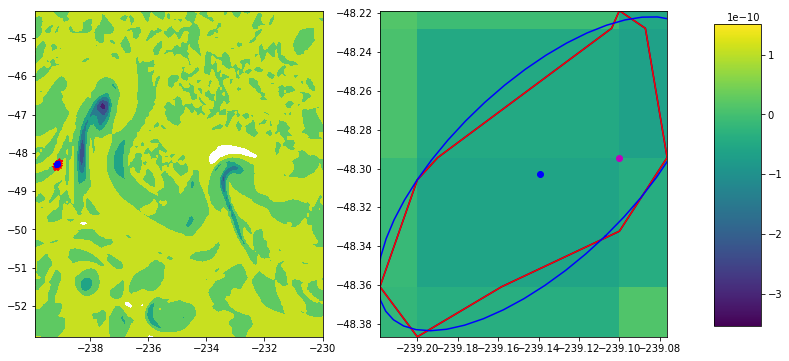

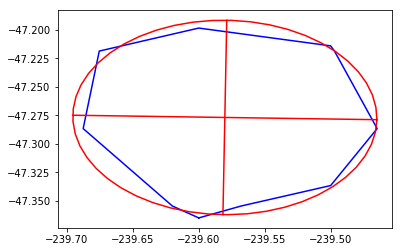

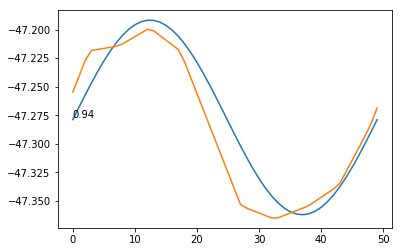

std   vs fit 0.97951414933


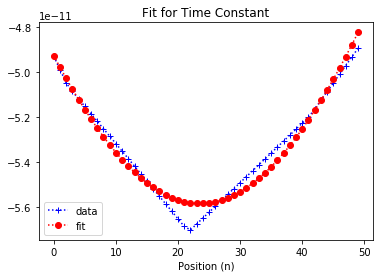

std   vs fit 0.941364752501


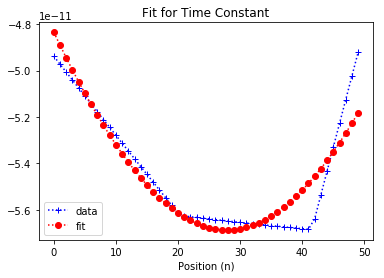

Ellipse parameters
Ellipse center =  [-239.580229141074, -47.276907726848236]
angle of rotation =  0.0169040440534
axes (a,b) =  [0.1153132937695126, 0.08514194335048951]
Eccentricity =  0.674414191868
Area (cont,ellips) =  0.0265939514138 0.0307596937637
Ellipse adjust =  0.941810307853
Mayor Gauss fit =  True
Minor Gauss fit =  True


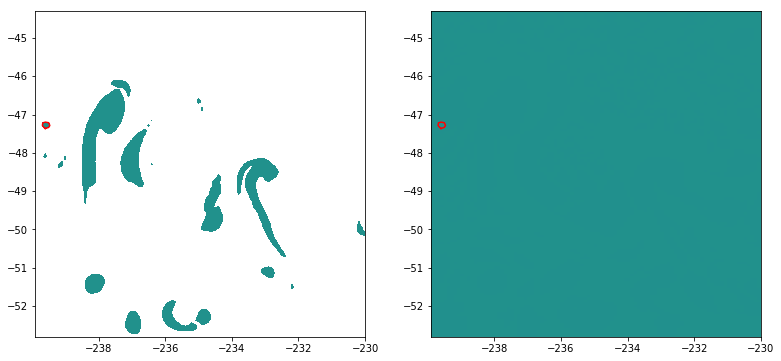

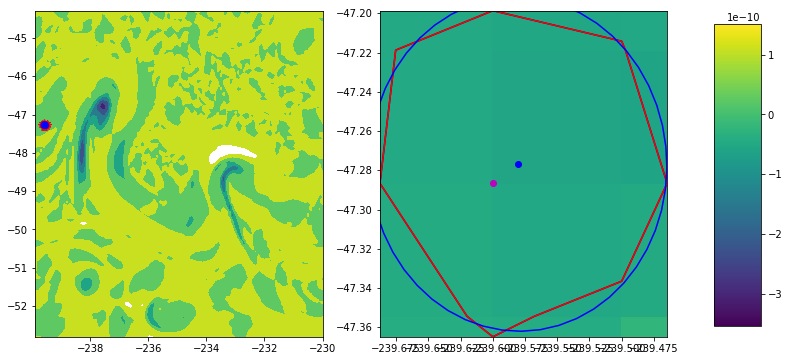

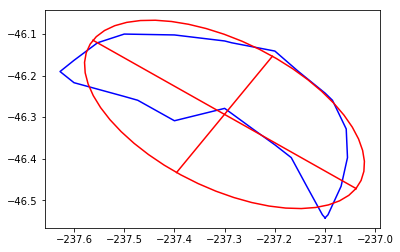

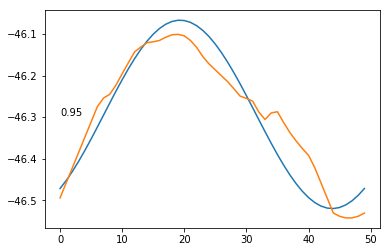

std   vs fit 0.454183536357


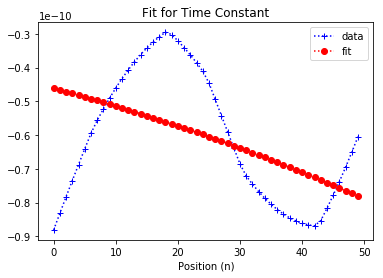

Ellipse parameters
Ellipse center =  [-237.30032419329308, -46.29333533124553]
angle of rotation =  0.598233737452
axes (a,b) =  [0.31699631552303609, 0.1694566424960548]
Eccentricity =  0.845124356418
Area (cont,ellips) =  0.101008218422 0.168295259937
Ellipse adjust =  0.951921989741
Mayor Gauss fit =  False
Minor Gauss fit =  False


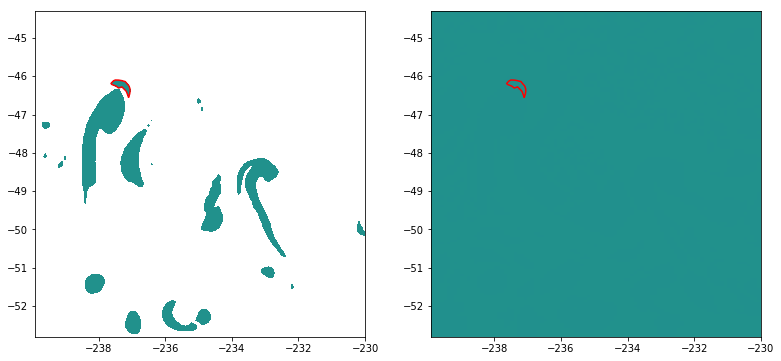

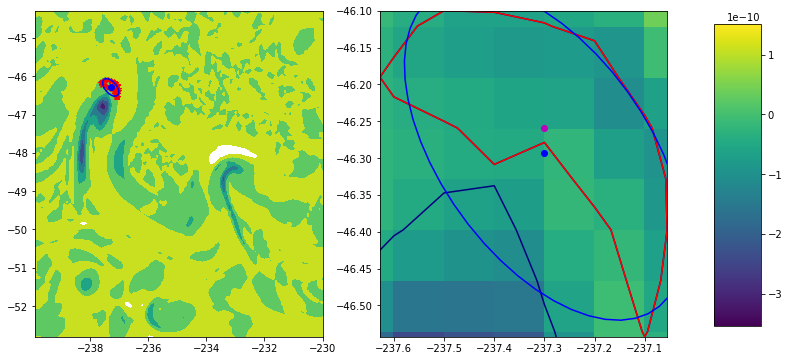

Contour is growing
eddyN 2
eddyt1pos -238.112851594 -51.4100402396
eddyt0pos -238.147015496 -51.4252192584
area [ 0.22211248] 0.0829761596397
 0% [=>]100% Time Elapsed: 123 s  

In [20]:
eddytd=analyseddyzt(okuboweiss,lon,lat,0,2,1,-1e-10,-0.5e-10,-0.5e-10,data_meant='',areamap=areamap,mask=''\
                    ,destdir='',physics='',eccenfit=0.85,ellipsrsquarefit=0.90,gaussrsquarefit=0.90,\
                    diagnostics=True,pprint=False)

# Eddy Tracking 

* ## Time tracking

In [2]:
outputpath='/g/data/v45/akm157/model_output/mom/mom01v5_kds75/output306/'
# Import SSH values to python environment.
ncfile=Dataset(outputpath+'rregionsouthern_ocean_daily_eta_t.nc')
eta=ncfile.variables['eta_t'][:]*100
# Import geographic coordinates (Lon,Lat)
lon=ncfile.variables['xt_ocean_sub01'][:]
lat=ncfile.variables['yt_ocean_sub01'][:]

In [6]:
outfile='/g/data/v45/jm5970/trackeddy_out/'
read_dictionary1 = np.load(outfile+'306_pos.npy')
dict1=read_dictionary1.item()

positions=trackmatix(dict1)

In [10]:
eddys=[243,10]
from matplotlib import animation, rc
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')

fig = plt.figure(figsize=(10, 10),facecolor='white')
gs = gridspec.GridSpec(2, 1)

ax1 = plt.subplot(gs[0,0])

lonmm,latmm=np.meshgrid(lon,lat)

map = Basemap(projection='ortho',lat_0=-90,lon_0=-100,resolution='c',ax=ax1)
lonm,latm=map(lonmm,latmm)
map.drawmeridians(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
map.drawparallels(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
map.fillcontinents(color='black',lake_color='aqua')
map.drawcoastlines()
map.drawcoastlines()

#ax2 = plt.subplot(gs[0,1])

#map = Basemap(projection='ortho',lat_0=-90,lon_0=-100,resolution='c',ax=ax2)
#lonm,latm=map(lonmm,latmm)
#map.drawmeridians(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
#map.drawparallels(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
#map.fillcontinents(color='black',lake_color='aqua')
#map.drawcoastlines()
#map.drawcoastlines()
    
xx2,yy2=map(positions[0,eddys[0],:],positions[1,eddys[0],:])
xx2[xx2==1.00000000e+30]==np.nan
yy2[yy2==1.00000000e+30]==np.nan

xx3,yy3=map(positions[0,eddys[1],:],positions[1,eddys[1],:])
xx3[xx3==1.00000000e+30]==np.nan
yy3[yy3==1.00000000e+30]==np.nan
    
quad1 = ax1.pcolormesh(lonm,latm,eta[0,:,:],shading='gouraud',cmap=cm.cm.balance,\
          vmin=-80,vmax=80)
line1,=ax1.plot(xx2[0],yy2[0],'*g')
line2,=ax1.plot(xx2[-1],yy2[-1],'om')
    
#quad2 = ax2.pcolormesh(lonm,latm,ssha[0,:,:],shading='gouraud',cmap=cm.cm.balance,\
#          vmin=-80,vmax=80)
#ax2.plot(xx3[0],yy3[0],'*g')
#ax2.plot(xx3[-1],yy3[-1],'om')

ax3 = plt.subplot(gs[1,0])
ax3.plot(positions[0,eddys[0],0],positions[1,eddys[0],0],'*g')
ax3.plot(positions[0,eddys[0],-1],positions[1,eddys[0],-1],'om')
line3,=ax3.plot(positions[0,eddys[0],0],positions[1,eddys[0],0],'-k')

#ax4 = plt.subplot(gs[1,1])
#ax4.plot(positions[0,eddys[1],0],positions[1,eddys[1],0],'*g')
#ax4.plot(positions[0,eddys[1],-1],positions[1,eddys[1],-1],'om')
#line4,=ax4.plot(positions[0,eddys[1],0],positions[1,eddys[1],0],'-k')
    
def init():
    quad1.set_array([])
    quad2.set_array([])
    return quad1
    
def animate(iter):
    quad1.set_array(eta[iter,:,:].ravel())
#    quad2.set_array(eta[iter,:,:].ravel())
    line1.set_data(positions[0,eddys[0],0:iter],positions[1,eddys[0],0:iter])
    line2.set_data(positions[0,eddys[1],0:iter],positions[1,eddys[1],0:iter])
    line3.set_data(positions[0,eddys[0],0:iter],positions[1,eddys[0],0:iter])
#    line4.set_data(positions[0,eddys[1],0:iter],positions[1,eddys[1],0:iter])
    plt.suptitle('Time: %03d'%(iter))
    sys.stdout.write("\r\x1b[K"+iter.__str__())
    sys.stdout.flush()
    return quad1
    
gs.tight_layout(fig)
    
anim2 = animation.FuncAnimation(fig,animate,frames=30,interval=100,blit=False,repeat=True)
plt.close()
anim2    

29ng: Cannot label parallels on Orthographic basemap

https://github.com/Josue-Martinez-Moreno/trackeddy/blob/master/output/eddyn_13.gif

* ## Extracting fields

In [3]:
outfile='/g/data/v45/jm5970/trackeddy_out/'
eddy_tracking = np.load(outfile+'306_pos.npy')
eddy_tracking_struct=eddy_tracking.item()
eddy_tracking = np.load(outfile+'307_pos.npy')
eddy_tracking_struct_1=eddy_tracking.item()

dictjoin=joindict(eddy_tracking_struct,eddy_tracking_struct_1)

outfile='/g/data/v45/jm5970/trackeddy_out/'
eddy_tracking = np.load(outfile+'306_neg.npy')
eddy_tracking_struct=eddy_tracking.item()
eddy_tracking = np.load(outfile+'307_neg.npy')
eddy_tracking_struct_1=eddy_tracking.item()

dictjoin_n=joindict(eddy_tracking_struct,eddy_tracking_struct_1)

In [4]:
# Output data path
outputpath='/g/data/v45/akm157/model_output/mom/mom01v5_kds75/output306/'
# Import SSH values to python environment.
ncfile=Dataset(outputpath+'rregionsouthern_ocean_daily_eta_t.nc')
eta=ncfile.variables['eta_t'][:]*100
# Import geographic coordinates (Lon,Lat)
lon=ncfile.variables['xt_ocean_sub01'][:]
lat=ncfile.variables['yt_ocean_sub01'][:]

In [5]:
# Output data path
outputpath='/g/data/v45/akm157/model_output/mom/mom01v5_kds75/output307/'
# Import SSH values to python environment.
ncfile=Dataset(outputpath+'rregionsouthern_ocean_daily_eta_t.nc')
eta1=ncfile.variables['eta_t'][:]*100

In [6]:
ssh=vstack((eta,eta1))
ssha=eta=eta1=0

In [7]:
ncfile=Dataset('/home/156/jm5970/notebooks/traceddy/data.input/meanssh_10yrs_AEXP.nc')
ssh_mean=squeeze(ncfile.variables['SSH_mean'][:])

areamap=array([[0,len(lon)],[0,len(lat)]])
ssha=ssh-ssh_mean
ssh=ssh_mean=0

In [8]:
eddys_p=exeddydt(dictjoin,lat,lon,ssha,1,diagnostics=False)
eddys_n=exeddydt(dictjoin_n,lat,lon,ssha,1,diagnostics=False)
eddys=eddys_p+eddys_n
eddys_p=eddys_n=0

*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******


In [10]:
from matplotlib import animation, rc
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')

fig = plt.figure(figsize=(10, 10),facecolor='white')
gs = gridspec.GridSpec(1, 1)

#############################

ax1 = plt.subplot(gs[0,0])

lonmm,latmm=np.meshgrid(lon,lat)

map = Basemap(projection='ortho',lat_0=-90,lon_0=-100,resolution='c',ax=ax1)
lonm,latm=map(lonmm,latmm)
map.drawmeridians(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
map.drawparallels(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
map.fillcontinents(color='black',lake_color='aqua')
map.drawcoastlines()
map.drawcoastlines()
quad1 = ax1.pcolormesh(lonm,latm,eddys[0,:,:],shading='gouraud',cmap=cm.cm.balance,\
                  vmin=-40,vmax=40)
cb1 = fig.colorbar(quad1,ax=ax1)
    
def init():
    quad1.set_array([])
    return quad1
    
def animate(iter):
    quad1.set_array(eddys[iter,:,:].ravel())
    ax1.set_title('%03d'%(iter))
    sys.stdout.write("\r\x1b[K"+iter.__str__())
    sys.stdout.flush()
    return quad1
    
gs.tight_layout(fig)
    
anim2 = animation.FuncAnimation(fig,animate,frames=180,interval=100,blit=False,repeat=True)
plt.close()
anim2

179g: Cannot label parallels on Orthographic basemap

## Time average descomposition
#### $\ \ \ \ \ \ \ \  KE  \ \ \ \ \ \ \ \ = \ \ \ \ \ \ MKE \ \ \ \ \ \ + \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ EKE\ \ \ \ \ \ \ \  \ \ \ \ \ \ \ \ + \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ KE^{O^2}\ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \  $

#### $\frac{1}{2}\rho_0(u^2+v^2)=\frac{1}{2}\rho_0(\bar{u}^2+\bar{v}^2)+\frac{1}{2}\rho_0((u-\bar{u})^2+(v-\bar{u})^2)+\rho_0(\bar{u}(u-\bar{u})+\bar{v}(v-\bar{u}))$

## Separation of EKE based on spatial definition.
#### $EKE \equiv EKE_{eddy}+ [EKE_{jet}+EKE_{residual}]$

## Separation of KE based on spatial definition.
#### $\frac{1}{2}\rho_0(u^2+v^2)=\frac{1}{2}\rho_0(u_{eddy}^2+v_{eddy}^2)+\left[\frac{1}{2}\rho_0(u_{jet}^2+v_{jet}^2)+\frac{1}{2}\rho_0(u_{residual}^2+v_{residual}^2)\right]$

In [4]:
uname='U'
vname='V'
units='m/s'
nc_description='Velocity of SSHa at the Southern Ocean of January over 1 years'
dim='2D'
ncfile=Dataset('/home/156/jm5970/notebooks/traceddy/data.input/meanssh_10yrs_AEXP.nc')
ssh_mean=squeeze(ncfile.variables['SSH_mean'][:])

for ii in range(309,310):
    outfile='/g/data/v45/jm5970/trackeddy_out/'
    eddy_tracking = np.load(outfile+str(ii)+'_pos.npy')
    eddy_tracking_struct=eddy_tracking.item()
    eddy_tracking = np.load(outfile+str(ii)+'_neg.npy')
    eddy_tracking_struct_neg=eddy_tracking.item()
    
    # Output data path
    outputpath='/g/data/v45/akm157/model_output/mom/mom01v5_kds75/output'+str(ii)+'/'
    # Import SSH values to python environment.
    ncfile=Dataset(outputpath+'rregionsouthern_ocean_daily_eta_t.nc')
    ssha=(ncfile.variables['eta_t'][:]*100)-ssh_mean
    lon=ncfile.variables['xt_ocean_sub01'][:]
    lat=ncfile.variables['yt_ocean_sub01'][:]

    u_prime_eddy=zeros(shape(ssha))
    u_prime_eddy_n=zeros(shape(ssha))
    v_prime_eddy=zeros(shape(ssha))
    v_prime_eddy_n=zeros(shape(ssha))
    
    for tt in range(0,shape(ssha)[0]):
        ufilename=Dataset('/home/156/jm5970/notebooks/traceddy/data.input/ssha_'+str(ii)+'_u_1yrs.nc')

        u_prime=np.squeeze(ufilename.variables['U'][tt,:,:])
        vfilename=Dataset('/home/156/jm5970/notebooks/traceddy/data.input/ssha_'+str(ii)+'_v_1yrs.nc')
        v_prime=np.squeeze(vfilename.variables['V'][tt,:,:])
    
        u_prime_eddy[tt,:,:]=exeddy(eddy_tracking_struct,lat,lon,u_prime,0,1,inside=ssha[tt,:,:],diagnostics=False)
        u_prime_eddy_n[tt,:,:]=exeddy(eddy_tracking_struct_neg,lat,lon,u_prime,0,1,inside=ssha[tt,:,:],diagnostics=False)
        v_prime_eddy[tt,:,:]=exeddy(eddy_tracking_struct,lat,lon,v_prime,0,1,inside=ssha[tt,:,:],diagnostics=False)
        v_prime_eddy_n[tt,:,:]=exeddy(eddy_tracking_struct_neg,lat,lon,v_prime,0,1,inside=ssha[tt,:,:],diagnostics=False)
        
    u_prime=u_prime_eddy+u_prime_eddy_n
    v_prime=v_prime_eddy+v_prime_eddy_n
    
    ufilename='/home/156/jm5970/notebooks/traceddy/data.input/30'+str(ii)+'_u_prime_eddy_1yrs.nc'
    vargeonc(ufilename,lat,lon,u_prime,shape(u_prime)[0],uname,nc_description=nc_description,units=units,dt='',dim=dim)
    vfilename='/home/156/jm5970/notebooks/traceddy/data.input/30'+str(ii)+'_v_prime_eddy_1yrs.nc'
    vargeonc(vfilename,lat,lon,v_prime,shape(v_prime)[0],vname,nc_description=nc_description,units=units,dt='',dim=dim)
    

*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddie

*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddie

*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddie

*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddies******
*******End the Removing of eddies******
*******Removing of eddie

## Seasonal variation of the energy

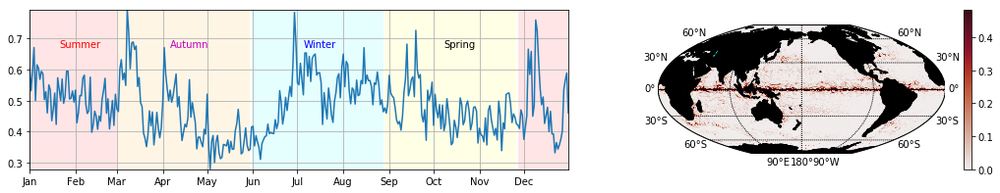

In [2]:
year=1993
monthsin=[1,4,7,10]
monthsend=[4,7,10,13]
mean_year=sat_seasonal_variation(year,monthsin,monthsend,areamap='')

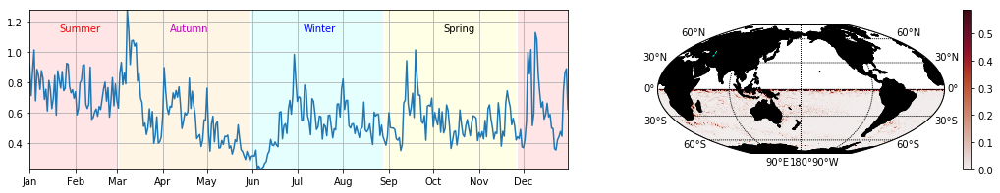

In [3]:
year=1993
monthsin=[1,4,7,10]
monthsend=[4,7,10,13]
areamap=array([[0,1440],[0,360]])
mean_year=sat_seasonal_variation(year,monthsin,monthsend,areamap=areamap)

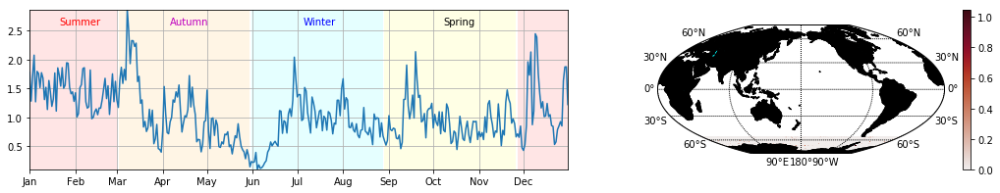

In [17]:
year=1993
monthsin=[1,4,7,10]
monthsend=[4,7,10,13]
areamap=array([[0,1440],[0,140]])
mean_year=sat_seasonal_variation(year,monthsin,monthsend,areamap=areamap)

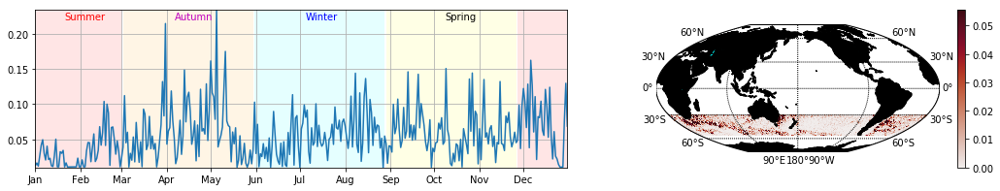

In [16]:
year=1993
monthsin=[1,4,7,10]
monthsend=[4,7,10,13]
areamap=array([[0,1440],[140,240]])
mean_year=sat_seasonal_variation(year,monthsin,monthsend,areamap=areamap)

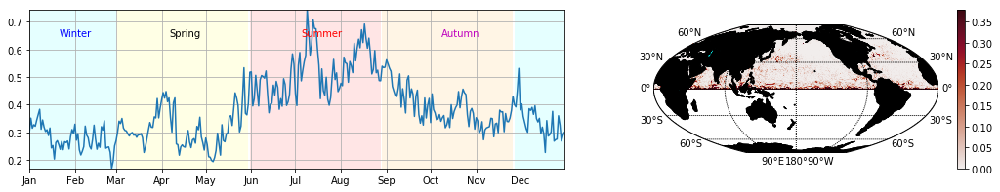

In [6]:
year=1993
monthsin=[1,4,7,10]
monthsend=[4,7,10,13]
areamap=array([[0,1440],[360,720]])
mean_year=sat_seasonal_variation(year,monthsin,monthsend,areamap=areamap,hemisphere='North')

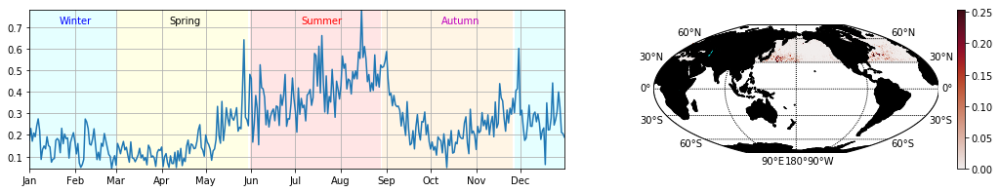

In [7]:
year=1993
monthsin=[1,4,7,10]
monthsend=[4,7,10,13]
areamap=array([[0,1440],[480,620]])
mean_year=sat_seasonal_variation(year,monthsin,monthsend,areamap=areamap,hemisphere='North')

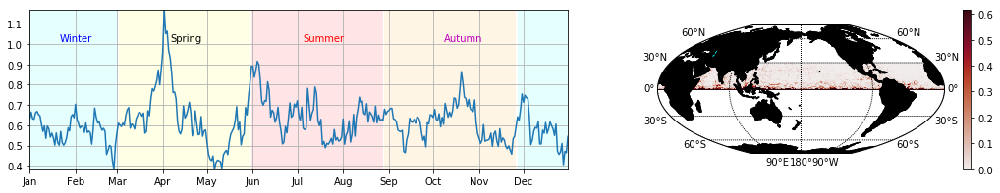

In [8]:
year=1993
monthsin=[1,4,7,10]
monthsend=[4,7,10,13]
areamap=array([[0,1440],[360,480]])
mean_year=sat_seasonal_variation(year,monthsin,monthsend,areamap=areamap,hemisphere='North')

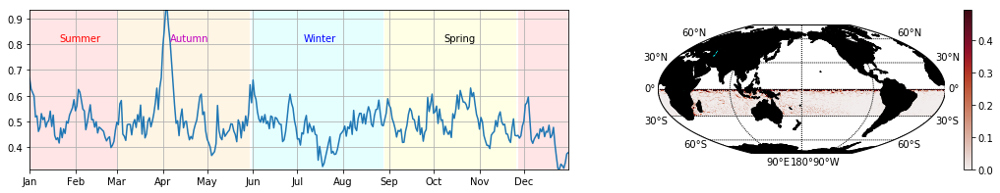

In [9]:
year=1993
monthsin=[1,4,7,10]
monthsend=[4,7,10,13]
areamap=array([[0,1440],[240,360]])
mean_year=sat_seasonal_variation(year,monthsin,monthsend,areamap=areamap)

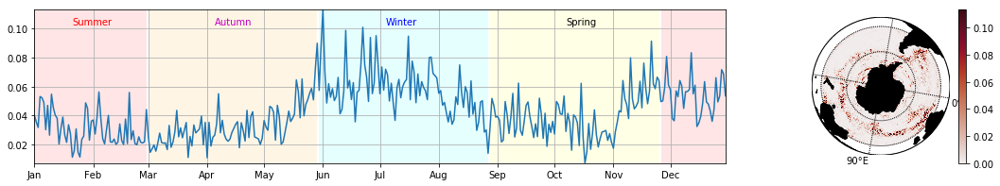

In [11]:
mean_year=sim_seasonal_variation(306,310,areamap='',plot=True,hemisphere='')

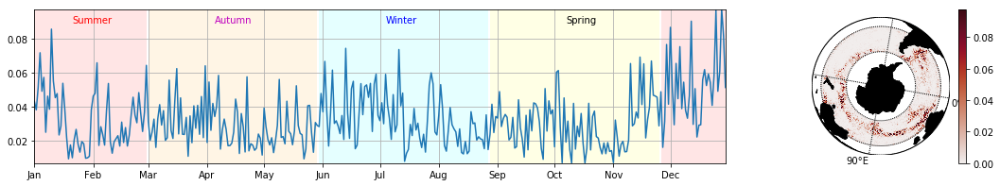

In [12]:
areamap=array([[0,3600],[500,931]])
mean_year=sim_seasonal_variation(306,310,areamap=areamap,plot=True,hemisphere='')

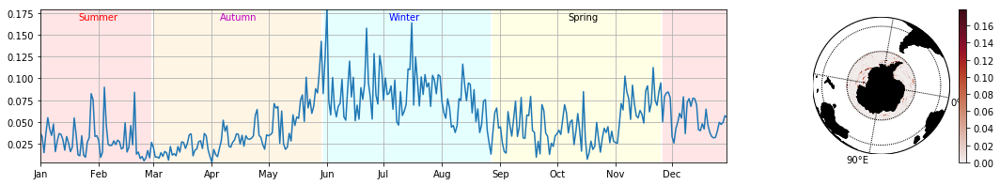

In [14]:
areamap=array([[0,3600],[0,500]])
mean_year=sim_seasonal_variation(306,310,areamap=areamap,plot=True,hemisphere='')

## $EKE_{eddy}$ vs. $\vec{u_e}_{ddy}$

In [ ]:
eke_eddy=sim_seasonal_variation_eke(306,310,areamap='',plot=True,hemisphere='')

# Future Work

### * Compare algorithm against publications.
### * Research seasonal variability.
### * Solve more bugs.
### * Create a new eddy's database.
### * Open source code.

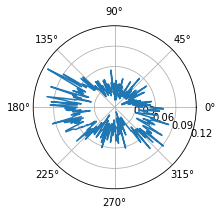

In [8]:
mean_year=sim_seasonal_variation(306,310,areamap='',plot=True,hemisphere='')

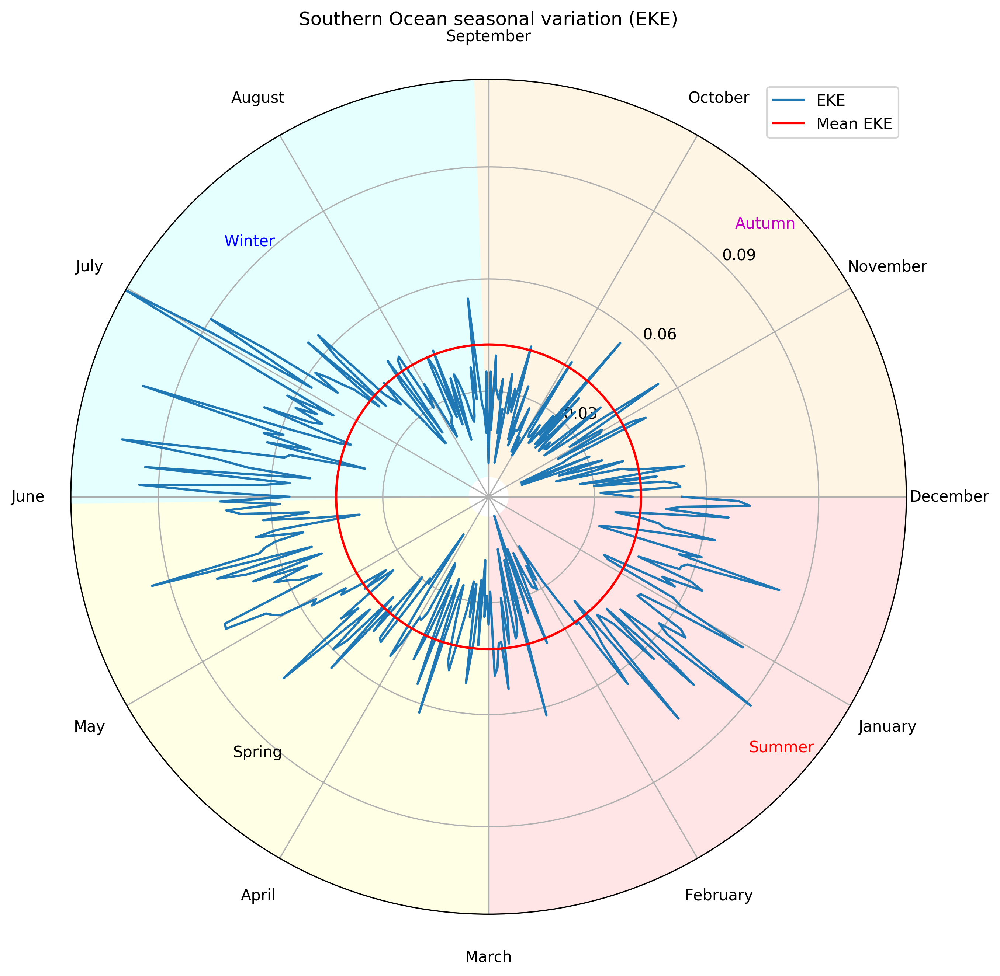

In [339]:
fig = plt.figure(figsize=(10, 10),dpi=300)
ax = plt.subplot(111, projection='polar')

x=flipud(linspace(0,2*pi,365))
ax.plot(x, flipud(mean_year),'-',label='EKE')
ax.plot(x, mean(mean_year)*ones(365),'-r',label='Mean EKE')
ax.set_rticks([0.03, 0.06, 0.09, 0.12])  # less radial ticks
ax.set_rlabel_position(45)  # get radial labels away from plotted line
ax.grid(True)
ax.set_xticks(np.linspace(0,  2*pi, 12, endpoint=False))
ax.set_xticklabels(flipud(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August','September','October','November','December']))
ax.set_title("Southern Ocean seasonal variation (EKE)", va='bottom')

ax.tick_params(direction='out', length=6, width=2, colors='k',pad=15)

ax.text(x[181+45], max(mean_year)-np.mean(mean_year)/3,'Winter',color='blue')
ax.fill_between(x[181:272], mean_year.min(), mean_year.max(), facecolor='cyan', alpha=0.1)
ax.text(x[271+45], max(mean_year)-np.mean(mean_year)/3,'Autumn',color='m')
ax.fill_between(x[271:361], mean_year.min(), mean_year.max(), facecolor='orange', alpha=0.1)
ax.text(x[45], max(mean_year)-np.mean(mean_year)/3,'Summer',color='red')
ax.fill_between(x[0:92], mean_year.min(), mean_year.max(), facecolor='red', alpha=0.1)
ax.text(x[91+45], max(mean_year)-np.mean(mean_year)/3,'Spring',color='black')
ax.fill_between(x[91:182], mean_year.min(), mean_year.max(), facecolor='yellow', alpha=0.1)
ax.fill_between(x[360:], mean_year.min(), mean_year.max(), facecolor='orange', alpha=0.1)

ax.set_rmax(mean_year.max())
ax.xaxis.labelpad = 40
legend()



In [306]:
r = np.linspace(0, 2, 365)
t =np.linspace(-pi, pi, 365)

rad,theta=meshgrid(r,t)

#u = theta*sin(rad)
#v = theta*cos(rad)

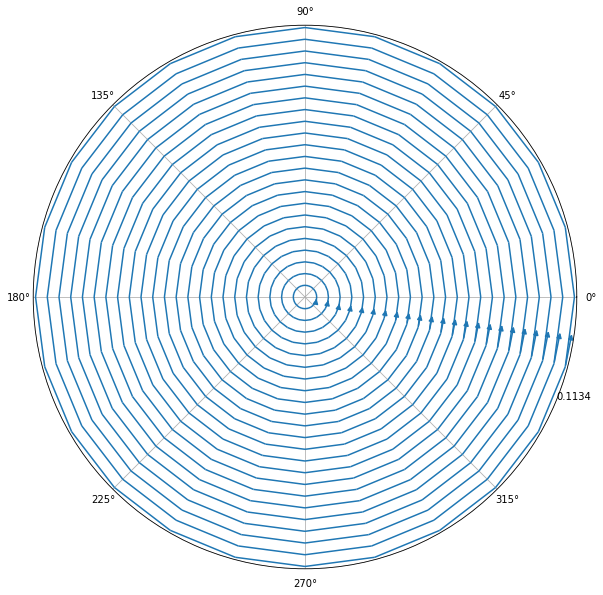

In [322]:
fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(111, projection='polar')
r = np.linspace(0,mean_year.max(), 5)
t =np.linspace(-pi, pi, 5)
x,y=meshgrid(linspace(0,mean_year.max(),5),linspace(0,mean_year.max(),5))
u=x*0+2
v=x*0
ax.streamplot(t,r,u,v)
ax.set_rmax(mean_year.max())
ax.set_rticks([mean_year.max()])  # less radial ticks
ax.set_rlabel_position(-22.5)  # get radial labels away from plotted line
ax.grid(True)

In [308]:
x,y=meshgrid(linspace(0,10,365),linspace(0,10,365))

u=x*0+2
v=y*0


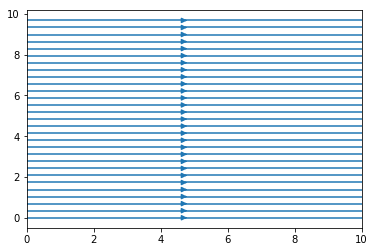

In [299]:
streamplot(x,y,u,v)